In [1]:
%matplotlib inline

# Import custom scripts

In [2]:
path_scripts = '/Users/simjoo/Projects/10X_Skin/scripts/'

In [3]:
import sys
sys.path.append(path_scripts)

In [4]:
from Skin10X_misc_scripts_v1_4 import *
from Skin10X_plot_v1_0 import *
from Skin10X_affinity_propagation_v1_4 import *
from Skin10X_mann_whitney_u_v1_3 import *

/Users/simjoo/anaconda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
/Users/simjoo/.local/lib/python3.6/site-packages/scanpy/api/__init__.py:6: FutureWarning: 

In a future version of Scanpy, `scanpy.api` will be removed.
Simply use `import scanpy as sc` and `import scanpy.external as sce` instead.

  FutureWarning


In [5]:
import pickle

# Initialize engines

In [6]:
from ipyparallel import Client

In [7]:
c = Client(profile='default')

In [8]:
dview = c[:]

In [9]:
dview.execute('import sys')
dview.execute('sys.path.append("/Users/simjoo/Projects/10X_Skin/scripts/")')
dview.execute('from Skin10X_affinity_propagation_v1_4 import *')
dview.execute('Skin10X_mann_whitney_u_v1_4 import *')

<AsyncResult: execute>

# Import Data

In [10]:
exp_id = '201806201840'
path_input = '/Users/simjoo/Projects/10X_Skin/data_input/v1.5/'
path_output = '/Users/simjoo/Projects/10X_Skin/data_output/v1.5'
path_figures = '/Users/simjoo/Projects/10X_Skin/figures/v1.5'

In [11]:
seq = loadData_v1(path_output, exp_id, 'seq', 'DataFrame')

In [12]:
seqN = loadData_v1(path_output, exp_id, 'seqN', 'DataFrame')

In [13]:
seqN_log2 = np.log2(seqN + 1)

In [14]:
cl_c_1st = loadData_v1(path_output, exp_id, 'cl_c_1st', 'Series')

In [15]:
cl_c_2nd = loadData_v1(path_output, exp_id, 'cl_c_2nd', 'Series')

In [16]:
cl_c_ANA = cl_c_2nd[[ix for ix in cl_c_2nd.index if cl_c_2nd[ix].split()[0] == 'ANA']]

In [17]:
#cl_c_ANA = AP_invert_index(cl_c_ANA, 'ANA - 21')
cl_c_ANA = AP_invert_index(cl_c_ANA, 'ANA - 11')

In [18]:
cl_c_ANA_IRS = loadData_v1(path_output, exp_id, 'cl_c_ANA_IRS', 'Series')

In [19]:
tsne_1st = loadData_v1(path_output, exp_id, 'tsne_1st', 'DataFrame')

In [20]:
umap_ANA = loadData_v1(path_output, exp_id, 'umap_ANA', 'DataFrame')

In [21]:
umap_ANA_IRS = loadData_v1(path_output, exp_id, 'umap_ANA_IRS', 'DataFrame')

In [22]:
MWU_av_ANA = loadData_v1(path_output, exp_id, 'MWU_av_ANA', 'DataFrame')
MWU_gr_ANA = loadData_v1(path_output, exp_id, 'MWU_gr_ANA', 'DataFrame')

In [23]:
MWU_av_ANA_IRS = loadData_v1(path_output, exp_id, 'MWU_av_ANA_IRS', 'DataFrame')
MWU_gr_ANA_IRS = loadData_v1(path_output, exp_id, 'MWU_gr_ANA_IRS', 'DataFrame')

In [24]:
cc_score = loadData_v1(path_output, exp_id, 'cc_score','DataFrame')
cc_score.index = [ix.replace('.','-') for ix in cc_score.index]

In [25]:
cc_score_v2 = loadData_v1(path_output, exp_id, 'cc_score_v2','Series')

In [26]:
cells_stage = pd.Series([c[-2:] for c in seq.columns], index = seq.columns)

In [27]:
bc = loadData_v1(path_input, exp_id, 'assigned_barcodes', 'Series')
cells_replicate = pd.Series(index = seq.columns)
for ix in cells_replicate.index:
    if type(bc['%s-1' % ix[:-3]]) != str:
        cells_replicate[ix] = '%s unassigned' % ix.split('-')[-1]
    elif bc['%s-1' % ix[:-3]] == 'unassigned':
        cells_replicate[ix] = '%s unassigned' % ix.split('-')[-1]
    else:
        cells_replicate[ix] = bc['%s-1' % ix[:-3]]

In [28]:
path = '%s/%s_cmap_1st.pkl' % (path_output, exp_id)
f = open(path, 'rb')
cmap_1st = pickle.load(f)

In [29]:
path = '%s/%s_cmap_2nd.pkl' % (path_output, exp_id)
f = open(path, 'rb')
cmap_2nd = pickle.load(f)

In [30]:
cmap_time = {'5w':'#fb9a99','9w':'#b2df8a'}

In [31]:
markers_time = {'5w':'o','9w':'o'}

# t-SNE - cell groups - only Msx2+

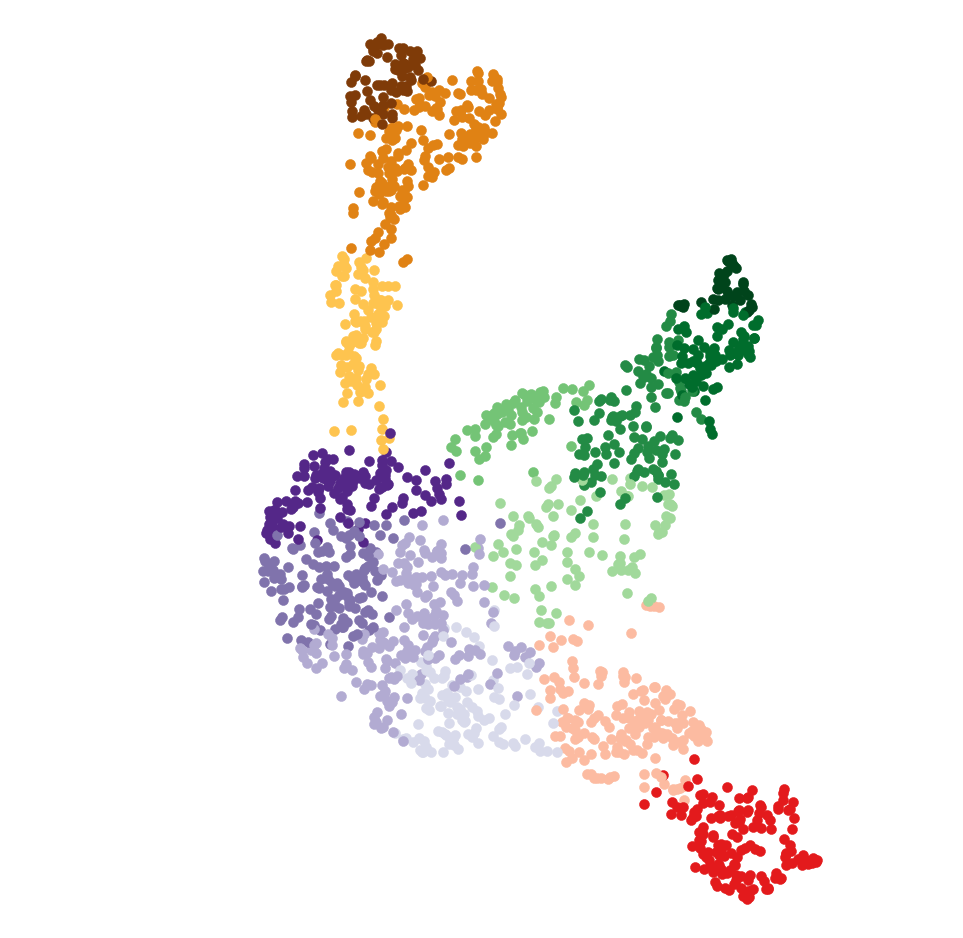

In [32]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
tsne = umap_ANA.loc[cells.index]
cmap = cmap_2nd
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 100,
                linewidth = 0.5,
                c = cmap[cells[ix]],
                edgecolor=cmap[cells[ix]], 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_tSNE_ANA_Matrix.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# t-SNE - cell groups - inset ORS

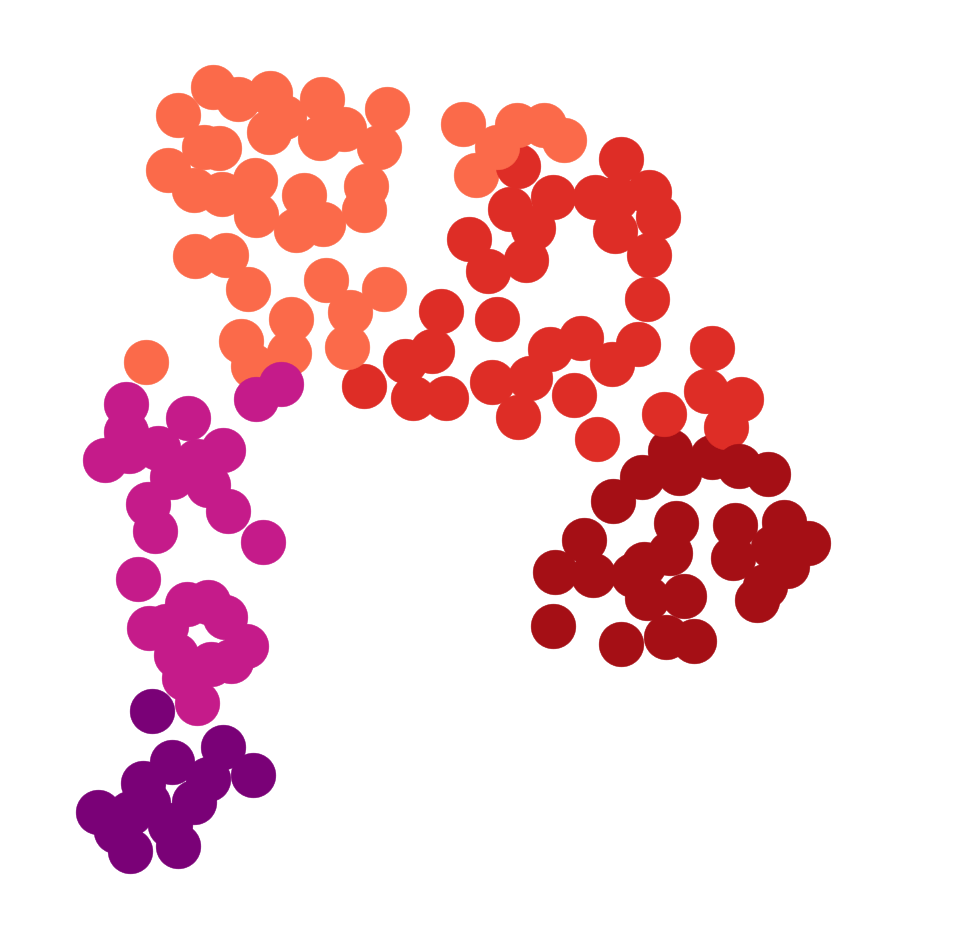

In [33]:
cells = cl_c_ANA_IRS
tsne = umap_ANA_IRS.loc[cells.index]
cmap = cmap_2nd
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 2000,
                linewidth = 0.5,
                c = cmap[cells[ix]],
                edgecolor=cmap[cells[ix]], 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_tSNE_ANA_IRS.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Matrix precursors

In [386]:
genes = ['Lef1','Msx1',
         'Mt2','Cldn10',
         'Ccnd2','Dcn',
         'Id1','Id3']

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:44: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


"\nfigname = 'v1.5_Fig4_bar_ANA_MP.pdf'\nplt.savefig('%s/%s' % (path_figures, figname), \n            format = 'pdf', \n            transparent = True, \n            bbox_inches = 'tight', \n            pad_inches = 0, \n            rasterized = True)\n"

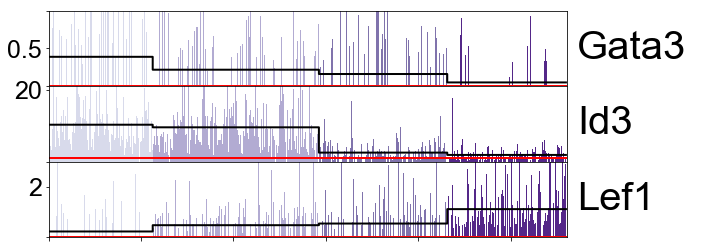

In [416]:
cells = cl_c_ANA
groups_sel = ['ANA - 12','ANA - 15', 'ANA - 13', 'ANA - 16']
cell_groups = AP_groups_reorder_v2(cells[cells.isin(groups_sel)], groups_sel)
cell_ngroups = cells[~cells.isin(groups_sel)]
dataset = seqN[cell_groups.index]
medians = seqN[cell_ngroups.index].median(axis=1)
genes = ['Gata3','Id3','Lef1']
cmap = cmap_2nd

#create figure

bar_size = 0.5
bar_pad = 0.25
width = 10
height = len(genes) * 1.3

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#create GS for gene barplots

gs1 = plt.GridSpec(len(genes), 2, hspace = 0.00, wspace = 0.0, top = 1 - ((bar_pad + bar_size) / height), right = 1, 
                   left = (bar_pad + bar_size) / width, bottom = 0, width_ratios = [14,4])

#create GS for sample group bar

gs0 = plt.GridSpec(1,2, left = (bar_pad + bar_size) / width, right = 1, top = 1,
                       bottom = 1 - ((bar_size) / height), hspace = 0.0, wspace = 0.0, width_ratios = [14,4])

#colorlist bar

clistBAR = [cmap[val] for val in cell_groups]

#draw genes

for g in genes:
    
        #create group_specific mean expressions
    
        mean_tmp = pd.Series(index = set(cell_groups))
        
        for gr in set(cell_groups):
            
            ix_tmp = cell_groups[cell_groups == gr].index
            mean_tmp[gr] = dataset.ix[g, ix_tmp].mean()
            
        #create white space for gene names
        
        ax0 = plt.subplot(gs1[genes.index(g),1])
        clean_axis(ax0)
 
        #create axis
            
        ax0 = plt.subplot(gs1[genes.index(g),0])
        
        ax0.axvspan(0, len(dataset.columns), color = '#FFFFFF', zorder = 0)
        
        #define xaxis
        
        ax0.set_xlim(left = 0, right = (len(dataset.columns)))
        ax0.xaxis.set_ticklabels([])
        
        #define yaxis
        
        ax0.set_ylim(bottom = 0, top = np.ceil(np.max(mean_tmp) * 2))
        ax0.set_ylabel(g, family = 'Arial', fontsize = 40, rotation = 'horizontal', va = 'center', ha = 'left')
        ax0.yaxis.set_label_coords(1.02, 0.5)
        
        ax0.locator_params(axis='y', nbins=2)
        
        for tick_pos, tick in enumerate(ax0.yaxis.get_major_ticks()):
            if tick_pos % 2 == 1:
                ax0.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
                ax0.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(25)
            else:
                ax0.yaxis.get_major_ticks()[tick_pos].label.set_visible(False)
                
        #draw expression data
        
        ax0.bar(np.arange(0, len(dataset.columns),1), dataset.ix[g], color = clistBAR, linewidth = 0, width = 1.0)
        
        #draw means
        
        ax0.step(range(len(cell_groups)), [mean_tmp[val] for val in cell_groups], where = 'mid', color = 'black', linewidth = 2)
        
        #draw medians
        
        ax0.axhline(medians[g], linewidth = 2, color = 'red')
"""
figname = 'v1.5_Fig4_bar_ANA_MP.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)
"""

# Companion layer

In [39]:
genes = ['Aldh1a3','Rgcc','Ube2c','Ccnb1','Csta1','Fabp4','Krt75','Kitl','Foxq1','Tnni1']

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:44: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


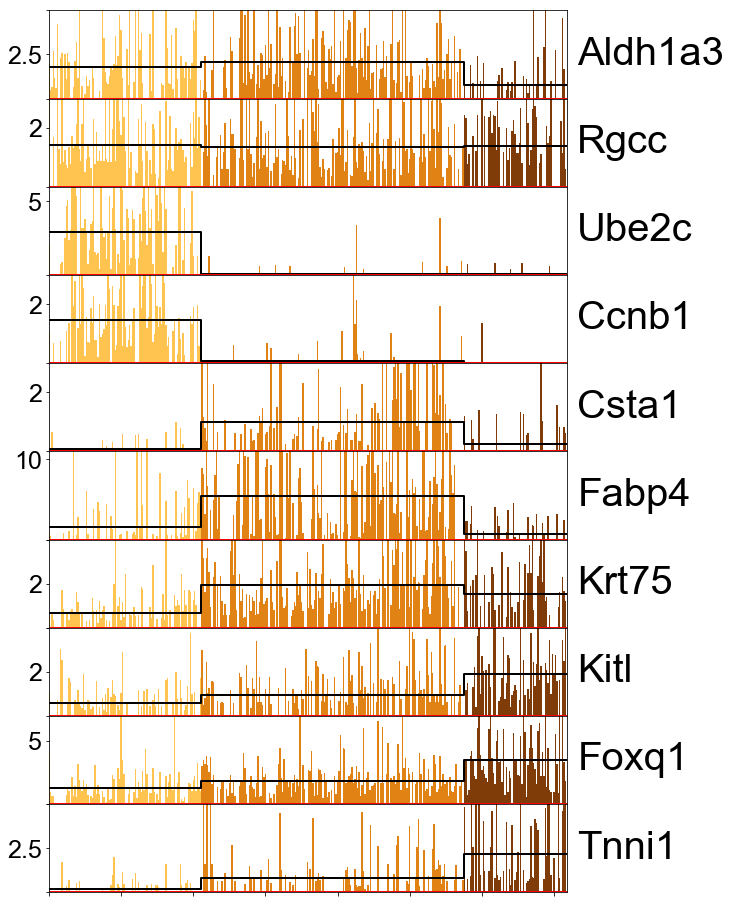

In [40]:
cells = cl_c_ANA
groups_sel = ['ANA - 17','ANA - 5', 'ANA - 4']
cell_groups = cells[cells.isin(groups_sel)]
cell_ngroups = cells[~cells.isin(groups_sel)]
dataset = seqN[cell_groups.index]
medians = seqN[cell_ngroups.index].median(axis=1)
#genes = ['Ccnb1','Ube2c']
cmap = cmap_2nd

#create figure

bar_size = 0.5
bar_pad = 0.25
width = 10
height = len(genes) * 1.3

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#create GS for gene barplots

gs1 = plt.GridSpec(len(genes), 2, hspace = 0.00, wspace = 0.0, top = 1 - ((bar_pad + bar_size) / height), right = 1, 
                   left = (bar_pad + bar_size) / width, bottom = 0, width_ratios = [14,4])

#create GS for sample group bar

gs0 = plt.GridSpec(1,2, left = (bar_pad + bar_size) / width, right = 1, top = 1,
                       bottom = 1 - ((bar_size) / height), hspace = 0.0, wspace = 0.0, width_ratios = [14,4])

#colorlist bar

clistBAR = [cmap[val] for val in cell_groups]

#draw genes

for g in genes:
    
        #create group_specific mean expressions
    
        mean_tmp = pd.Series(index = set(cell_groups))
        
        for gr in set(cell_groups):
            
            ix_tmp = cell_groups[cell_groups == gr].index
            mean_tmp[gr] = dataset.ix[g, ix_tmp].mean()
            
        #create white space for gene names
        
        ax0 = plt.subplot(gs1[genes.index(g),1])
        clean_axis(ax0)
 
        #create axis
            
        ax0 = plt.subplot(gs1[genes.index(g),0])
        
        ax0.axvspan(0, len(dataset.columns), color = '#FFFFFF', zorder = 0)
        
        #define xaxis
        
        ax0.set_xlim(left = 0, right = (len(dataset.columns)))
        ax0.xaxis.set_ticklabels([])
        
        #define yaxis
        
        ax0.set_ylim(bottom = 0, top = np.ceil(np.max(mean_tmp) * 2))
        ax0.set_ylabel(g, family = 'Arial', fontsize = 40, rotation = 'horizontal', va = 'center', ha = 'left')
        ax0.yaxis.set_label_coords(1.02, 0.5)
        
        ax0.locator_params(axis='y', nbins=2)
        
        for tick_pos, tick in enumerate(ax0.yaxis.get_major_ticks()):
            if tick_pos % 2 == 1:
                ax0.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
                ax0.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(25)
            else:
                ax0.yaxis.get_major_ticks()[tick_pos].label.set_visible(False)
                
        #draw expression data
        
        ax0.bar(np.arange(0, len(dataset.columns),1), dataset.ix[g], color = clistBAR, linewidth = 0, width = 1.0)
        
        #draw means
        
        ax0.step(range(len(cell_groups)), [mean_tmp[val] for val in cell_groups], where = 'mid', color = 'black', linewidth = 2)
        
        #draw medians
        
        ax0.axhline(medians[g], linewidth = 2, color = 'red')
        
figname = 'v1.5_Fig4_bar_ANA_CL.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Cortex

In [43]:
genes = ['Id1','Ube2c','Cdc20','Selenbp1','Krt35','Rnaset2b','Dapl1','Tagln3','Krt36','Krt31']

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:44: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


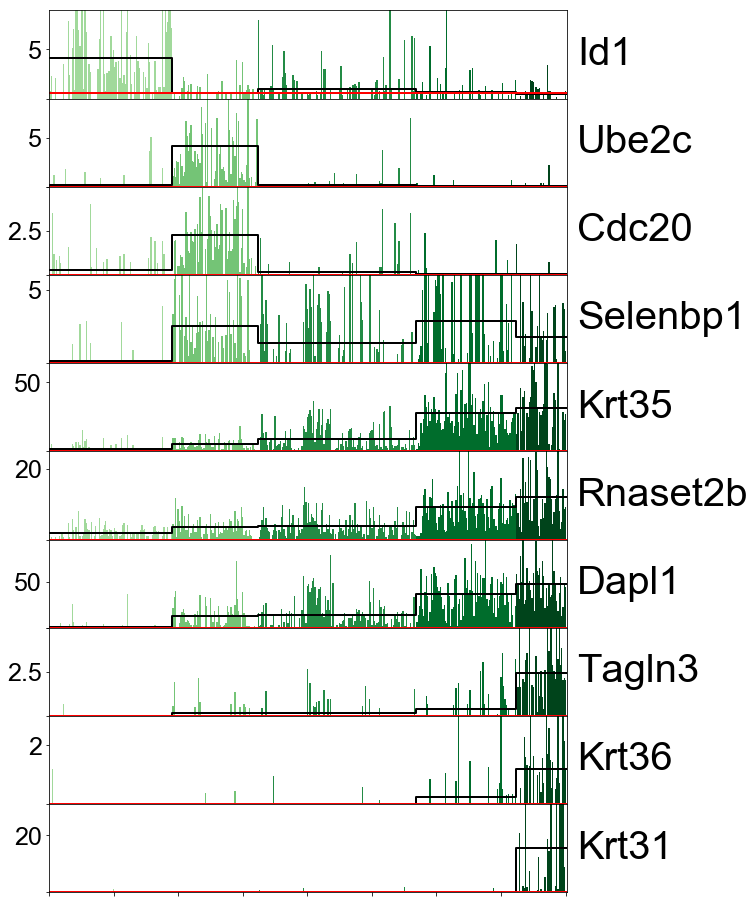

In [46]:
cells = cl_c_ANA
groups_sel = ['ANA - 14','ANA - 6', 'ANA - 7', 'ANA - 10', 'ANA - 11']
cell_groups = cells[cells.isin(groups_sel)]
cell_ngroups = cells[~cells.isin(groups_sel)]
dataset = seqN[cell_groups.index]
medians = seqN[cell_ngroups.index].median(axis=1)
#genes = ['Krt28','Krt27','Krt25']
cmap = cmap_2nd

#create figure

bar_size = 0.5
bar_pad = 0.25
width = 10
height = len(genes) * 1.3

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#create GS for gene barplots

gs1 = plt.GridSpec(len(genes), 2, hspace = 0.00, wspace = 0.0, top = 1 - ((bar_pad + bar_size) / height), right = 1, 
                   left = (bar_pad + bar_size) / width, bottom = 0, width_ratios = [14,4])

#create GS for sample group bar

gs0 = plt.GridSpec(1,2, left = (bar_pad + bar_size) / width, right = 1, top = 1,
                       bottom = 1 - ((bar_size) / height), hspace = 0.0, wspace = 0.0, width_ratios = [14,4])

#colorlist bar

clistBAR = [cmap[val] for val in cell_groups]

#draw genes

for g in genes:
    
        #create group_specific mean expressions
    
        mean_tmp = pd.Series(index = set(cell_groups))
        
        for gr in set(cell_groups):
            
            ix_tmp = cell_groups[cell_groups == gr].index
            mean_tmp[gr] = dataset.ix[g, ix_tmp].mean()
            
        #create white space for gene names
        
        ax0 = plt.subplot(gs1[genes.index(g),1])
        clean_axis(ax0)
 
        #create axis
            
        ax0 = plt.subplot(gs1[genes.index(g),0])
        
        ax0.axvspan(0, len(dataset.columns), color = '#FFFFFF', zorder = 0)
        
        #define xaxis
        
        ax0.set_xlim(left = 0, right = (len(dataset.columns)))
        ax0.xaxis.set_ticklabels([])
        
        #define yaxis
        
        ax0.set_ylim(bottom = 0, top = np.ceil(np.max(mean_tmp) * 2))
        ax0.set_ylabel(g, family = 'Arial', fontsize = 40, rotation = 'horizontal', va = 'center', ha = 'left')
        ax0.yaxis.set_label_coords(1.02, 0.5)
        
        ax0.locator_params(axis='y', nbins=2)
        
        for tick_pos, tick in enumerate(ax0.yaxis.get_major_ticks()):
            if tick_pos % 2 == 1:
                ax0.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
                ax0.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(25)
            else:
                ax0.yaxis.get_major_ticks()[tick_pos].label.set_visible(False)
                
        #draw expression data
        
        ax0.bar(np.arange(0, len(dataset.columns),1), dataset.ix[g], color = clistBAR, linewidth = 0, width = 1.0)
        
        #draw means
        
        ax0.step(range(len(cell_groups)), [mean_tmp[val] for val in cell_groups], where = 'mid', color = 'black', linewidth = 2)
        
        #draw medians
        
        ax0.axhline(medians[g], linewidth = 2, color = 'red')
        
figname = 'v1.5_Fig4_bar_ANA_Cx.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# IRS

In [150]:
for c in cl_c_ANA[cl_c_ANA=='ANA - 18'].index: cl_c_ANA_IRS[c] = 'ANA - 18'

In [151]:
cl_c_ANA_IRS = AP_groups_reorder_v2(cl_c_ANA_IRS, ['ANA - 18',
                                                   'ANA - IRS - 3',
                                                   'ANA - IRS - 4',
                                                   'ANA - IRS - 1',
                                                   'ANA - IRS - 2',
                                                   'ANA - IRS - 0'])

In [152]:
genes = ['Hmgb2','Top2a','Krt71','Krt27','Prss53','Tchh','Krt73','Fbp1','Cryba4','Krt72']

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:43: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


"\nfigname = 'v1.5_Fig4_bar_ANA_IRS.pdf'\nplt.savefig('%s/%s' % (path_figures, figname), \n            format = 'pdf', \n            transparent = True, \n            bbox_inches = 'tight', \n            pad_inches = 0, \n            rasterized = True)\n"

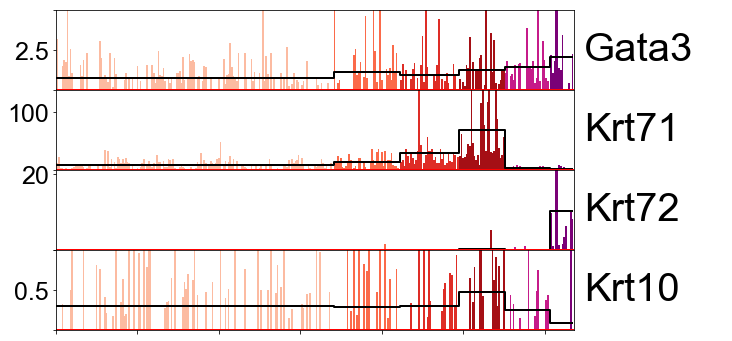

In [155]:
cells = cl_c_ANA_IRS
cell_groups = cells
cell_ngroups = cl_c_ANA[~cl_c_ANA.isin(['ANA - 18','ANA - 8', 'ANA - 9'])]
dataset = seqN[cell_groups.index]
medians = seqN[cell_ngroups.index].median(axis=1)
genes = ['Gata3','Krt71','Krt72','Krt10']
cmap = cmap_2nd

#create figure

bar_size = 0.5
bar_pad = 0.25
width = 10
height = len(genes) * 1.3

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#create GS for gene barplots

gs1 = plt.GridSpec(len(genes), 2, hspace = 0.00, wspace = 0.0, top = 1 - ((bar_pad + bar_size) / height), right = 1, 
                   left = (bar_pad + bar_size) / width, bottom = 0, width_ratios = [14,4])

#create GS for sample group bar

gs0 = plt.GridSpec(1,2, left = (bar_pad + bar_size) / width, right = 1, top = 1,
                       bottom = 1 - ((bar_size) / height), hspace = 0.0, wspace = 0.0, width_ratios = [14,4])

#colorlist bar

clistBAR = [cmap[val] for val in cell_groups]

#draw genes

for g in genes:
    
        #create group_specific mean expressions
    
        mean_tmp = pd.Series(index = set(cell_groups))
        
        for gr in set(cell_groups):
            
            ix_tmp = cell_groups[cell_groups == gr].index
            mean_tmp[gr] = dataset.ix[g, ix_tmp].mean()
            
        #create white space for gene names
        
        ax0 = plt.subplot(gs1[genes.index(g),1])
        clean_axis(ax0)
 
        #create axis
            
        ax0 = plt.subplot(gs1[genes.index(g),0])
        
        ax0.axvspan(0, len(dataset.columns), color = '#FFFFFF', zorder = 0)
        
        #define xaxis
        
        ax0.set_xlim(left = 0, right = (len(dataset.columns)))
        ax0.xaxis.set_ticklabels([])
        
        #define yaxis
        
        ax0.set_ylim(bottom = 0, top = np.ceil(np.max(mean_tmp) * 2))
        ax0.set_ylabel(g, family = 'Arial', fontsize = 40, rotation = 'horizontal', va = 'center', ha = 'left')
        ax0.yaxis.set_label_coords(1.02, 0.5)
        
        ax0.locator_params(axis='y', nbins=2)
        
        for tick_pos, tick in enumerate(ax0.yaxis.get_major_ticks()):
            if tick_pos % 2 == 1:
                ax0.yaxis.get_major_ticks()[tick_pos].label.set_family('Arial')
                ax0.yaxis.get_major_ticks()[tick_pos].label.set_fontsize(25)
            else:
                ax0.yaxis.get_major_ticks()[tick_pos].label.set_visible(False)
                
        #draw expression data
        
        ax0.bar(np.arange(0, len(dataset.columns),1), dataset.ix[g], color = clistBAR, linewidth = 0, width = 1.0)
        
        #draw means
        
        ax0.step(range(len(cell_groups)), [mean_tmp[val] for val in cell_groups], where = 'mid', color = 'black', linewidth = 2)
        
        #draw medians
        
        ax0.axhline(medians[g], linewidth = 2, color = 'red')
"""
figname = 'v1.5_Fig4_bar_ANA_IRS.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)
"""

# RNA velocity: model 2

In [32]:
import velocyto as vcy

In [33]:
print(vcy.__version__)

0.17.16


In [34]:
path_input_vcy = '/Users/simjoo/Projects/10X_Skin/velocyto/data_input/v1.5/'
path_output_vcy = '/Users/simjoo/Projects/10X_Skin/velocyto/data_output/v1.5/'

In [35]:
vlm_ana2 = vcy.load_velocyto_hdf5(path_output_vcy + exp_id + '_vlm_ana2.hdf5')

## Plot individual vectors

In [36]:
c_sel = ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) for c in vlm_ana2.ca['CellID']]
delta_embedding_model2 = pd.DataFrame(vlm_ana2.delta_embedding, index = c_sel, columns = ['x','y'])
delta_embedding_random_model2 = pd.DataFrame(vlm_ana2.delta_embedding_random, index = c_sel, columns = ['x','y'])

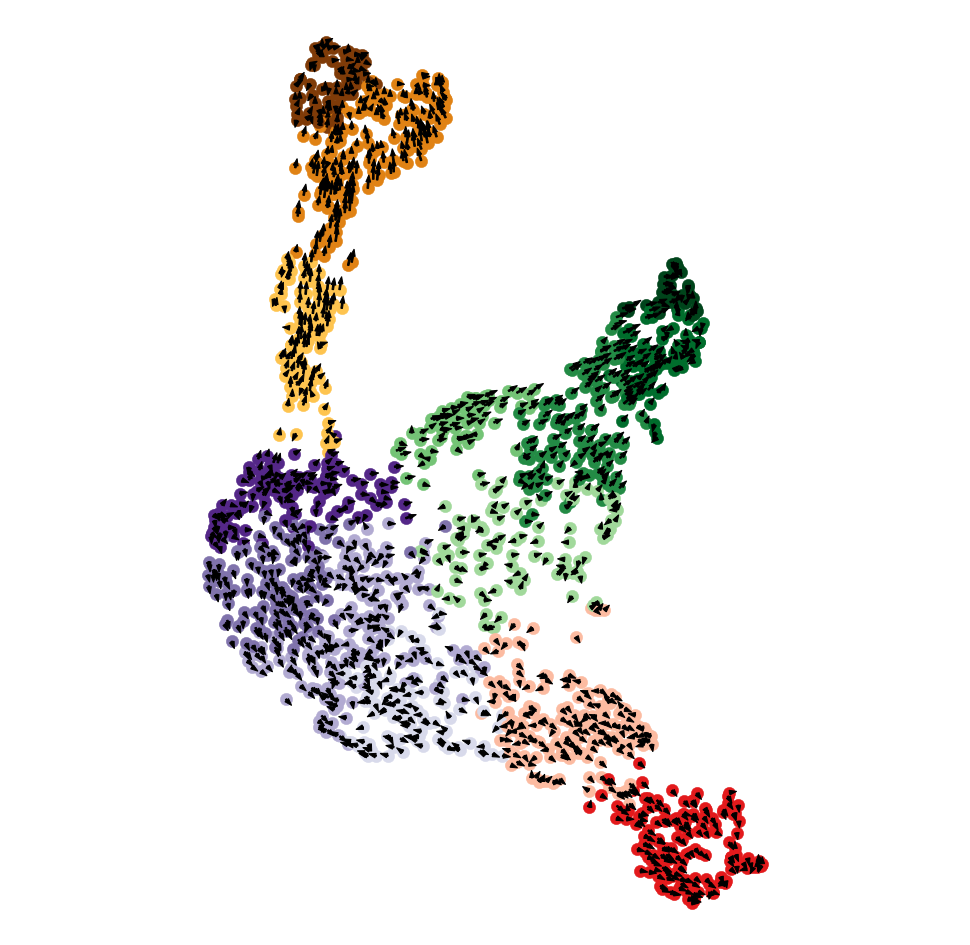

In [37]:
cells = cl_c_ANA[c_sel]
tsne = umap_ANA.loc[cells.index]
delta = delta_embedding_model2
cmap = cmap_2nd
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min
x_cent, y_cent = x_min + 0.5 * x_diff, y_min + 0.5 * y_diff,

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_cent - 0.5 * x_diff - pad, y_cent + 0.5 * x_diff + pad,)

if x_diff < y_diff:
    xlim = (x_cent - 0.5 * y_diff - pad, x_cent + 0.5 * y_diff + pad,)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 150,
                linewidth = 0.5,
                c = cmap[cells[ix]],
                edgecolor=cmap[cells[ix]], 
                marker = markers[time[ix]])
    
    ax1.arrow(x = tsne.loc[ix,'x'], 
              y = tsne.loc[ix,'y'], 
              dx = delta.loc[ix,'x'], 
              dy = delta.loc[ix,'y'],
              width = 0.1, color = 'black')

clean_axis(ax1)

figname = 'v1.5_FigS4_tsne_vlm_matrix.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

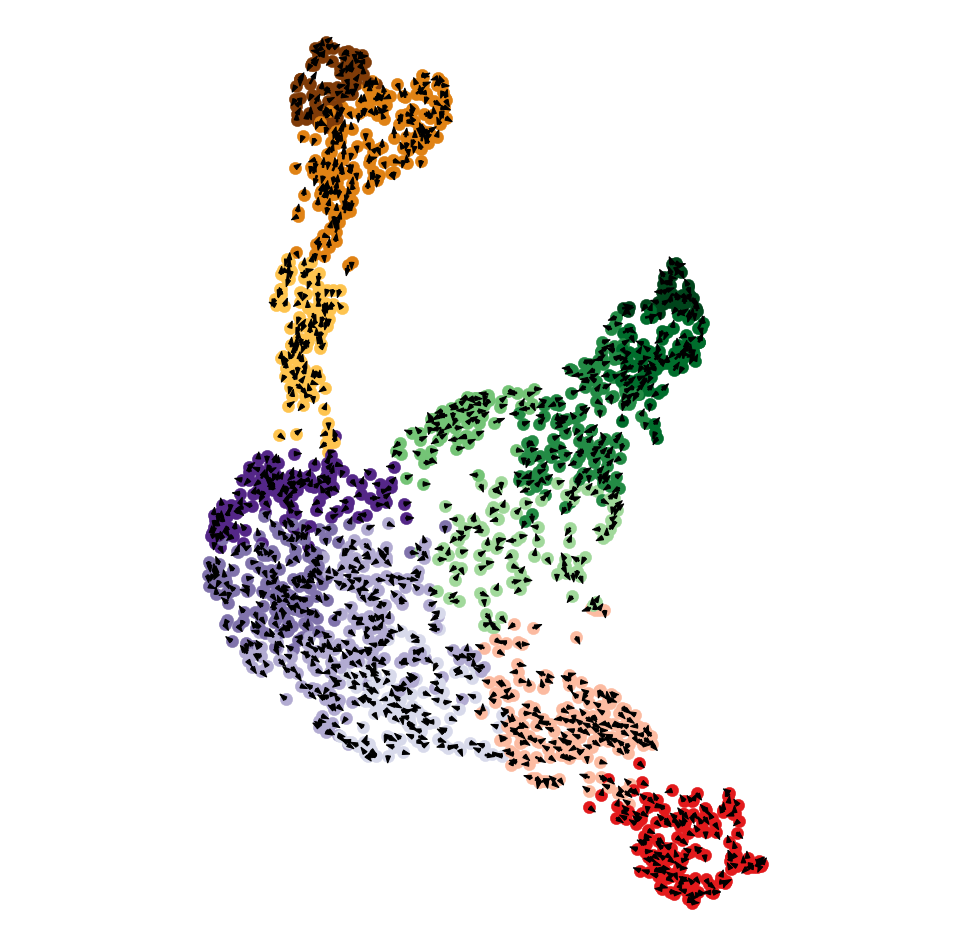

In [38]:
cells = cl_c_ANA[c_sel]
tsne = umap_ANA.loc[cells.index]
delta = delta_embedding_random_model2
cmap = cmap_2nd
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min
x_cent, y_cent = x_min + 0.5 * x_diff, y_min + 0.5 * y_diff,

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_cent - 0.5 * x_diff - pad, y_cent + 0.5 * x_diff + pad,)

if x_diff < y_diff:
    xlim = (x_cent - 0.5 * y_diff - pad, x_cent + 0.5 * y_diff + pad,)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 150,
                linewidth = 0.5,
                c = cmap[cells[ix]],
                edgecolor=cmap[cells[ix]], 
                marker = markers[time[ix]])
    
    ax1.arrow(x = tsne.loc[ix,'x'], 
              y = tsne.loc[ix,'y'], 
              dx = delta.loc[ix,'x'], 
              dy = delta.loc[ix,'y'],
              width = 0.1, color = 'black')

clean_axis(ax1)

figname = 'v1.5_FigS4_tsne_vlm_matrix_random.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Plot vector field

In [39]:
vlm_ana2.colorandum = [cmap_2nd[cl_c_ANA['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2])]] for c in vlm_ana2.ca['CellID']]

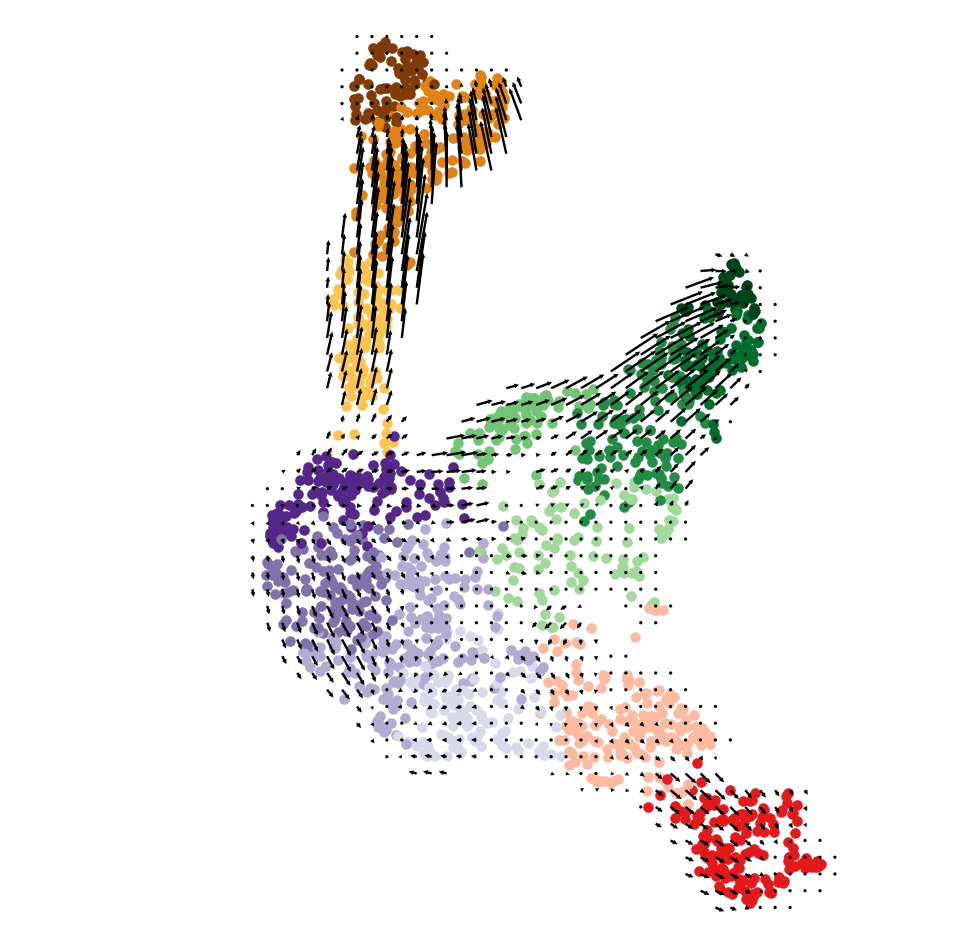

In [41]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
tsne = umap_ANA.loc[cells.index]
cmap = cmap_2nd
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 100,
                linewidth = 0.5,
                c = cmap[cells[ix]],
                edgecolor=cmap[cells[ix]], 
                marker = markers[time[ix]])

clean_axis(ax1)

vlm_ana2.calculate_grid_arrows(smooth=1.0, steps=(40, 55), n_neighbors=100)
vlm_ana2.plot_grid_arrows(scatter_kwargs_dict={"alpha":0, "lw":0.0, "edgecolor":"0", "s":100, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = False,
                     headaxislength=2, headlength=2, headwidth=2, quiver_scale=0.5, width = 0.0025)

figname = 'v1.5_Fig4_tsne_vlm_matrix_field.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

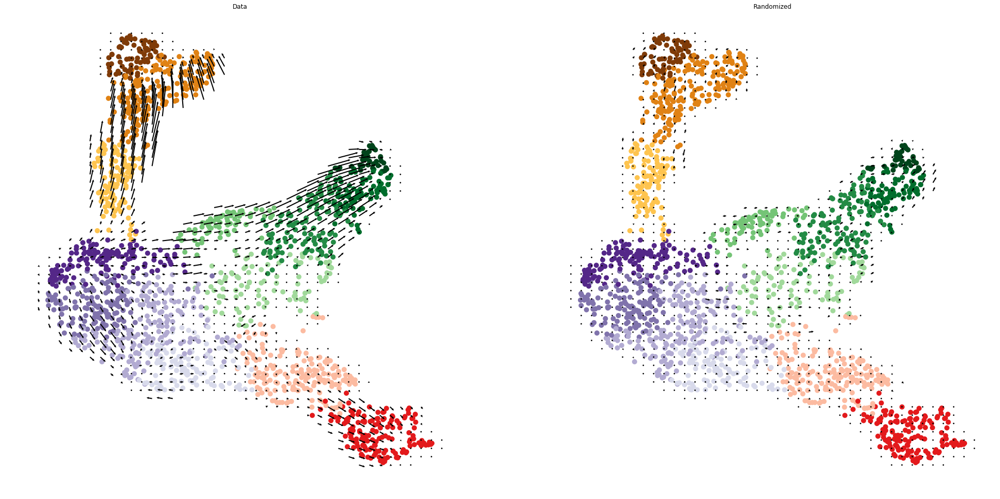

In [42]:
height = 17
width = 17 * 2

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min
x_cent, y_cent = x_min + 0.5 * x_diff, y_min + 0.5 * y_diff,

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_cent - 0.5 * x_diff - pad, y_cent + 0.5 * x_diff + pad,)

if x_diff < y_diff:
    xlim = (x_cent - 0.5 * y_diff - pad, x_cent + 0.5 * y_diff + pad,)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

vlm_ana2.plot_grid_arrows(scatter_kwargs_dict={"alpha":1, "lw":0.0, "edgecolor":"0", "s":100, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = True,
                     headaxislength=2, headlength=2, headwidth=2, quiver_scale=0.5)

figname = 'v1.5_Fig4_tsne_vlm_field_vs_random.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Markov model

In [99]:
diffused_fwd = loadData_v1(path_output, exp_id, 'diffused_fwd', 'Series')
diffused_bwd = loadData_v1(path_output, exp_id, 'diffused_bwd', 'Series')

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:49: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


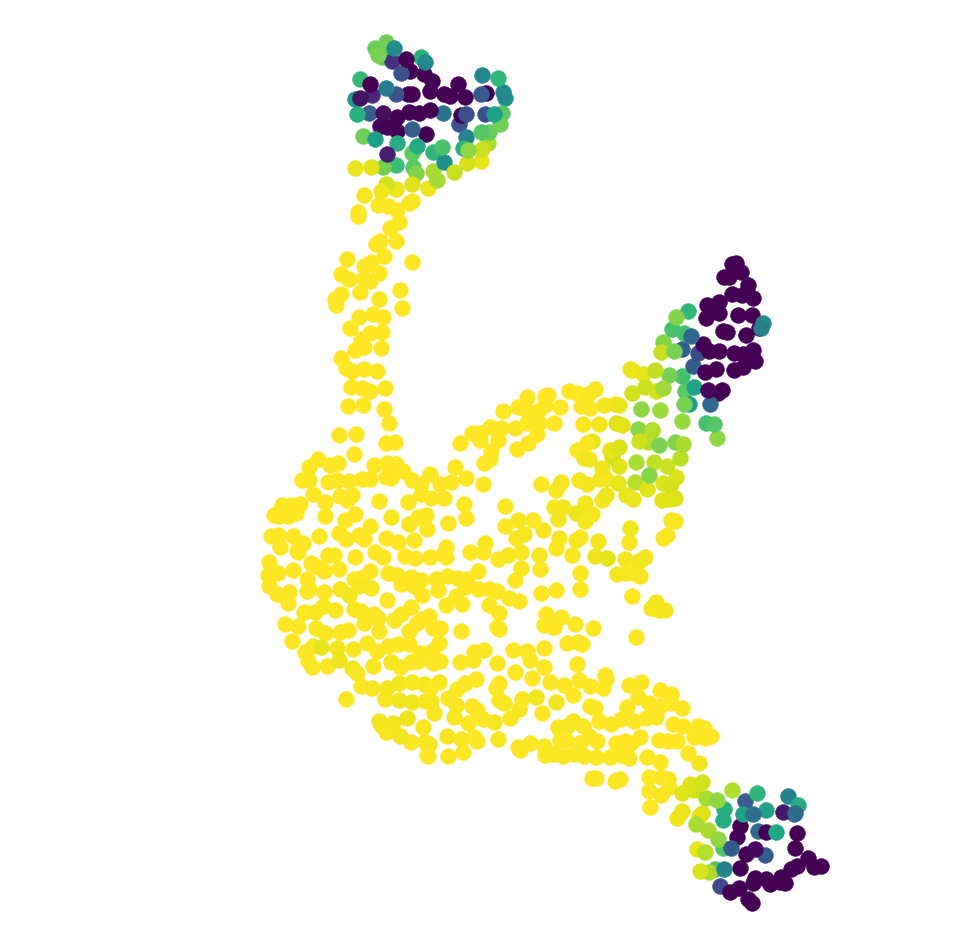

In [101]:
data = diffused_fwd
data -= np.percentile(data, 10)
data /= np.percentile(data, 90)
data = np.clip(data, 0, 1)

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.viridis_r
time = cells_stage
markers = markers_time
vmin = 0.0
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_vlm_markov_fwd.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:49: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


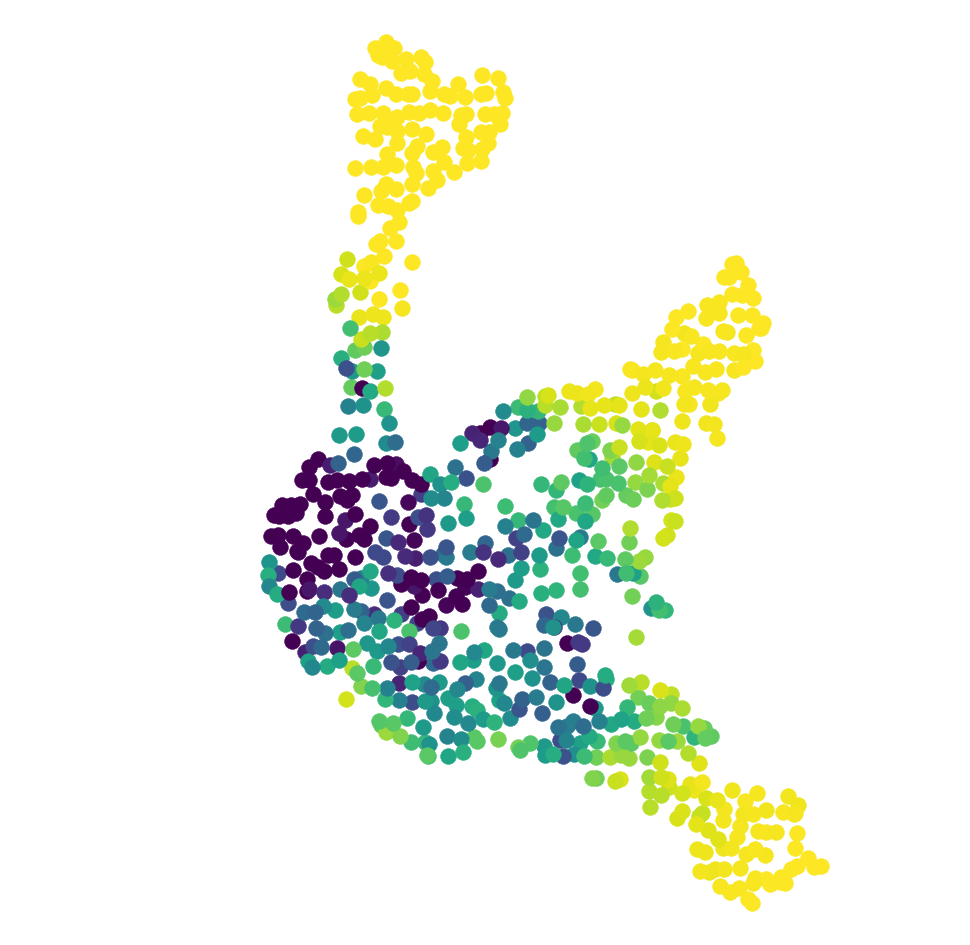

In [102]:
data = diffused_bwd
data -= np.percentile(data, 10)
data /= np.percentile(data, 90)
data = np.clip(data, 0, 1)

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.viridis_r
time = cells_stage
markers = markers_time
vmin = 0.0
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_vlm_markov_bwd.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Run forward Markov model from GL/MP populations

In [142]:
# Sample uniformly the points to avoid density driven effects - Should reimplement as a method
steps = 50, 50
grs = []
for dim_i in range(vlm_ana2.embedding.shape[1]):
    m, M = np.min(vlm_ana2.embedding[:, dim_i]), np.max(vlm_ana2.embedding[:, dim_i])
    m = m - 0.025 * np.abs(M - m)
    M = M + 0.025 * np.abs(M - m)
    gr = np.linspace(m, M, steps[dim_i])
    grs.append(gr)

meshes_tuple = np.meshgrid(*grs)
gridpoints_coordinates = np.vstack([i.flat for i in meshes_tuple]).T

from sklearn.neighbors import NearestNeighbors
nn = NearestNeighbors()
nn.fit(vlm_ana2.embedding)
dist, ixs = nn.kneighbors(gridpoints_coordinates, 1)

diag_step_dist = np.sqrt((meshes_tuple[0][0,0] - meshes_tuple[0][0,1])**2 + (meshes_tuple[1][0,0] - meshes_tuple[1][1,0])**2)
min_dist = diag_step_dist / 2
ixs = ixs[dist < min_dist]
gridpoints_coordinates = gridpoints_coordinates[dist.flat[:]<min_dist,:]
dist = dist[dist < min_dist]

ixs = np.unique(ixs)

In [143]:
cellID = ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) for c in vlm_ana2.ca['CellID']]

In [144]:
c_sel1 = cl_c_ANA[cl_c_ANA=='ANA - 16'].index
c_sel2 = cl_c_ANA[cl_c_ANA=='ANA - 13'].index
c_sel3 = cl_c_ANA[cl_c_ANA=='ANA - 15'].index
c_sel4 = cl_c_ANA[cl_c_ANA=='ANA - 12'].index

In [145]:
bool_v1 = np.array([cellID[i] in c_sel1 for i in ixs])
bool_v2 = np.array([cellID[i] in c_sel2 for i in ixs])
bool_v3 = np.array([cellID[i] in c_sel3 for i in ixs])
bool_v4 = np.array([cellID[i] in c_sel4 for i in ixs])

In [146]:
starting_p1 = bool_v1 / bool_v1.sum()
starting_p2 = bool_v2 / bool_v2.sum()
starting_p3 = bool_v3 / bool_v3.sum()
starting_p4 = bool_v4 / bool_v4.sum()

In [147]:
vlm_ana2.prepare_markov(sigma_D=diag_step_dist, sigma_W=diag_step_dist/2, direction='forward', cells_ixs=ixs)

In [148]:
c_sel = ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) for c in vlm_ana2.ca['CellID'][ixs]]

### MP4

In [154]:
vlm_ana2.run_markov(starting_p=starting_p1, n_steps=2500)
diffused_fwd1 = pd.Series(vlm_ana2.diffused, index = c_sel)

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:49: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


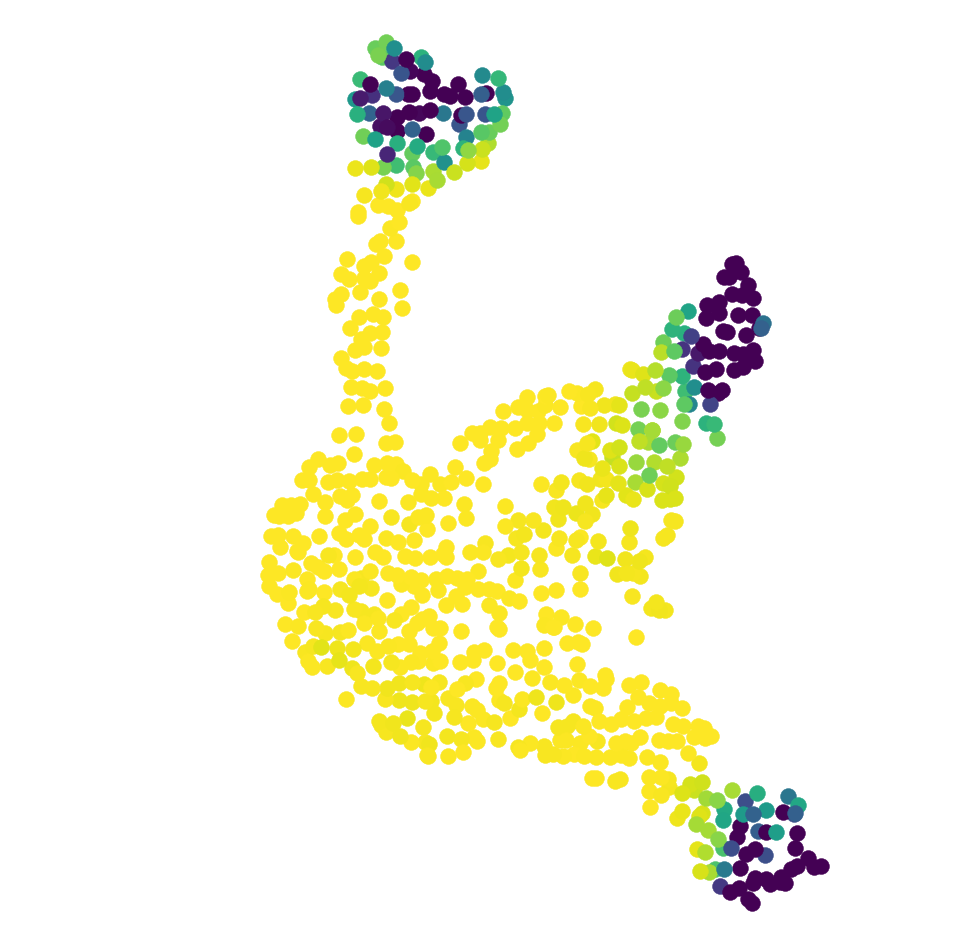

In [155]:
data = diffused_fwd1.copy()
data -= np.percentile(data, 10)
data /= np.percentile(data, 90)
data = np.clip(data, 0, 1)

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.viridis_r
time = cells_stage
markers = markers_time
vmin = 0.0
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_vlm_markov_fwd_MP4.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### MP3

In [157]:
vlm_ana2.run_markov(starting_p=starting_p2, n_steps=2500)
diffused_fwd2 = pd.Series(vlm_ana2.diffused, index = c_sel)

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:49: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


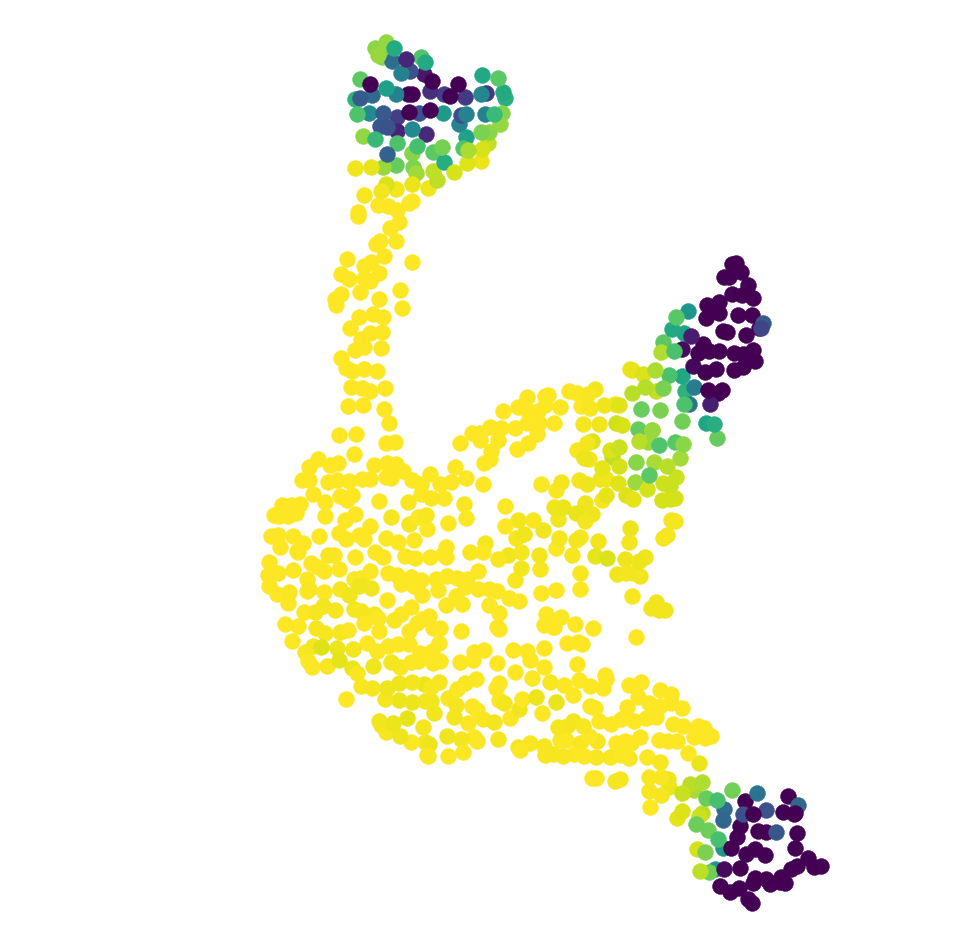

In [158]:
data = diffused_fwd2.copy()
data -= np.percentile(data, 10)
data /= np.percentile(data, 90)
data = np.clip(data, 0, 1)

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.viridis_r
time = cells_stage
markers = markers_time
vmin = 0.0
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_vlm_markov_fwd_MP3.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### MP2

In [159]:
vlm_ana2.run_markov(starting_p=starting_p3, n_steps=2500)
diffused_fwd3 = pd.Series(vlm_ana2.diffused, index = c_sel)

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:49: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


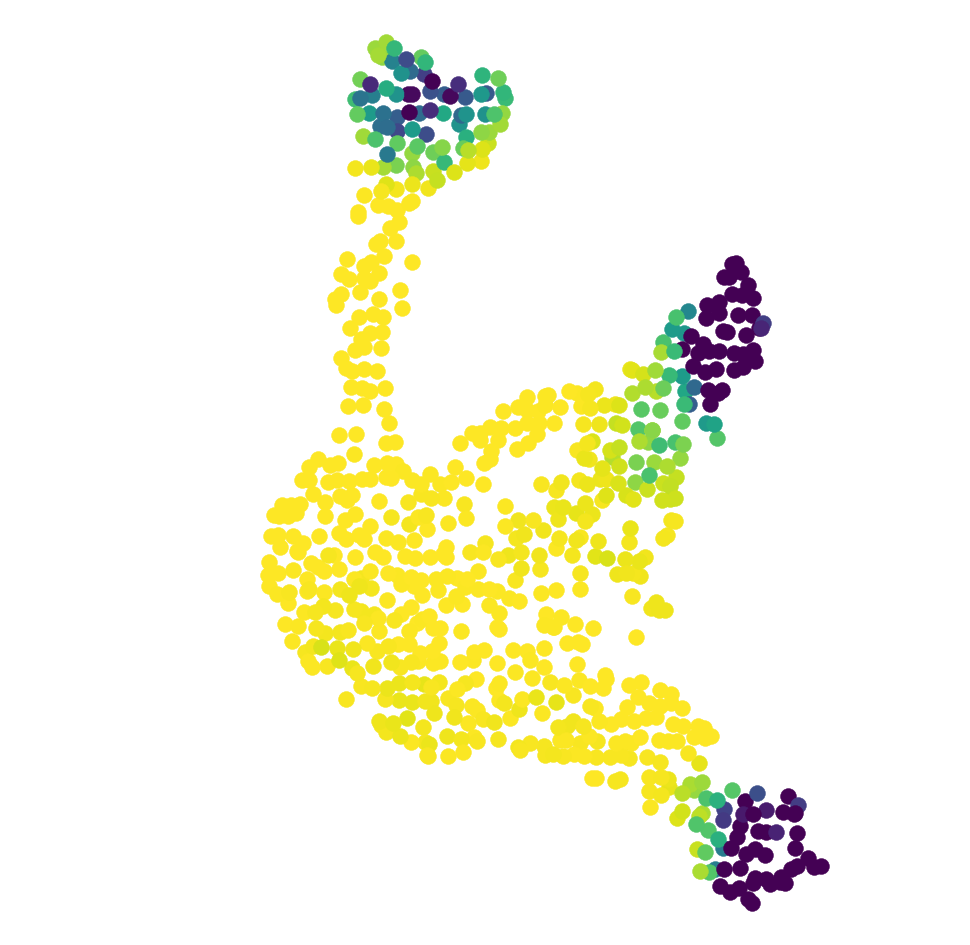

In [160]:
data = diffused_fwd3.copy()
data -= np.percentile(data, 10)
data /= np.percentile(data, 90)
data = np.clip(data, 0, 1)

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.viridis_r
time = cells_stage
markers = markers_time
vmin = 0.0
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_vlm_markov_fwd_MP2.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### MP1

In [163]:
vlm_ana2.run_markov(starting_p=starting_p4, n_steps=2500)
diffused_fwd4 = pd.Series(vlm_ana2.diffused, index = c_sel)

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:49: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


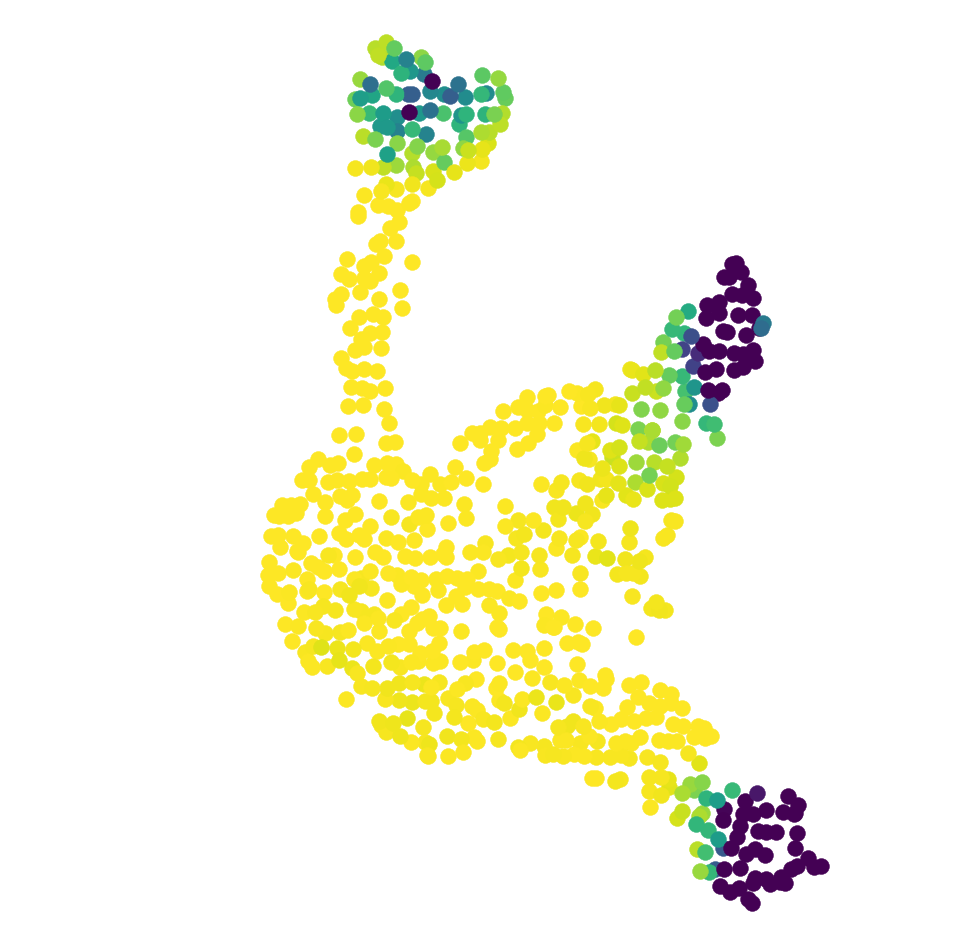

In [164]:
data = diffused_fwd4.copy()
data -= np.percentile(data, 10)
data /= np.percentile(data, 90)
data = np.clip(data, 0, 1)

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.viridis_r
time = cells_stage
markers = markers_time
vmin = 0.0
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_vlm_markov_fwd_MP1.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### Checkpoint

In [165]:
saveData_v1(diffused_fwd4, path_output, exp_id, 'diffused_GL1')
saveData_v1(diffused_fwd3, path_output, exp_id, 'diffused_GL2')
saveData_v1(diffused_fwd2, path_output, exp_id, 'diffused_GL3')
saveData_v1(diffused_fwd1, path_output, exp_id, 'diffused_GL4')

In [32]:
diffused_GL1 = loadData_v1(path_output, exp_id, 'diffused_GL1','Series')
diffused_GL2 = loadData_v1(path_output, exp_id, 'diffused_GL2','Series')
diffused_GL3 = loadData_v1(path_output, exp_id, 'diffused_GL3','Series')
diffused_GL4 = loadData_v1(path_output, exp_id, 'diffused_GL4','Series')

# Plot differential between Id3hi (GL1) and Lef1hi (GL4) population 

In [33]:
diffused_diff = diffused_GL1 - diffused_GL4

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:5: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:46: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


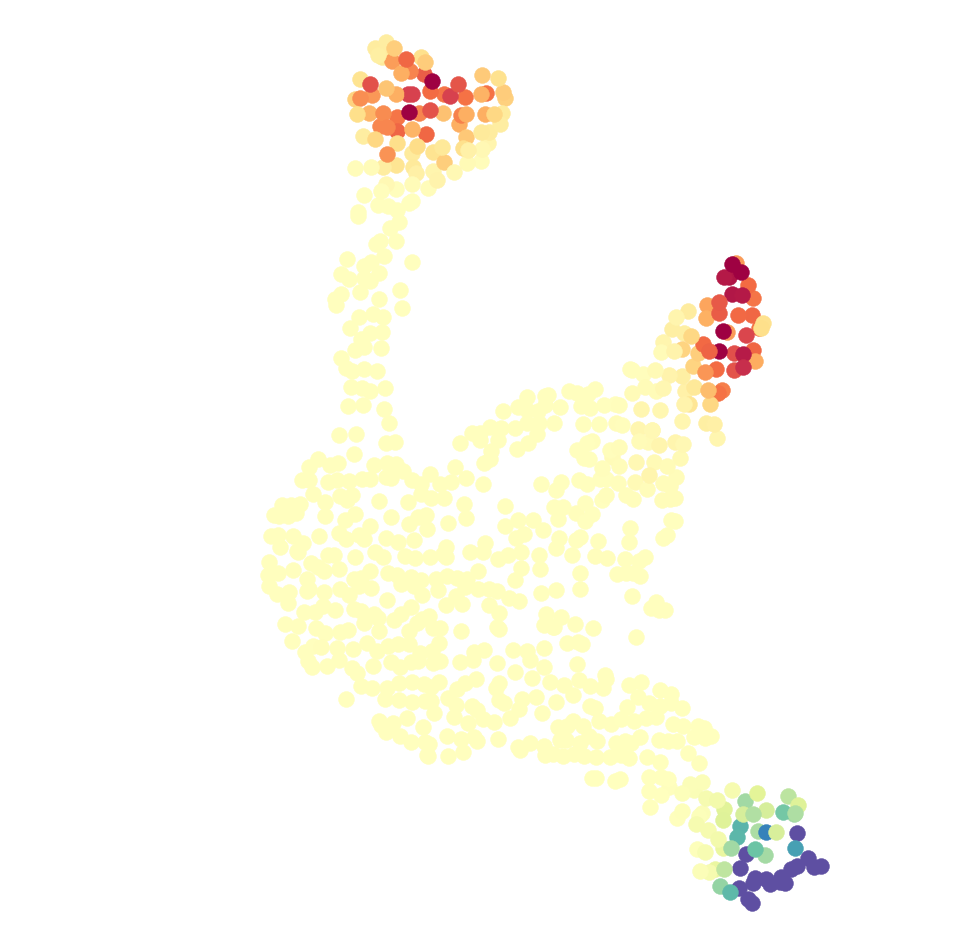

In [34]:
data = diffused_diff.copy()
vmax, vmin = 0.005, -0.005
data = (data - vmin)/(vmax - vmin)

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.Spectral
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap(data[ix]),
                edgecolor=cmap(data[ix]), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_vlm_markov_Gl1_vs_GL4.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

In [35]:
diffused_diff = diffused_GL2 - diffused_GL3

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:46: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


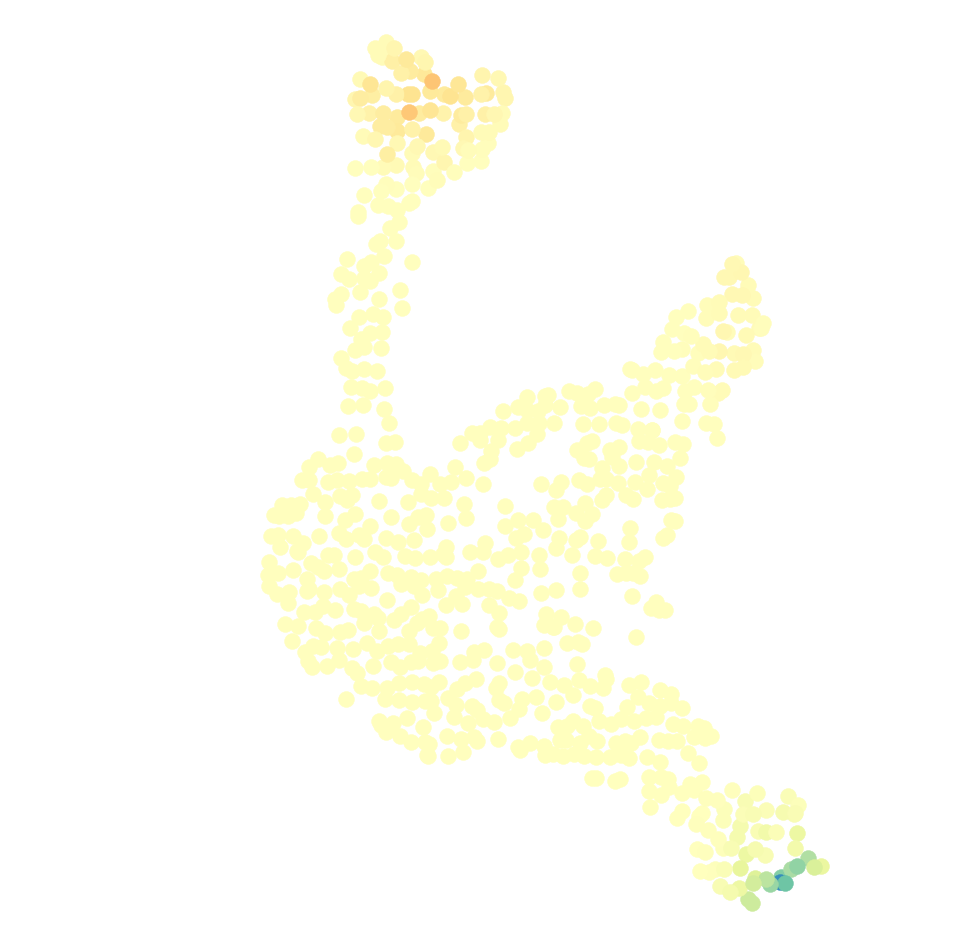

In [36]:
data = diffused_diff.copy()
vmax, vmin = 0.005, -0.005
data = (data - vmin)/(vmax - vmin)

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.Spectral
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap(data[ix]),
                edgecolor=cmap(data[ix]), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_vlm_markov_Gl2_vs_GL3.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Get cumulative probability

In [91]:
c_sel_IRS = cl_c_ANA[cl_c_ANA.isin(['ANA - 18','ANA - 8', 'ANA - 9'])].index
c_sel_CX = cl_c_ANA[cl_c_ANA.isin(['ANA - 14','ANA - 6', 'ANA - 7', 'ANA - 10', 'ANA - 11'])].index
c_sel_MED = cl_c_ANA[cl_c_ANA.isin(['ANA - 17','ANA - 5', 'ANA - 4'])].index

In [121]:
fatebias_prob = pd.DataFrame(index = ['GL1','GL2','GL3','GL4'], columns = ['IRS','CX','MED'])

fatebias_prob.loc['GL1','IRS'] = diffused_GL1.loc[c_sel_IRS].sum()
fatebias_prob.loc['GL1','CX'] = diffused_GL1.loc[c_sel_CX].sum()
fatebias_prob.loc['GL1','MED'] = diffused_GL1.loc[c_sel_MED].sum()

fatebias_prob.loc['GL2','IRS'] = diffused_GL2.loc[c_sel_IRS].sum()
fatebias_prob.loc['GL2','CX'] = diffused_GL2.loc[c_sel_CX].sum()
fatebias_prob.loc['GL2','MED'] = diffused_GL2.loc[c_sel_MED].sum()

fatebias_prob.loc['GL3','IRS'] = diffused_GL3.loc[c_sel_IRS].sum()
fatebias_prob.loc['GL3','CX'] = diffused_GL3.loc[c_sel_CX].sum()
fatebias_prob.loc['GL3','MED'] = diffused_GL3.loc[c_sel_MED].sum()

fatebias_prob.loc['GL4','IRS'] = diffused_GL4.loc[c_sel_IRS].sum()
fatebias_prob.loc['GL4','CX'] = diffused_GL4.loc[c_sel_CX].sum()
fatebias_prob.loc['GL4','MED'] = diffused_GL4.loc[c_sel_MED].sum()

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:4: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  after removing the cwd from sys.path.
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can u

In [122]:
fatebias_prob

,IRS,CX,MED
GL1,0.68425,0.242451,0.0674987
GL2,0.560732,0.337189,0.0948238
GL3,0.523272,0.34343,0.125993
GL4,0.403784,0.380801,0.207714


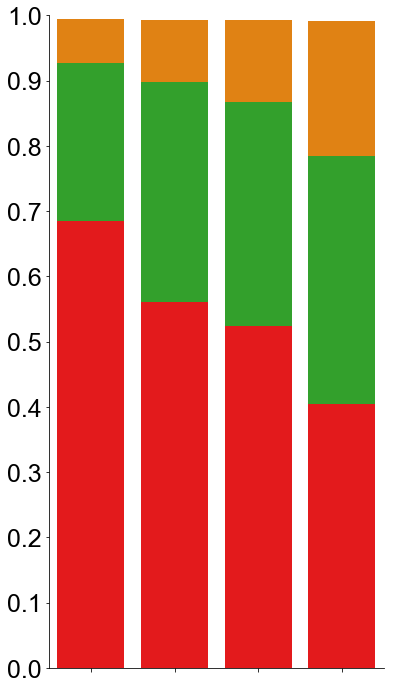

In [169]:
data = fatebias_prob
cmap = {'IRS':'#e31a1c','CX':'#33a02c','MED':'#e08214'}

#generate figure

fig = plt.figure(facecolor = 'w', figsize = (6,12))
ax = plt.axes()

#remove spines and ticks from top and right side

ax.spines['right'].set_color('none')
ax.spines['top'].set_color('none')
ax.xaxis.set_ticks_position('bottom')
ax.yaxis.set_ticks_position('left')

#set x-axis

ax.set_xlim([-0.5, 3.5])
ax.set_xticks([0, 1, 2, 3])
ax.set_xticklabels([], family = 'Arial', fontsize = 40)
#ax.set_xticklabels(['GL1','GL2','GL3','GL4'], family = 'Arial', fontsize = 40)
ax.tick_params(axis='x', which='major', pad=15)

#set y-axis

ax.set_ylim(0,1)
#ax.set_ylabel('Cumulative probability', family = 'Arial', fontsize = 35)
ax.set_yticks([0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0])
ax.set_yticklabels([0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0], family = 'Arial', fontsize = 25)

#plot GL1
i = 'GL1'
pos = 0
ax.bar(pos, data.loc[i,'IRS'], color = cmap['IRS'])
ax.bar(pos, data.loc[i,'CX'], bottom = data.loc[i,'IRS'], color = cmap['CX'])
ax.bar(pos, data.loc[i,'MED'], bottom = data.loc[i,'IRS']+data.loc[i,'CX'], color = cmap['MED'])

#plot GL2
i = 'GL2'
pos = 1
ax.bar(pos, data.loc[i,'IRS'], color = cmap['IRS'])
ax.bar(pos, data.loc[i,'CX'], bottom = data.loc[i,'IRS'], color = cmap['CX'])
ax.bar(pos, data.loc[i,'MED'], bottom = data.loc[i,'IRS']+data.loc[i,'CX'], color = cmap['MED'])

#plot GL3
i = 'GL3'
pos = 2
ax.bar(pos, data.loc[i,'IRS'], color = cmap['IRS'])
ax.bar(pos, data.loc[i,'CX'], bottom = data.loc[i,'IRS'], color = cmap['CX'])
ax.bar(pos, data.loc[i,'MED'], bottom = data.loc[i,'IRS']+data.loc[i,'CX'], color = cmap['MED'])

#plot GL4
i = 'GL4'
pos = 3
ax.bar(pos, data.loc[i,'IRS'], color = cmap['IRS'])
ax.bar(pos, data.loc[i,'CX'], bottom = data.loc[i,'IRS'], color = cmap['CX'])
ax.bar(pos, data.loc[i,'MED'], bottom = data.loc[i,'IRS']+data.loc[i,'CX'], color = cmap['MED'])

figname = 'v1.5_Fig4_bar_GL_bias.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Cell specificity

In [63]:
# Sample uniformly the points to avoid density driven effects - Should reimplement as a method
steps = 50, 50
grs = []
for dim_i in range(vlm_ana2.embedding.shape[1]):
    m, M = np.min(vlm_ana2.embedding[:, dim_i]), np.max(vlm_ana2.embedding[:, dim_i])
    m = m - 0.025 * np.abs(M - m)
    M = M + 0.025 * np.abs(M - m)
    gr = np.linspace(m, M, steps[dim_i])
    grs.append(gr)

meshes_tuple = np.meshgrid(*grs)
gridpoints_coordinates = np.vstack([i.flat for i in meshes_tuple]).T

from sklearn.neighbors import NearestNeighbors
nn = NearestNeighbors()
nn.fit(vlm_ana2.embedding)
dist, ixs = nn.kneighbors(gridpoints_coordinates, 1)

diag_step_dist = np.sqrt((meshes_tuple[0][0,0] - meshes_tuple[0][0,1])**2 + (meshes_tuple[1][0,0] - meshes_tuple[1][1,0])**2)
min_dist = diag_step_dist / 2
ixs = ixs[dist < min_dist]
gridpoints_coordinates = gridpoints_coordinates[dist.flat[:]<min_dist,:]
dist = dist[dist < min_dist]

ixs = np.unique(ixs)

In [64]:
cellID = ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) for c in vlm_ana2.ca['CellID']]

In [65]:
c_sel = ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) for c in vlm_ana2.ca['CellID'][ixs]]
markov_fwd_cells = pd.DataFrame(index = c_sel, columns = c_sel)

for i in ixs:
    cell = cellID[i]
    starting_p = np.array([k==i for k in ixs])
    vlm_ana2.prepare_markov(sigma_D=diag_step_dist, sigma_W=diag_step_dist/2, direction='forward', cells_ixs=ixs)
    vlm_ana2.run_markov(starting_p=starting_p, n_steps=500)
    markov_fwd_cells[cell] = vlm_ana2.diffused

### Checkpoint

In [66]:
#saveData_v1(markov_fwd_cells, path_output, exp_id, 'markov_fwd_cells')

In [103]:
markov_fwd_cells = loadData_v1(path_output, exp_id, 'markov_fwd_cells','DataFrame')

## Degree of commitment based on terminal differentiated cells

In [68]:
cells_term_med = cl_c_ANA[cl_c_ANA.isin(['ANA - 5', 'ANA - 4'])].index
cells_term_cx = cl_c_ANA[cl_c_ANA.isin(['ANA - 10', 'ANA - 11'])].index
cells_term_irs = cl_c_ANA[cl_c_ANA.isin(['ANA - 8', 'ANA - 9'])].index

In [77]:
markov_fwd_cells_term = pd.DataFrame(columns = markov_fwd_cells.columns, index = ['med','cx','irs'])

markov_fwd_cells_term.loc['med'] = markov_fwd_cells.loc[cells_term_med].sum(axis=0)
markov_fwd_cells_term.loc['cx'] = markov_fwd_cells.loc[cells_term_cx].sum(axis=0)
markov_fwd_cells_term.loc['irs'] = markov_fwd_cells.loc[cells_term_irs].sum(axis=0)

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:4: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  after removing the cwd from sys.path.
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:5: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can u

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:49: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


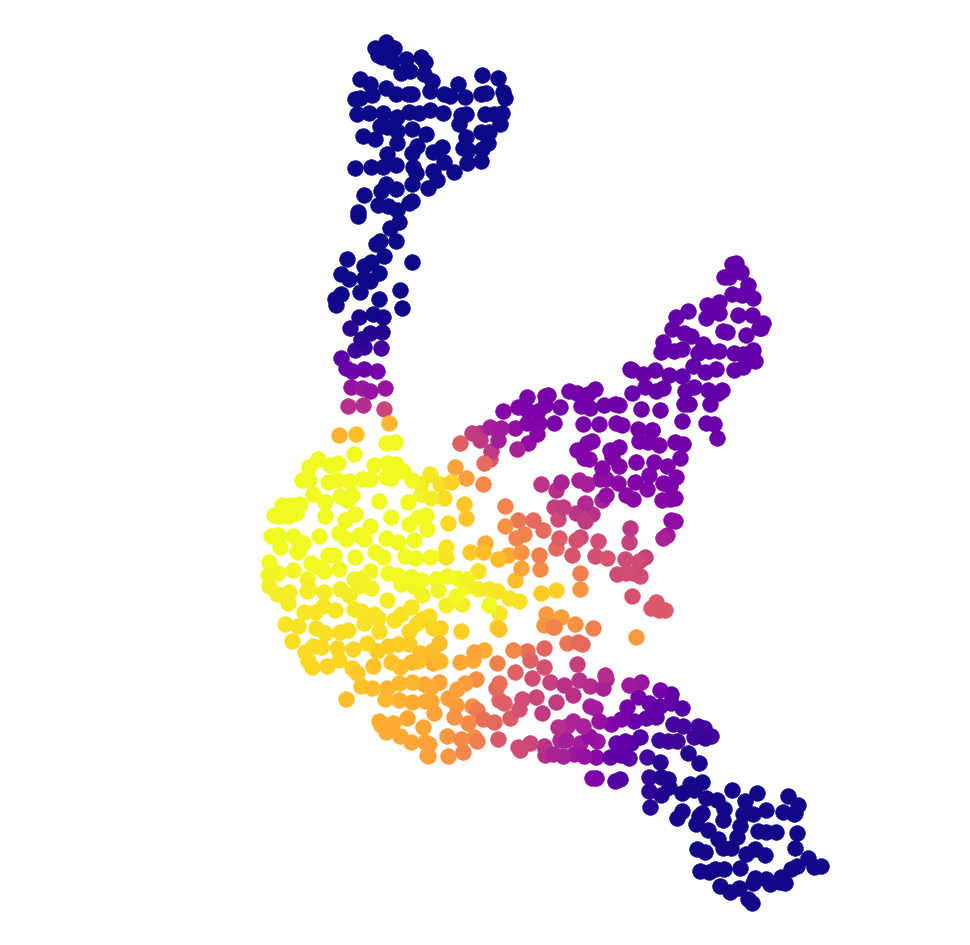

In [78]:
data = markov_fwd_cells_term.max()
data -= np.percentile(data, 10)
data /= np.percentile(data, 90)
data = np.clip(data, 0, 1)

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.plasma_r
time = cells_stage
markers = markers_time
vmin = 0.0
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                marker = markers[time[ix]])

clean_axis(ax1)

## Degree of commitment based on entropy

In [112]:
markov_fwd_cells_ent = pd.Series(index = markov_fwd_cells.columns)

for c in markov_fwd_cells.columns:
    markov_fwd_cells_ent[c] = scipy.stats.entropy(markov_fwd_cells[c])

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:49: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


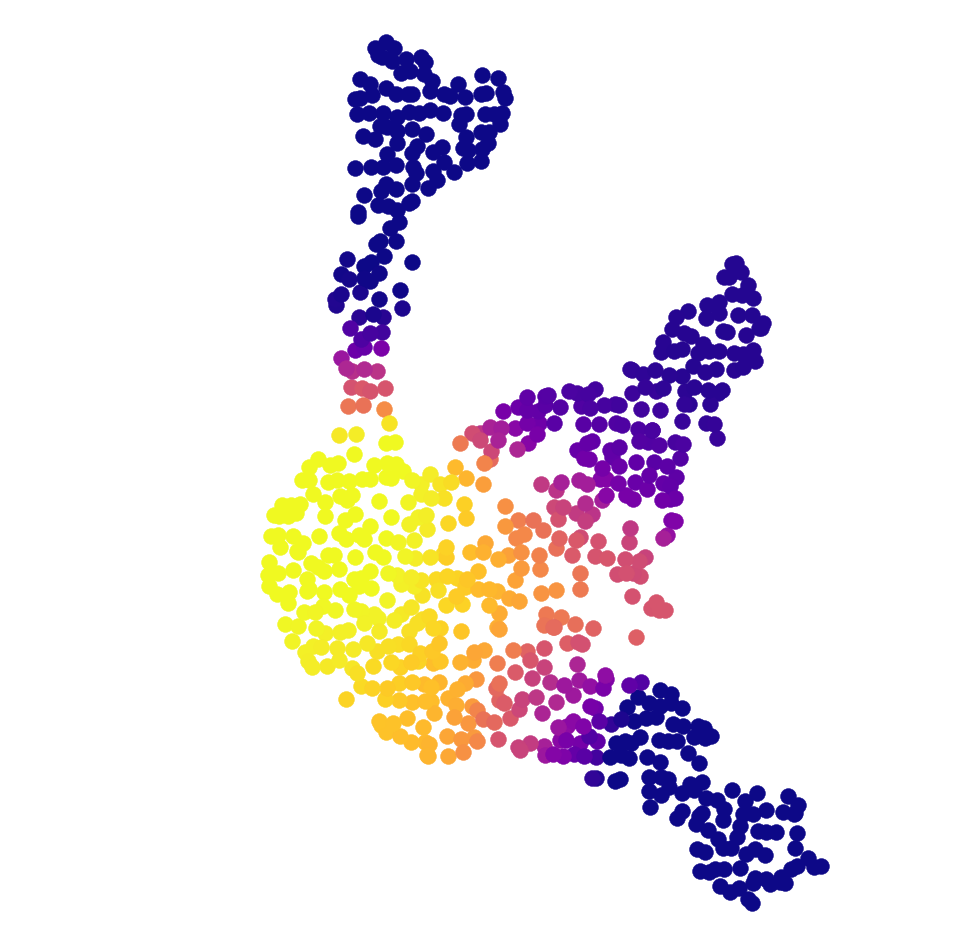

In [117]:
data = markov_fwd_cells_ent
data -= np.percentile(data, 25)
data /= np.percentile(data, 90)
data = np.clip(data, 0, 1)

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.plasma
time = cells_stage
markers = markers_time
vmin = 0.0
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_vlm_markov_ent.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# RNA velocity: model 3

In [81]:
vlm_ana3 = vcy.load_velocyto_hdf5(path_output_vcy + exp_id + '_vlm_ana3.hdf5')

## Plot individual vectors

In [82]:
c_sel = ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) for c in vlm_ana3.ca['CellID']]
delta_embedding_model3 = pd.DataFrame(vlm_ana3.delta_embedding, index = c_sel, columns = ['x','y'])
delta_embedding_random_model3 = pd.DataFrame(vlm_ana3.delta_embedding_random, index = c_sel, columns = ['x','y'])

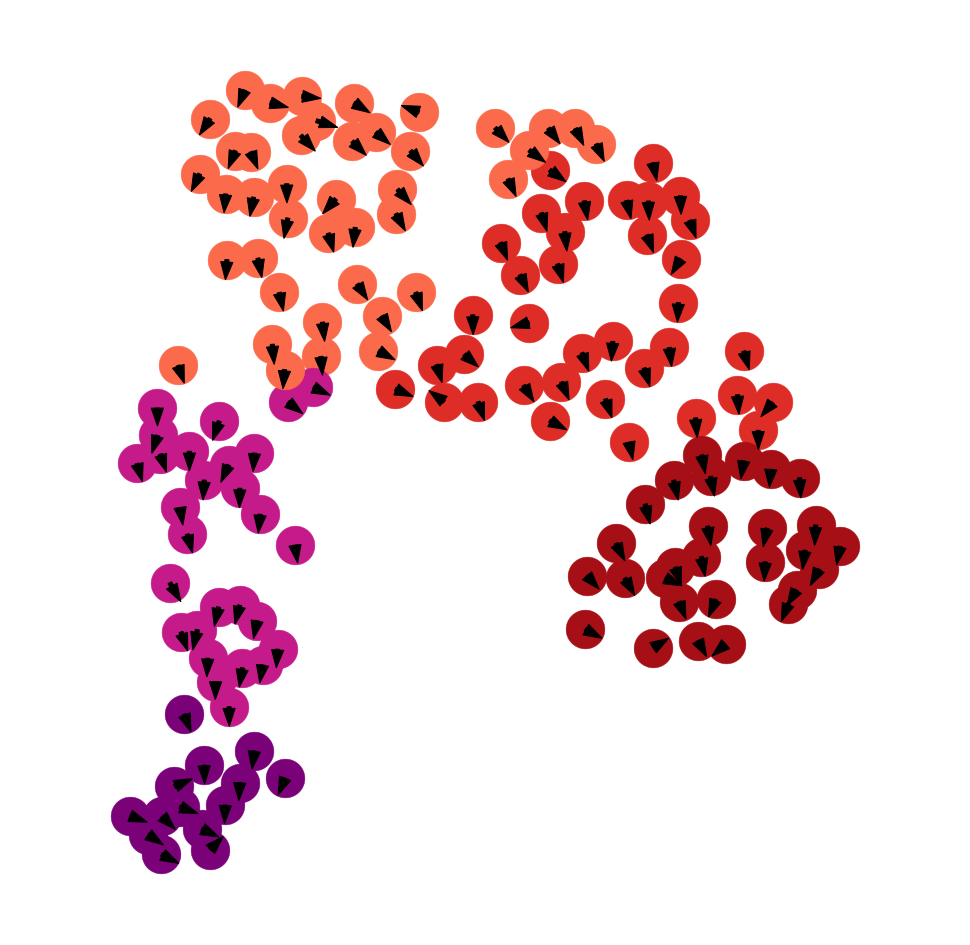

In [83]:
cells = cl_c_ANA_IRS[c_sel]
tsne = umap_ANA_IRS.loc[cells.index]
delta = delta_embedding_model3
cmap = cmap_2nd
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min
x_cent, y_cent = x_min + 0.5 * x_diff, y_min + 0.5 * y_diff,

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_cent - 0.5 * x_diff - pad, y_cent + 0.5 * x_diff + pad,)

if x_diff < y_diff:
    xlim = (x_cent - 0.5 * y_diff - pad, x_cent + 0.5 * y_diff + pad,)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 1500,
                linewidth = 0.5,
                c = cmap[cells[ix]],
                edgecolor=cmap[cells[ix]], 
                marker = markers[time[ix]])
    
    ax1.arrow(x = tsne.loc[ix,'x'], 
              y = tsne.loc[ix,'y'], 
              dx = delta.loc[ix,'x'], 
              dy = delta.loc[ix,'y'],
              width = 0.1, color = 'black')

clean_axis(ax1)

figname = 'v1.5_FigS4_tsne_vlm_matrix_IRS.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

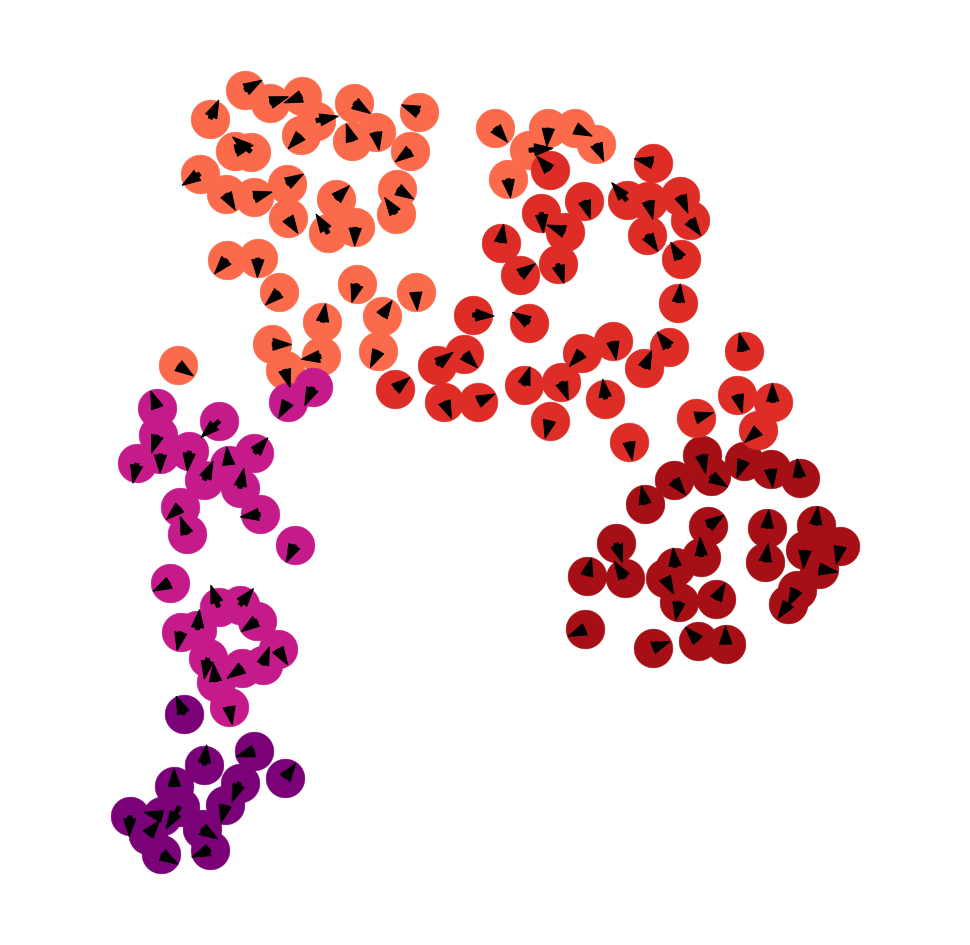

In [84]:
cells = cl_c_ANA_IRS[c_sel]
tsne = umap_ANA_IRS.loc[cells.index]
delta = delta_embedding_random_model3
cmap = cmap_2nd
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min
x_cent, y_cent = x_min + 0.5 * x_diff, y_min + 0.5 * y_diff,

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_cent - 0.5 * x_diff - pad, y_cent + 0.5 * x_diff + pad,)

if x_diff < y_diff:
    xlim = (x_cent - 0.5 * y_diff - pad, x_cent + 0.5 * y_diff + pad,)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 1500,
                linewidth = 0.5,
                c = cmap[cells[ix]],
                edgecolor=cmap[cells[ix]], 
                marker = markers[time[ix]])
    
    ax1.arrow(x = tsne.loc[ix,'x'], 
              y = tsne.loc[ix,'y'], 
              dx = delta.loc[ix,'x'], 
              dy = delta.loc[ix,'y'],
              width = 0.1, color = 'black')

clean_axis(ax1)

figname = 'v1.5_FigS4_tsne_vlm_matrix_IRS_random.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

### Plot vector field

In [85]:
vlm_ana3.colorandum = [cmap_2nd[cl_c_ANA_IRS['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2])]] for c in vlm_ana3.ca['CellID']]

In [86]:
vlm_ana3.calculate_grid_arrows(smooth=1.0, steps=(15, 15), n_neighbors=50)

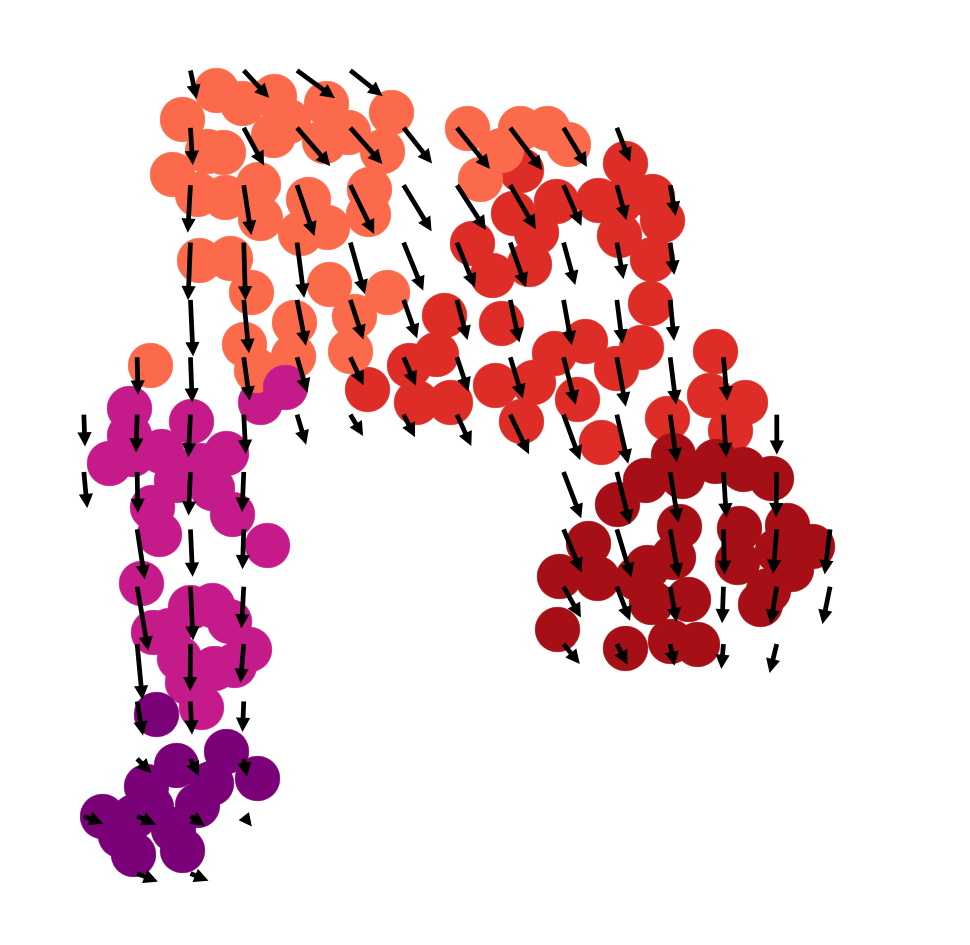

In [88]:
cells = cl_c_ANA_IRS
tsne = umap_ANA_IRS.loc[cells.index]
cmap = cmap_2nd
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 2000,
                linewidth = 0.5,
                c = cmap[cells[ix]],
                edgecolor=cmap[cells[ix]], 
                marker = markers[time[ix]])
    
vlm_ana3.plot_grid_arrows(scatter_kwargs_dict={"alpha":0, "lw":0.0, "edgecolor":"0", "s":1500, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = False,
                     headaxislength=3, headlength=3, headwidth=3, quiver_scale=0.1, width = 0.005)

clean_axis(ax1)

figname = 'v1.5_Fig4_tsne_vlm_IRS_field.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

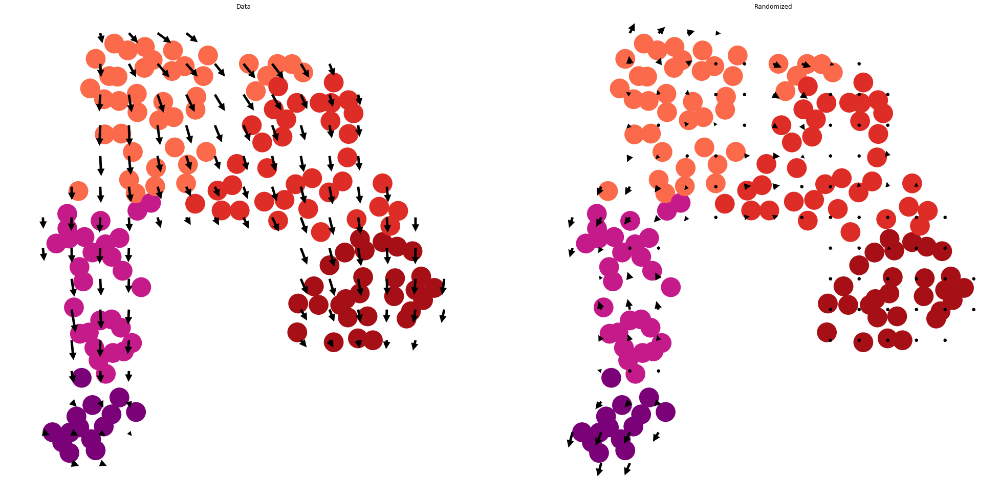

In [93]:
height = 17
width = 17 * 2

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])


vlm_ana3.plot_grid_arrows(scatter_kwargs_dict={"alpha":1, "lw":0.0, "edgecolor":"0", "s":1500, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = True,
                     headaxislength=3, headlength=3, headwidth=3, quiver_scale=0.15)

figname = 'v1.5_Fig4_tsne_vlm_IRS_field_vs_random.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Markov model

In [94]:
diffused_IRS_fwd = loadData_v1(path_output, exp_id, 'diffused_IRS_fwd', 'Series')
diffused_IRS_bwd = loadData_v1(path_output, exp_id, 'diffused_IRS_bwd', 'Series')

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:6: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:49: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


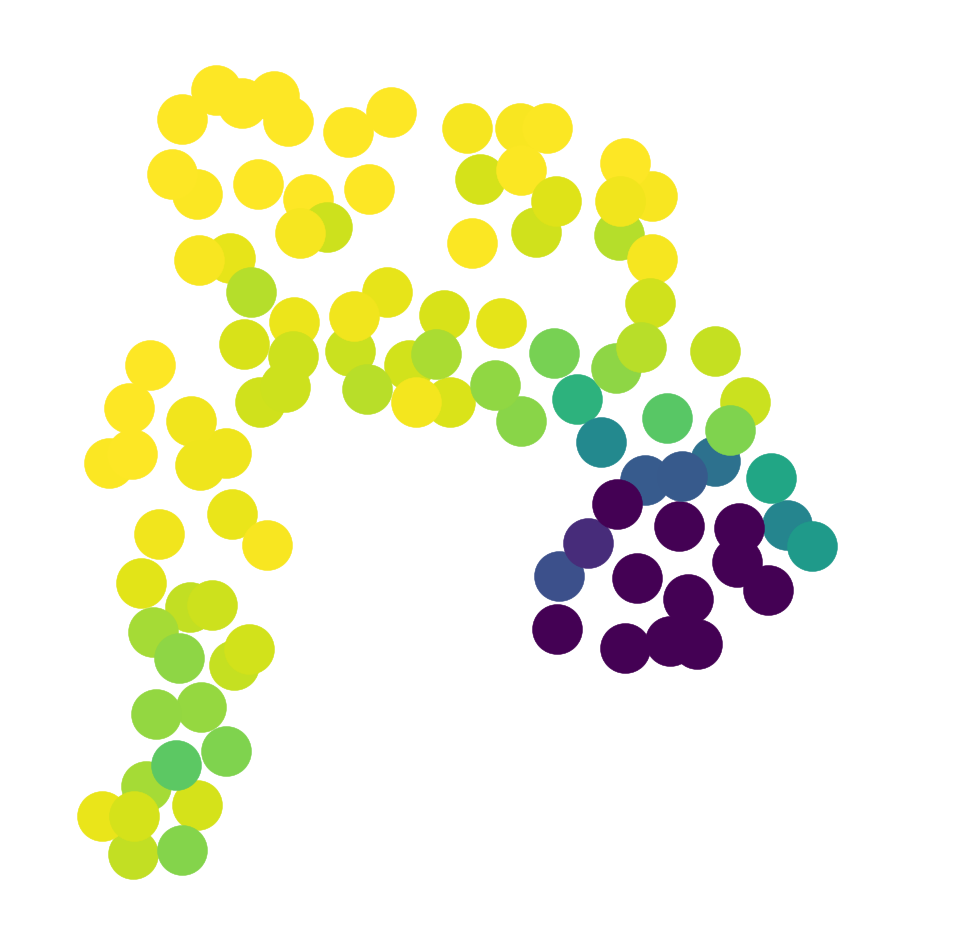

In [95]:
data = diffused_IRS_fwd
data -= np.percentile(data, 10)
data /= np.percentile(data, 90)
data = np.clip(data, 0, 1)

tsne = umap_ANA_IRS.ix[data.index]
cmap = plt.cm.viridis_r
time = cells_stage
markers = markers_time
vmin = 0.0
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 2500,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_vlm_IRS_markov_fwd.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:49: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


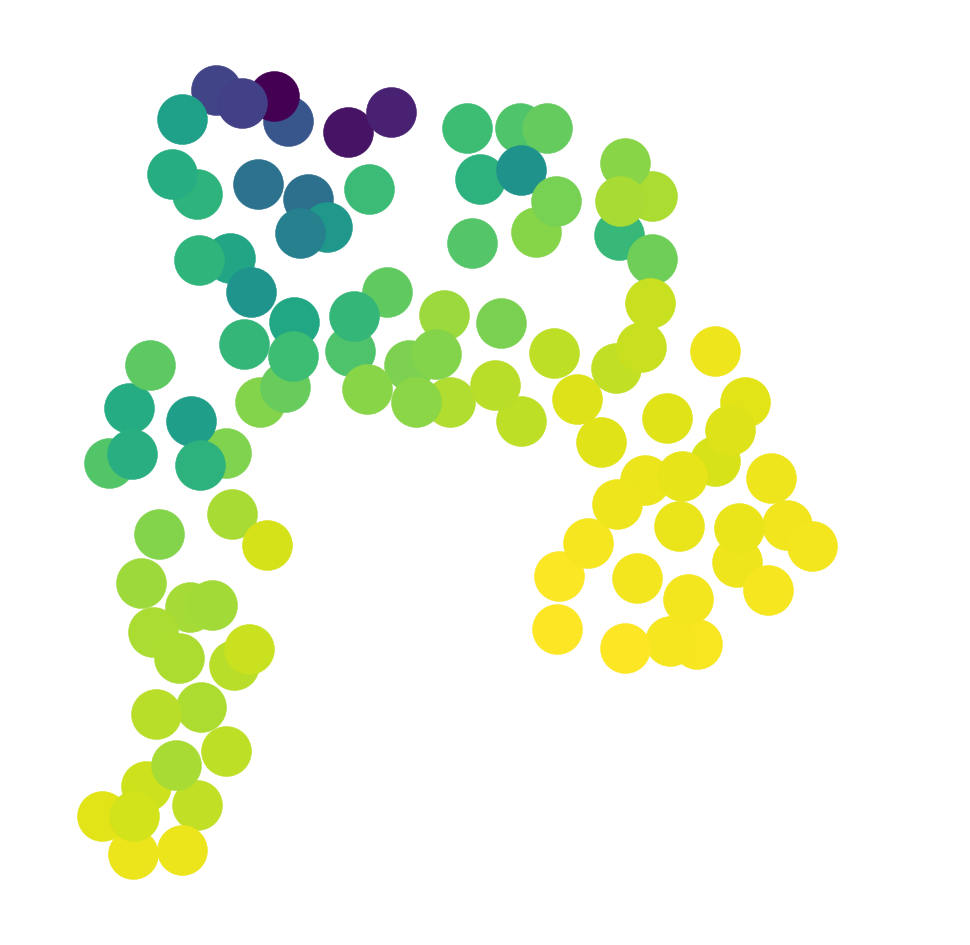

In [96]:
data = diffused_IRS_bwd
data -= np.percentile(data, 0)
data /= np.percentile(data, 100)
data = np.clip(data, 0, 1)

tsne = umap_ANA_IRS.ix[data.index]
cmap = plt.cm.viridis_r
time = cells_stage
markers = markers_time
vmin = 0.0
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 2500,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_vlm_IRS_markov_bwd.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Plot RNA velocity for individual genes in non-ORS cells (model 2 - intermediate)

In [39]:
vlm_ana2b = vcy.load_velocyto_hdf5(path_output_vcy + exp_id + '_vlm_ana2_interm.hdf5')

In [40]:
S_model2b = pd.DataFrame(vlm_ana2b.Sx, index = vlm_ana2b.ra['Gene'], columns = vlm_ana2b.ca['CellID']).astype(float)
S_model2b.columns = ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) for c in vlm_ana2b.ca['CellID']]

U_model2b = pd.DataFrame(vlm_ana2b.Ux, index = vlm_ana2b.ra['Gene'], columns = vlm_ana2b.ca['CellID']).astype(float)
U_model2b.columns = ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) for c in vlm_ana2b.ca['CellID']]

gammas_model2b = pd.Series(vlm_ana2b.gammas, index = vlm_ana2b.ra['Gene'])
q_model2b = pd.Series(vlm_ana2b.q, index = vlm_ana2b.ra['Gene'])

## Plot phase diagrams

In [41]:
cl_c_ANA_v2 = cl_c_ANA.copy()

for c in cl_c_ANA_IRS.index:
    cl_c_ANA_v2[c] = cl_c_ANA_IRS[c]

In [41]:
"""
for gene in ['Lef1','Mt2','Mt1','Dcn','Id3',
            'Aldh1a3','Gpnmb','Sct','Kitl','Padi4','Tnni1',
            'Selenbp1','Rnaset2b','Alox12','Hephl1','Ctsc',
            'Krt28','Taf13','Krt73','Slc39a8','Crym','Cryba4','Anxa9','Nkd2','Gata3','Dsc1']:
    
    data_S = S_model2b.loc[gene]
    data_U = U_model2b.loc[gene]
    gamma = gammas_model2b[gene]
    q = q_model2b[gene]
    groups = cl_c_ANA_v2
    cmap = cmap_2nd

    #initialize figure

    height = 10
    width = 10

    fig = plt.figure(facecolor = 'w', figsize = (width, height))

    ax = plt.subplot(111)

    #set axes

    ax.set_xlim(0, np.max(data_S) * 1.1)
    ax.set_xlabel('Spliced', family = 'Arial', fontsize = 40)
    for ix, t in enumerate(ax.xaxis.get_ticklabels()):
        t.set_family('Arial')
        t.set_fontsize(25)

    ax.set_ylim(0, np.max(data_U) * 1.1)
    ax.set_ylabel('Unspliced', family = 'Arial', fontsize = 40)
    for ix, t in enumerate(ax.yaxis.get_ticklabels()):
        t.set_family('Arial')
        t.set_fontsize(25)

    #plot data

    ax.scatter(data_S, data_U, c = [cmap[groups[c]] for c in data_S.index], s = 100)
    xnew = np.linspace(0, ax.get_xlim()[1])
    ax.plot(xnew, gamma * xnew + q, c='k', lw = 2)
    ax.axvspan(ax.get_xlim()[0], ax.get_xlim()[1], color = 'white', zorder=0)
    
    figname = 'v1.5_Fig4_phase_vlm_model2b_%s.pdf' % gene
    plt.savefig('%s/%s' % (path_figures, figname), 
                format = 'pdf', 
                transparent = True, 
                bbox_inches = 'tight', 
                pad_inches = 0, 
                rasterized = True)
"""

"\nfor gene in ['Lef1','Mt2','Mt1','Dcn','Id3',\n            'Aldh1a3','Gpnmb','Sct','Kitl','Padi4','Tnni1',\n            'Selenbp1','Rnaset2b','Alox12','Hephl1','Ctsc',\n            'Krt28','Taf13','Krt73','Slc39a8','Crym','Cryba4','Anxa9','Nkd2','Gata3','Dsc1']:\n    \n    data_S = S_model2b.loc[gene]\n    data_U = U_model2b.loc[gene]\n    gamma = gammas_model2b[gene]\n    q = q_model2b[gene]\n    groups = cl_c_ANA_v2\n    cmap = cmap_2nd\n\n    #initialize figure\n\n    height = 10\n    width = 10\n\n    fig = plt.figure(facecolor = 'w', figsize = (width, height))\n\n    ax = plt.subplot(111)\n\n    #set axes\n\n    ax.set_xlim(0, np.max(data_S) * 1.1)\n    ax.set_xlabel('Spliced', family = 'Arial', fontsize = 40)\n    for ix, t in enumerate(ax.xaxis.get_ticklabels()):\n        t.set_family('Arial')\n        t.set_fontsize(25)\n\n    ax.set_ylim(0, np.max(data_U) * 1.1)\n    ax.set_ylabel('Unspliced', family = 'Arial', fontsize = 40)\n    for ix, t in enumerate(ax.yaxis.get_ticklabe

## Predict U, calculate velocity and extrapolate

In [42]:
vlm_ana2b.predict_U(which_S='Sx')
vlm_ana2b.calculate_velocity()
vlm_ana2b.calculate_shift(assumption="constant_velocity")
vlm_ana2b.extrapolate_cell_at_t(delta_t=1)

## Plot expression as color

In [43]:
"""
for g in ['Lef1','Mt2','Mt1','Dcn','Id3',
            'Aldh1a3','Gpnmb','Sct','Kitl','Padi4','Tnni1',
            'Selenbp1','Rnaset2b','Alox12','Hephl1','Ctsc',
            'Krt28','Taf13','Krt73','Slc39a8','Crym','Cryba4','Anxa9','Nkd2','Gata3','Dsc1']:
    
    data = S_model2b.loc[g]
    tsne = umap_ANA.ix[data.index]
    cmap = plt.cm.viridis
    time = cells_stage
    markers = markers_time
    vmin = 0
    vmax = np.max(np.abs(np.percentile(data, [1, 99])))

    #initialize figure

    height = 17
    width = 17

    fig = plt.figure(facecolor = 'w', figsize = (width, height))

    #define x- and y-limits

    x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
    y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
    x_diff, y_diff = x_max - x_min, y_max - y_min

    pad = 2.0

    if x_diff > y_diff:
        xlim = (x_min - pad, x_max + pad)
        ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

    if x_diff < y_diff:
        xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
        ylim = (y_min - pad, y_max + pad)

    text_pad = 2

    #draw groups

    ax1 = plt.subplot()

    ax1.set_xlim(xlim[0], xlim[1])
    ax1.set_ylim(ylim[0], ylim[1])

    remove_ticks(ax1)

    for ix in tsne.index:

        ax1.scatter(tsne.loc[ix,'x'],
                    tsne.loc[ix,'y'], 
                    s = 250,
                    linewidth = 0.5,
                    c = cmap((data[ix] - vmin) / (vmax - vmin)),
                    edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                    marker = markers[time[ix]])

    clean_axis(ax1)
    
    figname = 'v1.5_Fig4_vel_expr_model2b_%s.pdf' % g
    plt.savefig('%s/%s' % (path_figures, figname), 
                format = 'pdf', 
                transparent = True, 
                bbox_inches = 'tight', 
                pad_inches = 0, 
                rasterized = True)
"""

"\nfor g in ['Lef1','Mt2','Mt1','Dcn','Id3',\n            'Aldh1a3','Gpnmb','Sct','Kitl','Padi4','Tnni1',\n            'Selenbp1','Rnaset2b','Alox12','Hephl1','Ctsc',\n            'Krt28','Taf13','Krt73','Slc39a8','Crym','Cryba4','Anxa9','Nkd2','Gata3','Dsc1']:\n    \n    data = S_model2b.loc[g]\n    tsne = umap_ANA.ix[data.index]\n    cmap = plt.cm.viridis\n    time = cells_stage\n    markers = markers_time\n    vmin = 0\n    vmax = np.max(np.abs(np.percentile(data, [1, 99])))\n\n    #initialize figure\n\n    height = 17\n    width = 17\n\n    fig = plt.figure(facecolor = 'w', figsize = (width, height))\n\n    #define x- and y-limits\n\n    x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])\n    y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])\n    x_diff, y_diff = x_max - x_min, y_max - y_min\n\n    pad = 2.0\n\n    if x_diff > y_diff:\n        xlim = (x_min - pad, x_max + pad)\n        ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)\n\n    if x_diff < y

In [44]:
"""
for g in ['Lef1','Mt2','Mt1','Dcn','Id3',
            'Aldh1a3','Gpnmb','Sct','Kitl','Padi4','Tnni1',
            'Selenbp1','Rnaset2b','Alox12','Hephl1','Ctsc',
            'Krt28','Taf13','Krt73','Slc39a8','Crym','Cryba4','Anxa9','Nkd2','Gata3','Dsc1']:
    
    data = S_model2b.loc[g]
    tsne = umap_ANA_IRS.loc[cl_c_ANA_IRS.index]
    cmap = plt.cm.viridis
    time = cells_stage
    markers = markers_time
    vmin = 0
    vmax = np.max(np.abs(np.percentile(data, [1, 99])))

    #initialize figure

    height = 17
    width = 17

    fig = plt.figure(facecolor = 'w', figsize = (width, height))

    #define x- and y-limits

    x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
    y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
    x_diff, y_diff = x_max - x_min, y_max - y_min

    pad = 2.0

    if x_diff > y_diff:
        xlim = (x_min - pad, x_max + pad)
        ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

    if x_diff < y_diff:
        xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
        ylim = (y_min - pad, y_max + pad)

    text_pad = 2

    #draw groups

    ax1 = plt.subplot()

    ax1.set_xlim(xlim[0], xlim[1])
    ax1.set_ylim(ylim[0], ylim[1])

    remove_ticks(ax1)

    for ix in tsne.index:

        ax1.scatter(tsne.ix[ix,'x'],
                    tsne.ix[ix,'y'], 
                    s = 2000,
                    linewidth = 0.5,
                    c = cmap((data[ix] - vmin) / (vmax - vmin)),
                    edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                    marker = markers[time[ix]])

    clean_axis(ax1)
    
    figname = 'v1.5_Fig4_vel_IRS_expr_model2b_%s.pdf' % g
    plt.savefig('%s/%s' % (path_figures, figname), 
                format = 'pdf', 
                transparent = True, 
                bbox_inches = 'tight', 
                pad_inches = 0, 
                rasterized = True)
"""

"\nfor g in ['Lef1','Mt2','Mt1','Dcn','Id3',\n            'Aldh1a3','Gpnmb','Sct','Kitl','Padi4','Tnni1',\n            'Selenbp1','Rnaset2b','Alox12','Hephl1','Ctsc',\n            'Krt28','Taf13','Krt73','Slc39a8','Crym','Cryba4','Anxa9','Nkd2','Gata3','Dsc1']:\n    \n    data = S_model2b.loc[g]\n    tsne = umap_ANA_IRS.loc[cl_c_ANA_IRS.index]\n    cmap = plt.cm.viridis\n    time = cells_stage\n    markers = markers_time\n    vmin = 0\n    vmax = np.max(np.abs(np.percentile(data, [1, 99])))\n\n    #initialize figure\n\n    height = 17\n    width = 17\n\n    fig = plt.figure(facecolor = 'w', figsize = (width, height))\n\n    #define x- and y-limits\n\n    x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])\n    y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])\n    x_diff, y_diff = x_max - x_min, y_max - y_min\n\n    pad = 2.0\n\n    if x_diff > y_diff:\n        xlim = (x_min - pad, x_max + pad)\n        ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)\n\n    

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:4: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  after removing the cwd from sys.path.


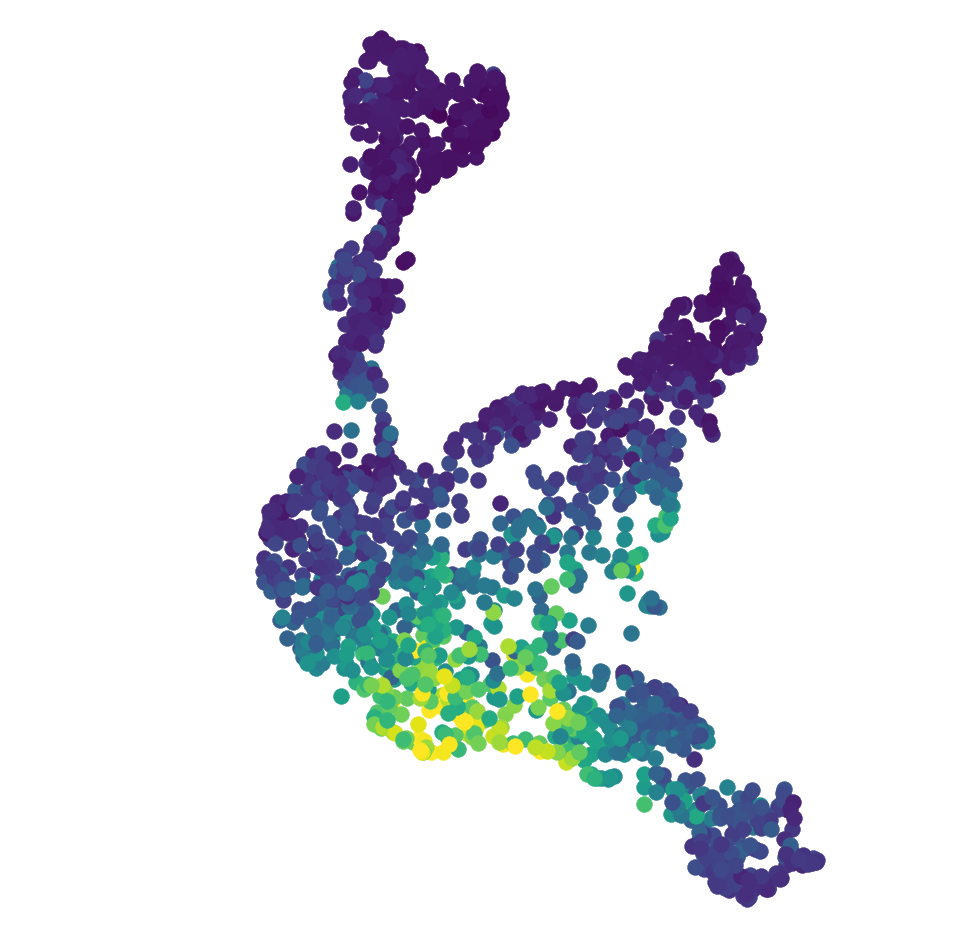

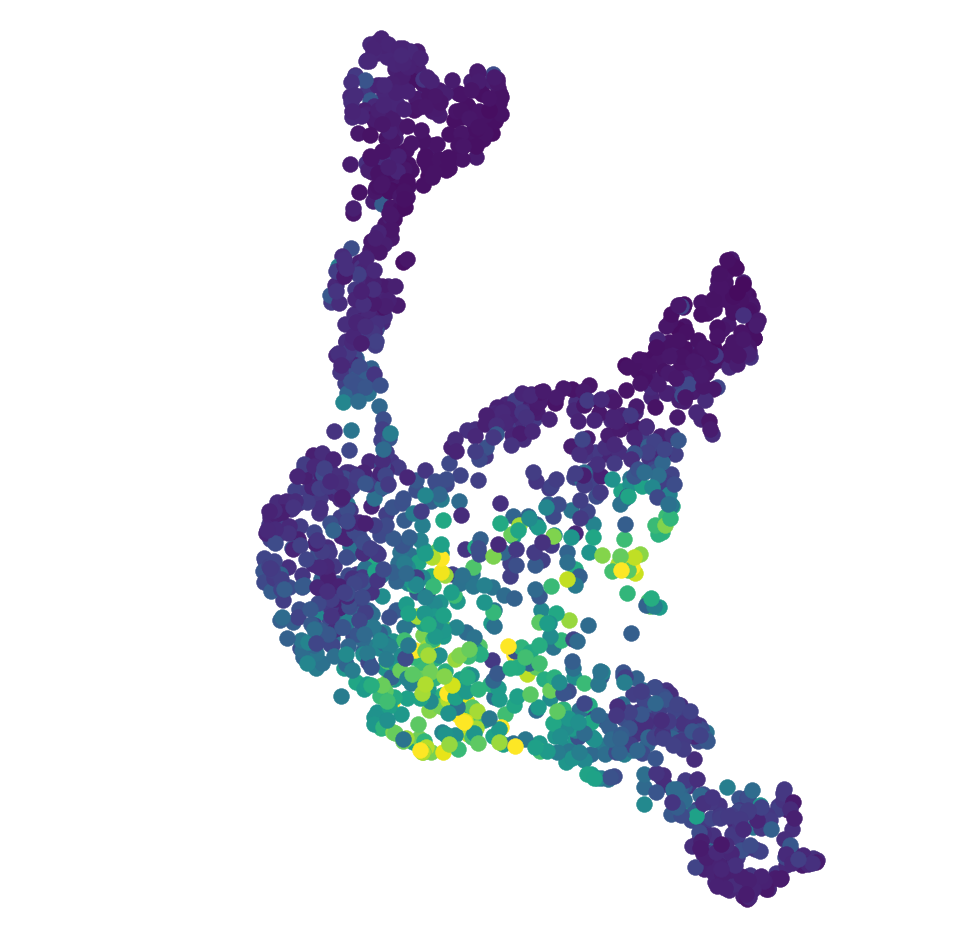

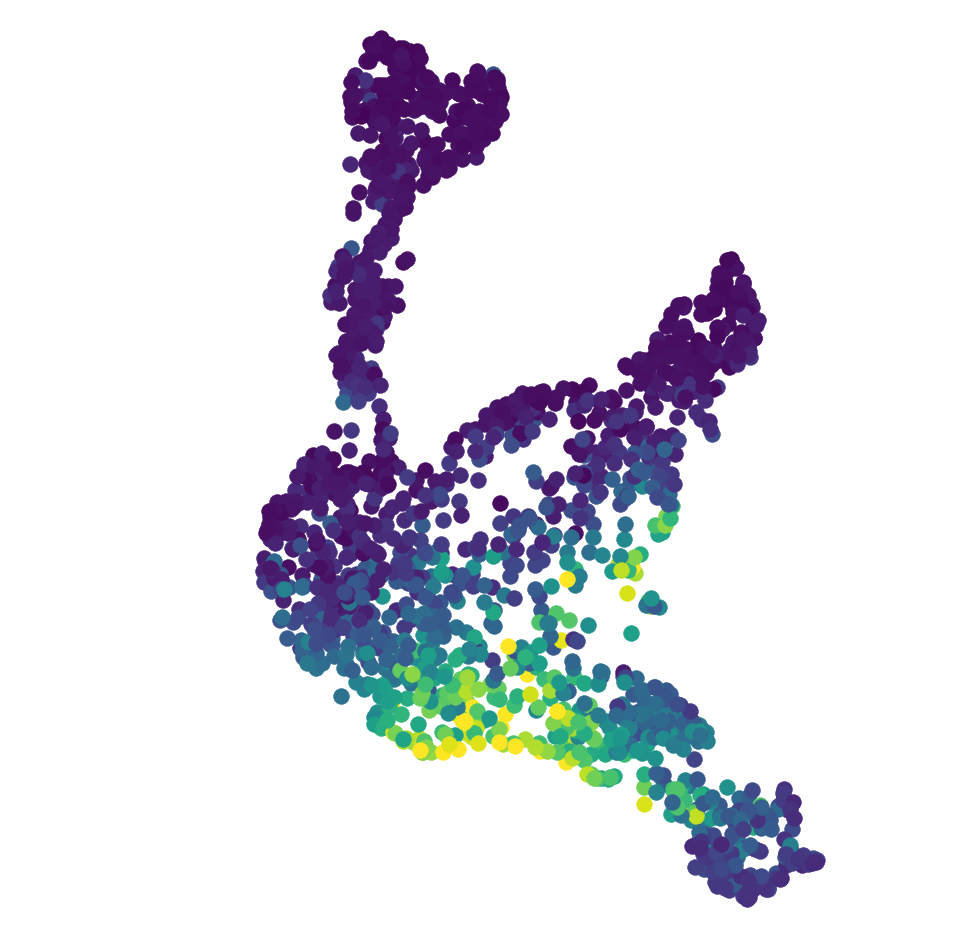

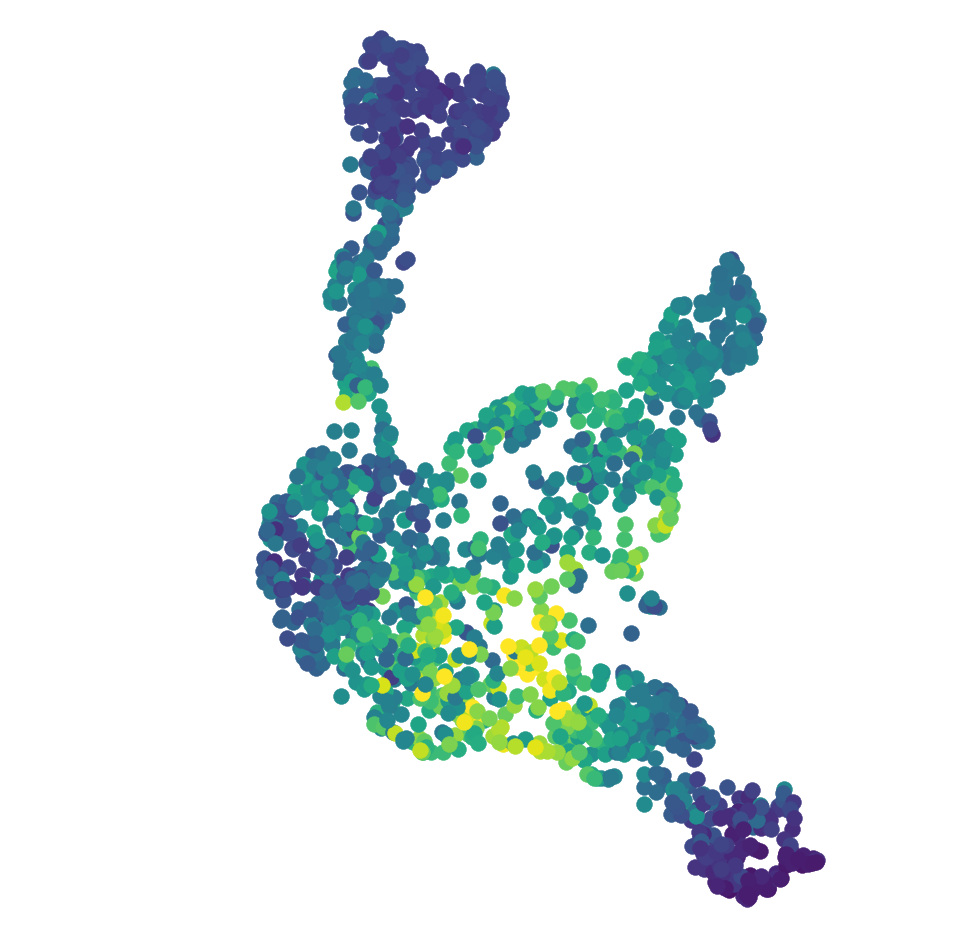

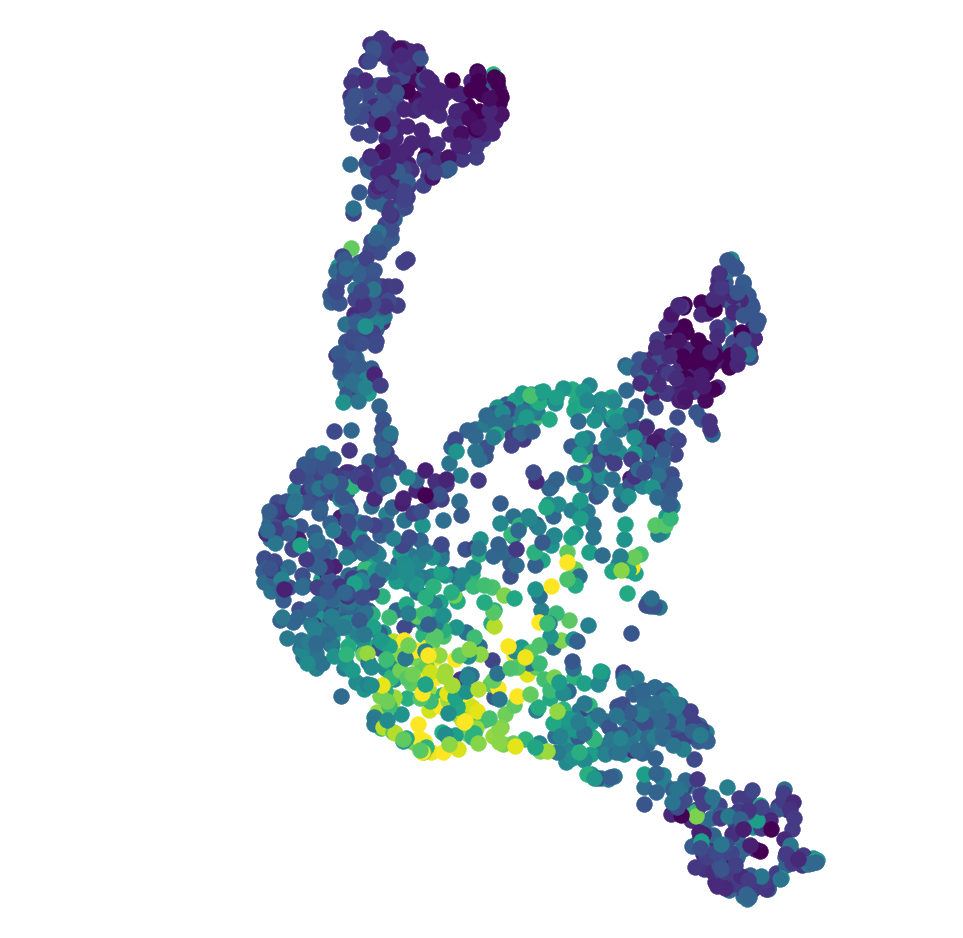

...

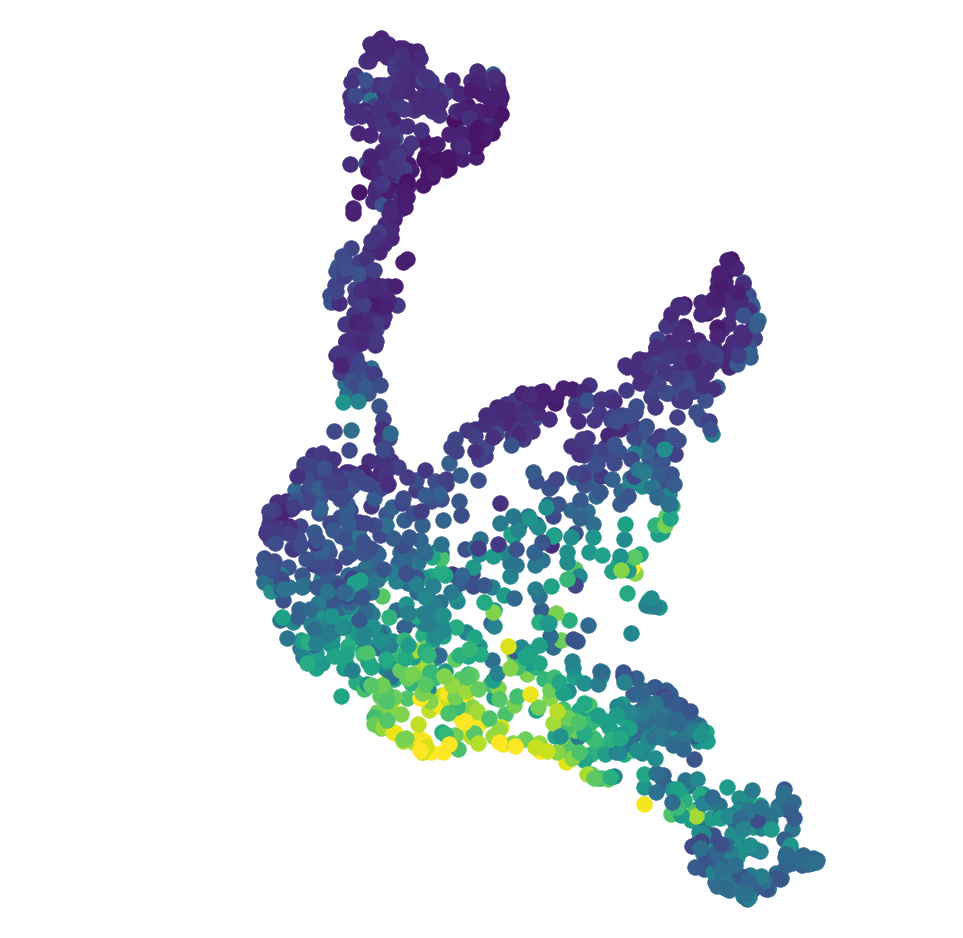

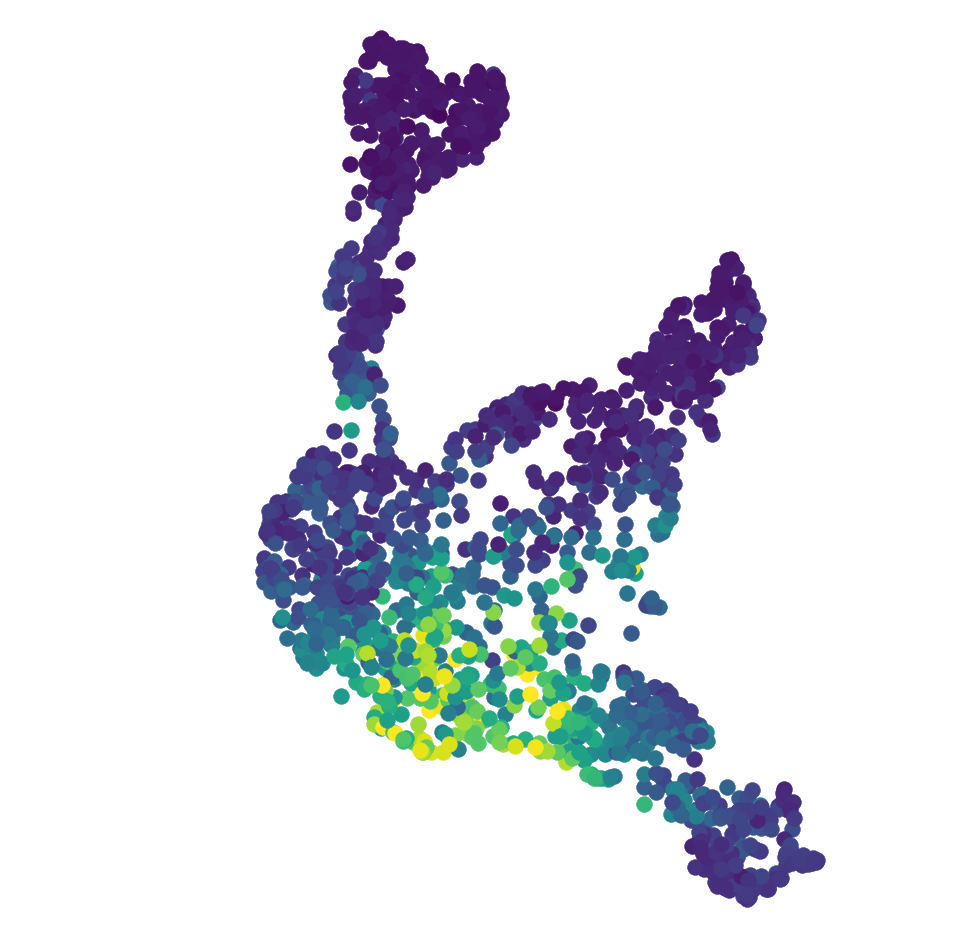

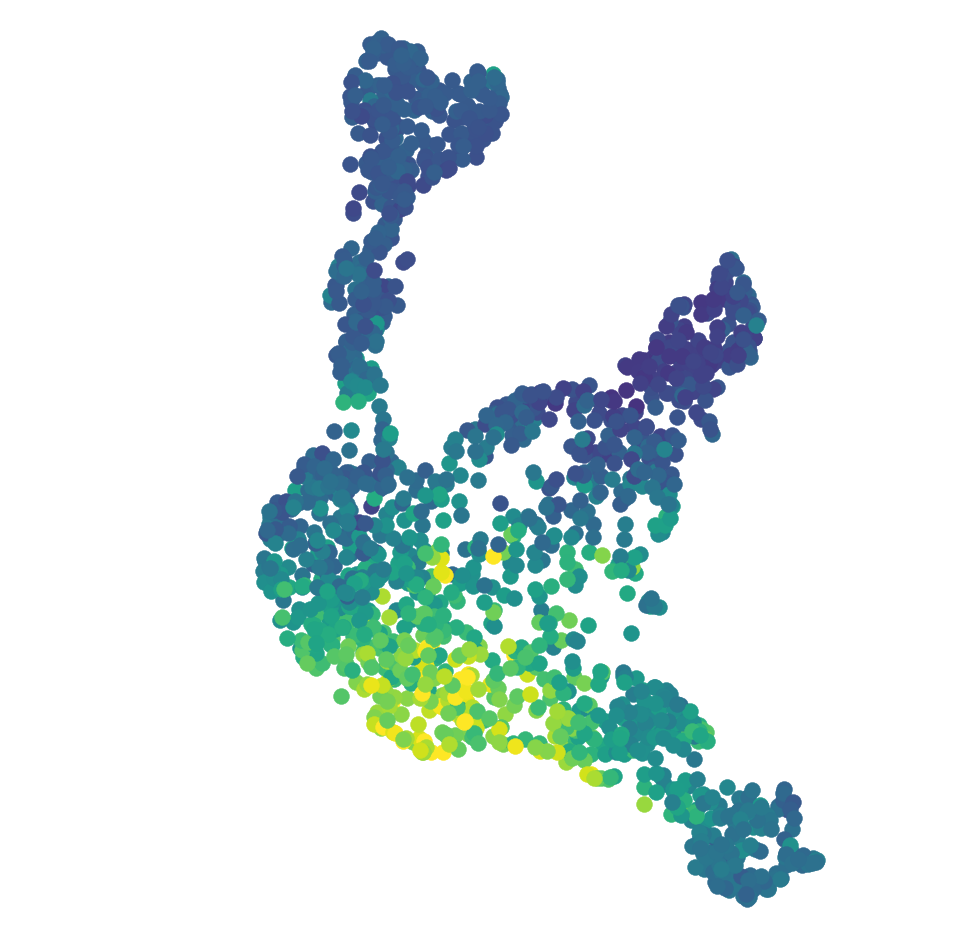

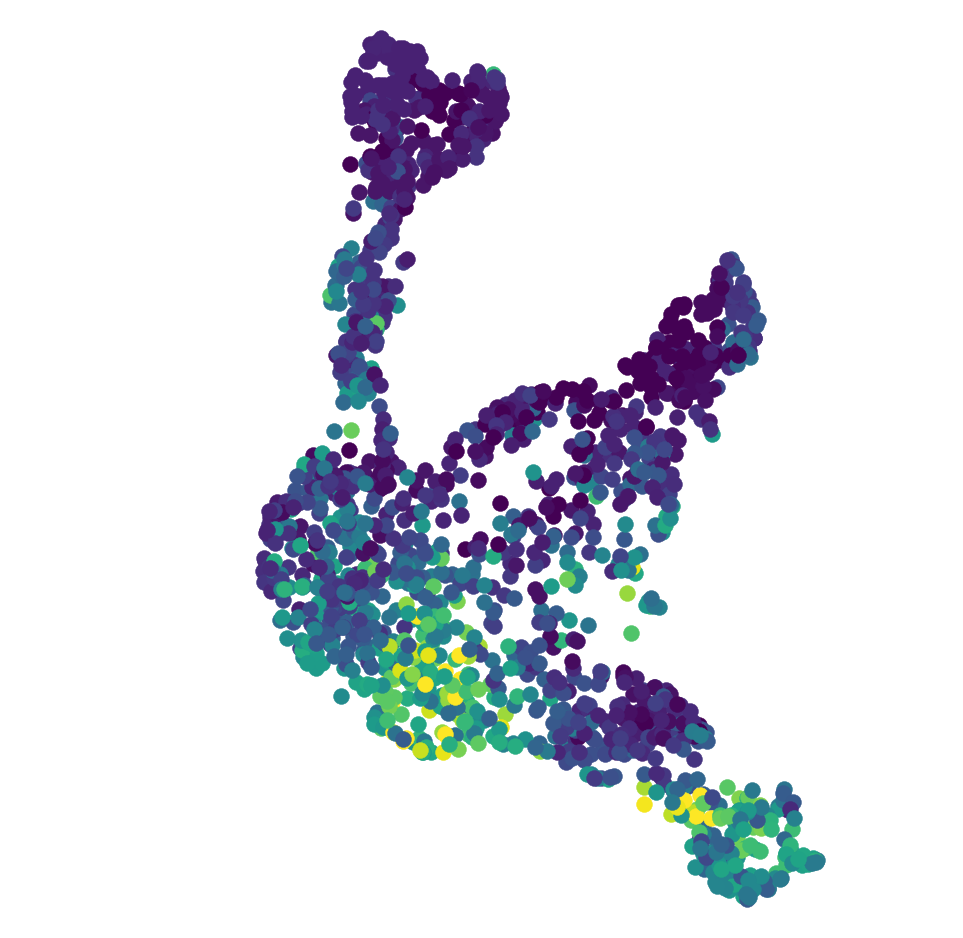

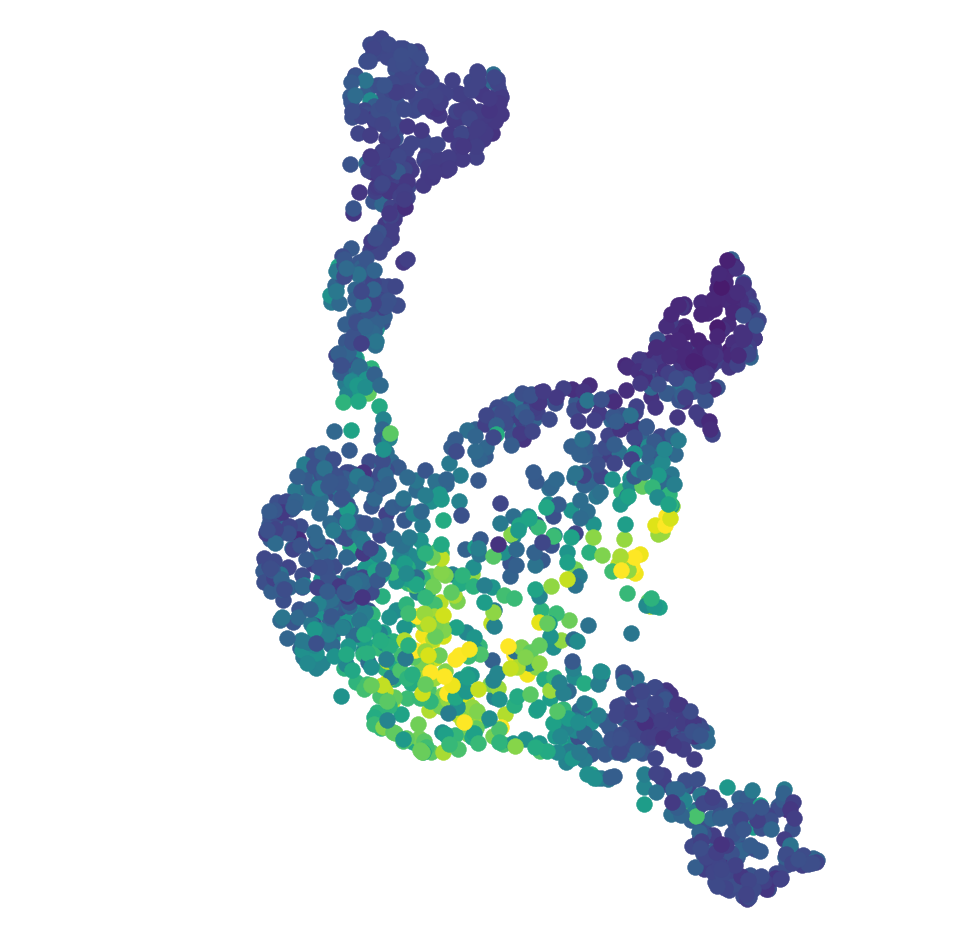

In [48]:
for g in ['Fos','Nfkbia','Atf3','Id2','Id3','H3f3b','Btg2','Egr1','Ubc','Fosb','Id1']:
    
    data = S_model2b.loc[g]
    tsne = umap_ANA.ix[data.index]
    cmap = plt.cm.viridis
    time = cells_stage
    markers = markers_time
    vmin = 0
    vmax = np.max(np.abs(np.percentile(data, [1, 99])))
    
    #initialize figure

    height = 17
    width = 17

    fig = plt.figure(facecolor = 'w', figsize = (width, height))

    #define x- and y-limits

    x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
    y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
    x_diff, y_diff = x_max - x_min, y_max - y_min

    pad = 2.0

    if x_diff > y_diff:
        xlim = (x_min - pad, x_max + pad)
        ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

    if x_diff < y_diff:
        xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
        ylim = (y_min - pad, y_max + pad)

    text_pad = 2

    #draw groups

    ax1 = plt.subplot()

    ax1.set_xlim(xlim[0], xlim[1])
    ax1.set_ylim(ylim[0], ylim[1])

    remove_ticks(ax1)

    for ix in tsne.index:

        ax1.scatter(tsne.loc[ix,'x'],
                    tsne.loc[ix,'y'], 
                    s = 250,
                    linewidth = 0.5,
                    c = np.array([cmap((data[ix] - vmin) / (vmax - vmin))]),
                    edgecolor=np.array([cmap((data[ix] - vmin) / (vmax - vmin))]), 
                    marker = markers[time[ix]])

    clean_axis(ax1)
    
    figname = 'v1.5_Fig4_vel_IRS_expr_model2b_%s.pdf' % g
    plt.savefig('%s/%s' % (path_figures, figname), 
                format = 'pdf', 
                transparent = True, 
                bbox_inches = 'tight', 
                pad_inches = 0, 
                rasterized = True)

## Plot velocity as color

In [43]:
vel2b = pd.DataFrame(vlm_ana2b.Sx_t - vlm_ana2b.Sx, index = vlm_ana2b.ra['Gene'], columns = vlm_ana2b.ca['CellID'])
vel2b.columns = ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) for c in vlm_ana2b.ca['CellID']]

In [ ]:
"""
for g in ['Lef1','Mt2','Mt1','Dcn','Id3',
            'Aldh1a3','Gpnmb','Sct','Kitl','Padi4','Tnni1',
            'Selenbp1','Rnaset2b','Alox12','Hephl1','Ctsc',
            'Krt28','Taf13','Krt73','Slc39a8','Crym','Cryba4','Anxa9','Nkd2','Gata3','Dsc1']:
    
    data = vel2b.loc[g]
    tsne = umap_ANA.ix[data.index]
    cmap = plt.cm.RdBu_r
    time = cells_stage
    markers = markers_time
    vmin = -np.max(np.abs(np.percentile(data, [1, 99])))
    vmax = np.max(np.abs(np.percentile(data, [1, 99])))

    #initialize figure

    height = 17
    width = 17

    fig = plt.figure(facecolor = 'w', figsize = (width, height))

    #define x- and y-limits

    x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
    y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
    x_diff, y_diff = x_max - x_min, y_max - y_min

    pad = 2.0

    if x_diff > y_diff:
        xlim = (x_min - pad, x_max + pad)
        ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

    if x_diff < y_diff:
        xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
        ylim = (y_min - pad, y_max + pad)

    text_pad = 2

    #draw groups

    ax1 = plt.subplot()

    ax1.set_xlim(xlim[0], xlim[1])
    ax1.set_ylim(ylim[0], ylim[1])

    remove_ticks(ax1)

    for ix in tsne.index:

        ax1.scatter(tsne.ix[ix,'x'],
                    tsne.ix[ix,'y'], 
                    s = 250,
                    linewidth = 0.5,
                    c = cmap((data[ix] - vmin) / (vmax - vmin)),
                    edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                    marker = markers[time[ix]])

    clean_axis(ax1)
    
    figname = 'v1.5_Fig4_vel_vlm_model2b_%s.pdf' % g
    plt.savefig('%s/%s' % (path_figures, figname), 
                format = 'pdf', 
                transparent = True, 
                bbox_inches = 'tight', 
                pad_inches = 0, 
                rasterized = True)
"""

In [ ]:
"""
for g in ['Lef1','Mt2','Mt1','Dcn','Id3',
            'Aldh1a3','Gpnmb','Sct','Kitl','Padi4','Tnni1',
            'Selenbp1','Rnaset2b','Alox12','Hephl1','Ctsc',
            'Krt28','Taf13','Krt73','Slc39a8','Crym','Cryba4','Anxa9','Nkd2','Gata3','Dsc1']:
    
    data = vel2b.loc[g]
    tsne = umap_ANA_IRS.loc[cl_c_ANA_IRS.index]
    cmap = plt.cm.RdBu_r
    time = cells_stage
    markers = markers_time
    vmin = -np.max(np.abs(np.percentile(data, [1, 99])))
    vmax = np.max(np.abs(np.percentile(data, [1, 99])))

    #initialize figure

    height = 17
    width = 17

    fig = plt.figure(facecolor = 'w', figsize = (width, height))

    #define x- and y-limits

    x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
    y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
    x_diff, y_diff = x_max - x_min, y_max - y_min

    pad = 2.0

    if x_diff > y_diff:
        xlim = (x_min - pad, x_max + pad)
        ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

    if x_diff < y_diff:
        xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
        ylim = (y_min - pad, y_max + pad)

    text_pad = 2

    #draw groups

    ax1 = plt.subplot()

    ax1.set_xlim(xlim[0], xlim[1])
    ax1.set_ylim(ylim[0], ylim[1])

    remove_ticks(ax1)

    for ix in tsne.index:

        ax1.scatter(tsne.ix[ix,'x'],
                    tsne.ix[ix,'y'], 
                    s = 2000,
                    linewidth = 0.5,
                    c = cmap((data[ix] - vmin) / (vmax - vmin)),
                    edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                    marker = markers[time[ix]])

    clean_axis(ax1)
    
    figname = 'v1.5_Fig4_vel_IRS_vlm_model2b_%s.pdf' % g
    plt.savefig('%s/%s' % (path_figures, figname), 
                format = 'pdf', 
                transparent = True, 
                bbox_inches = 'tight', 
                pad_inches = 0, 
                rasterized = True)
"""

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:4: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  after removing the cwd from sys.path.
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:47: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:48: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


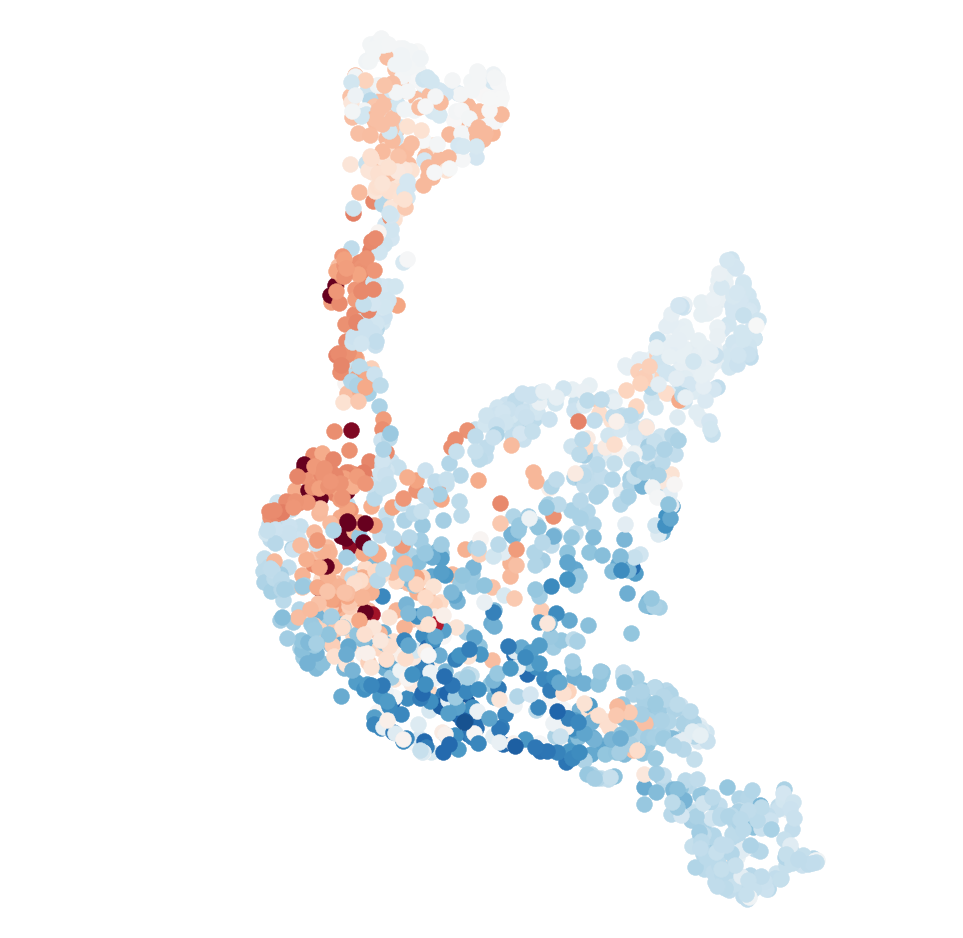

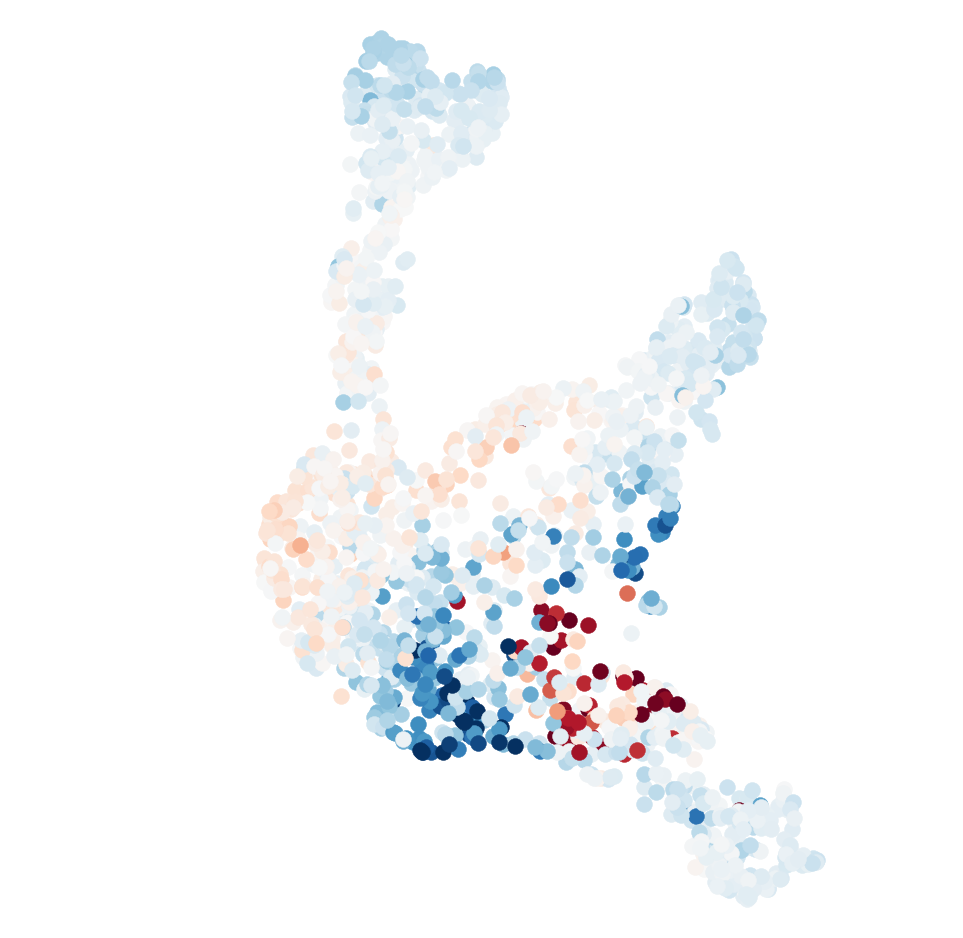

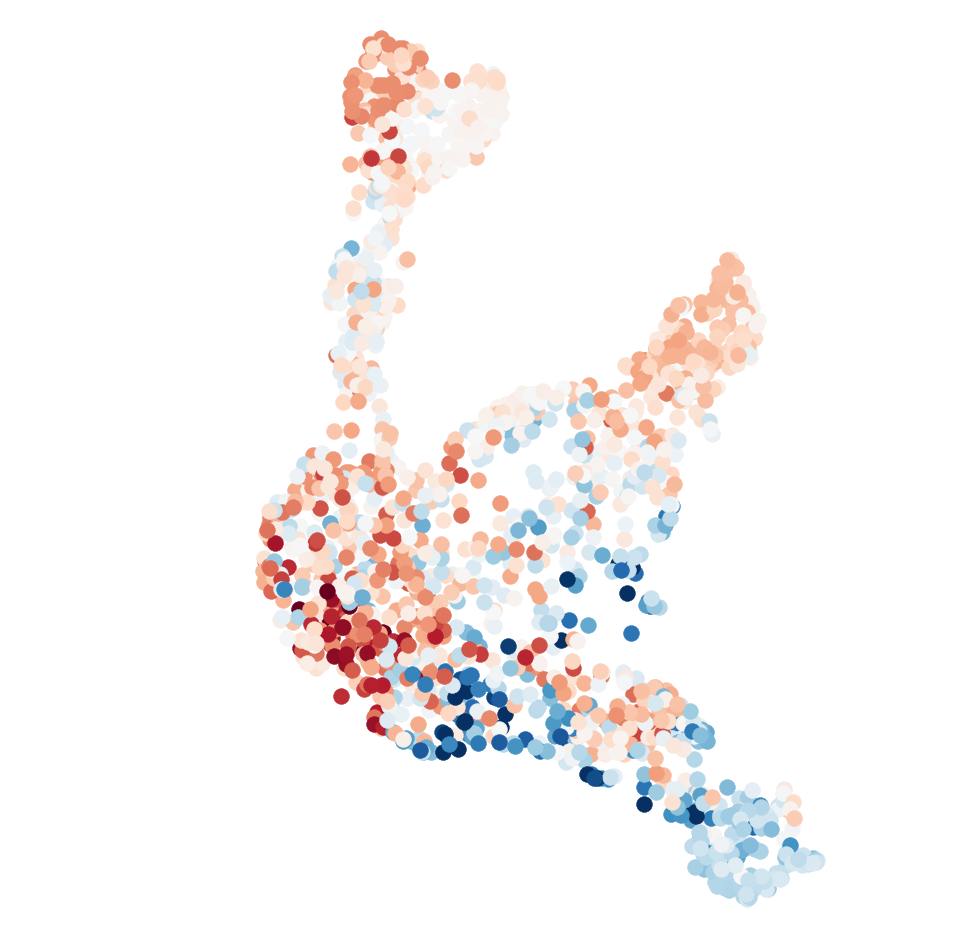

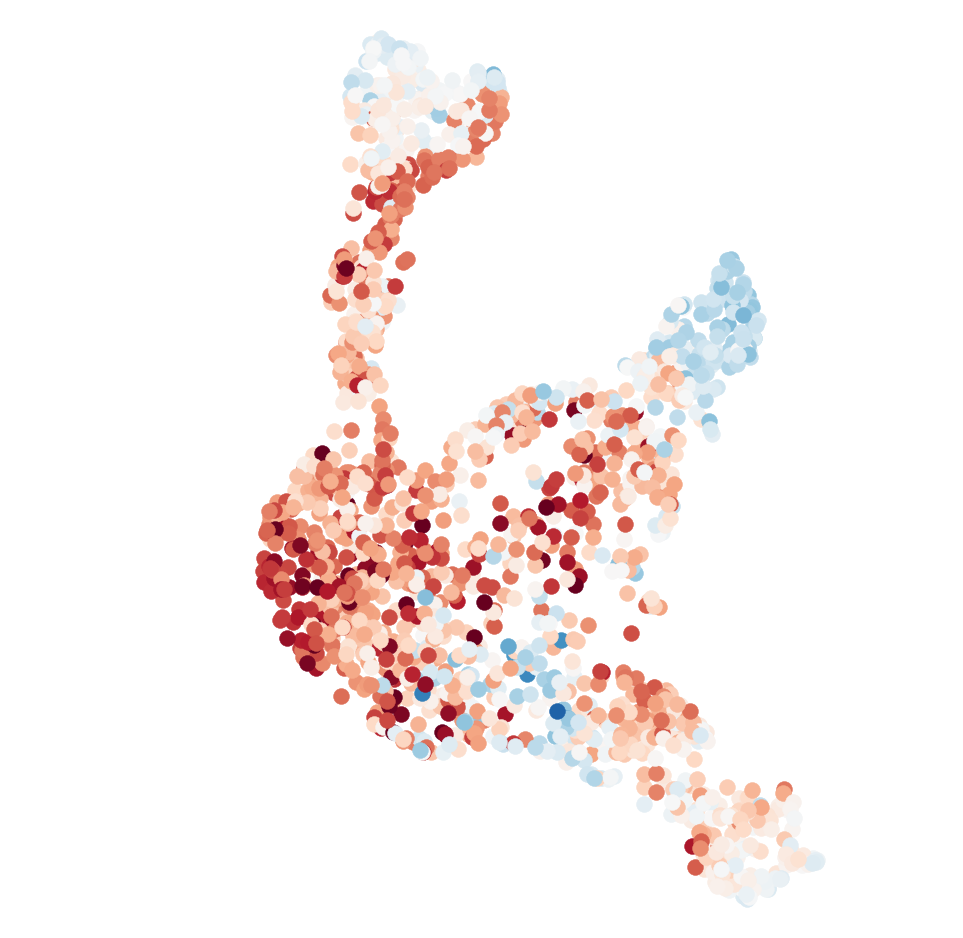

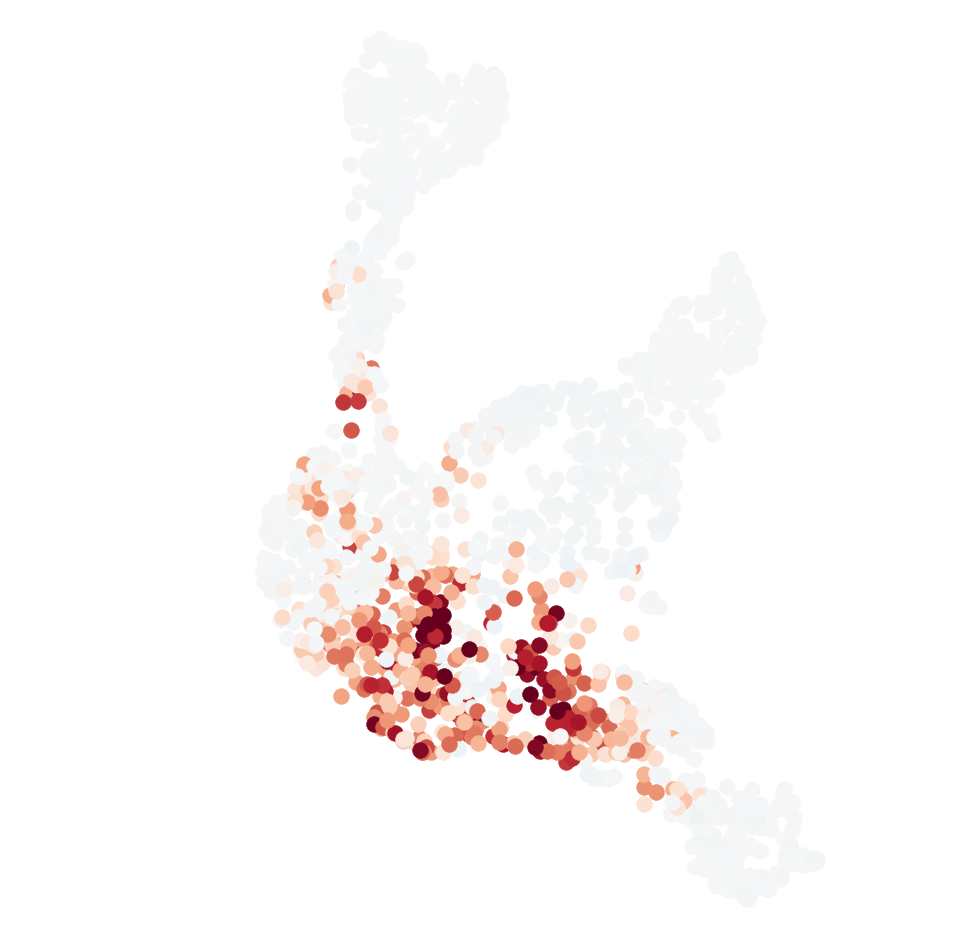

...

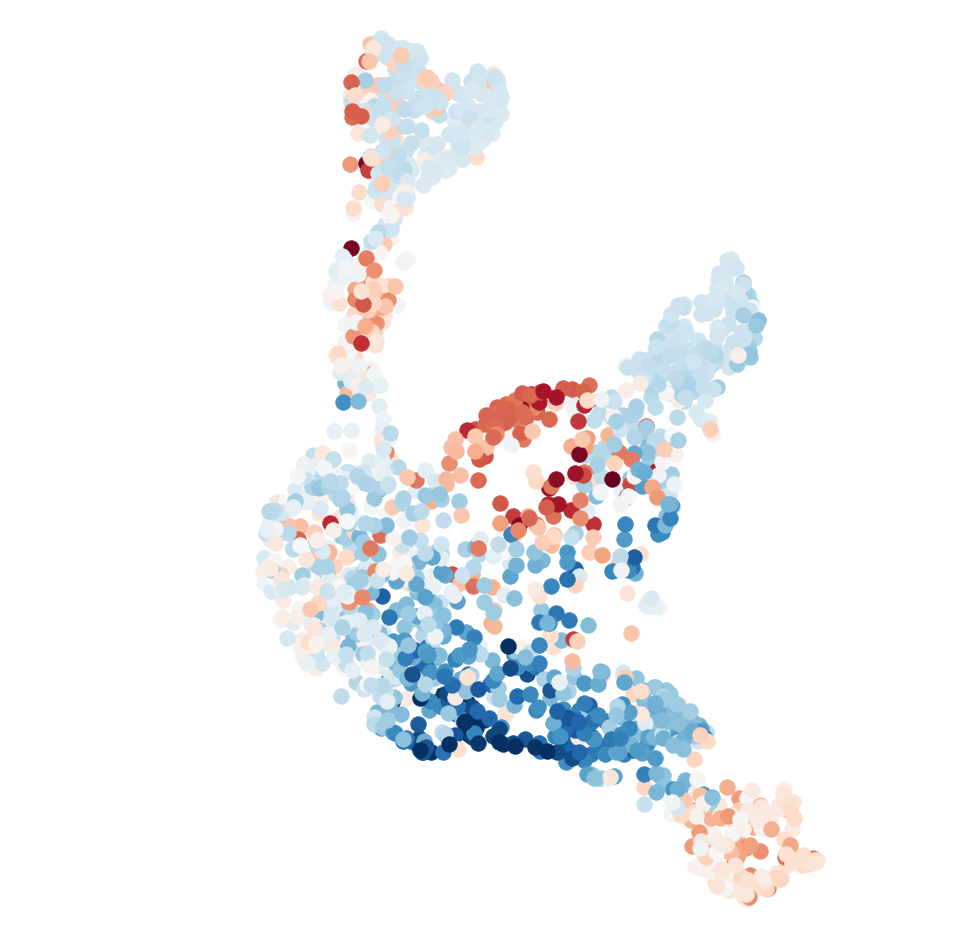

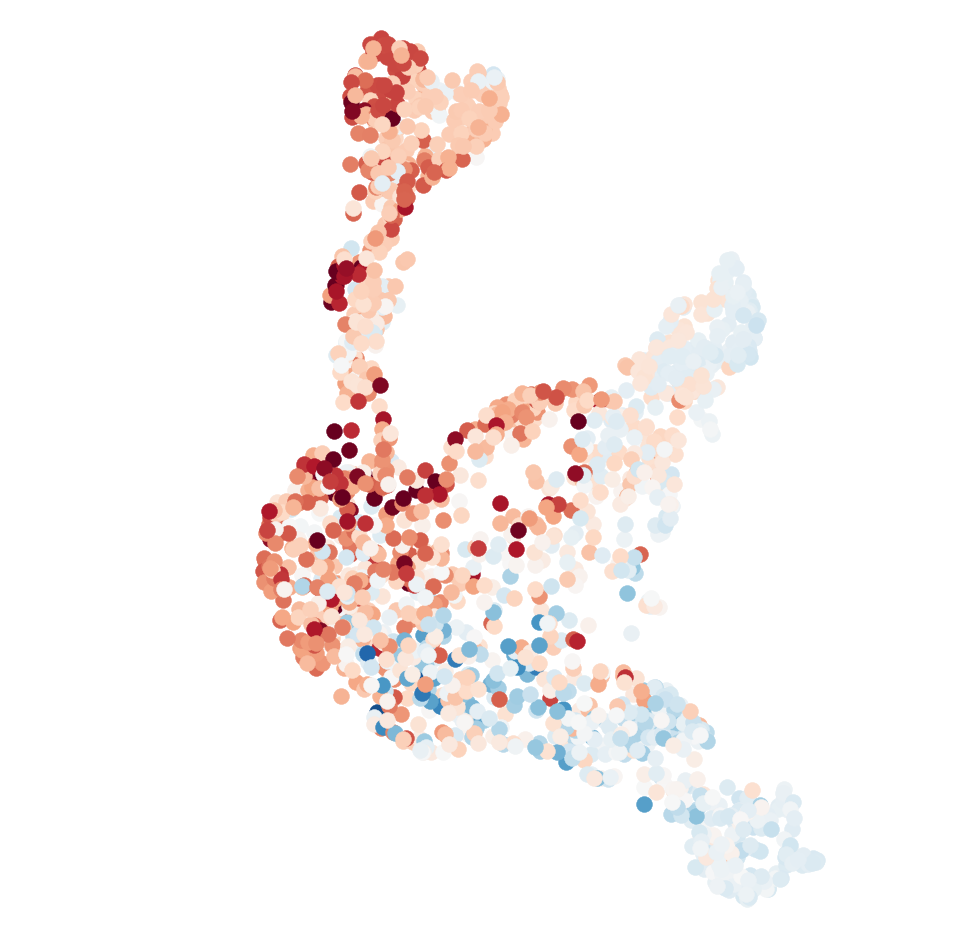

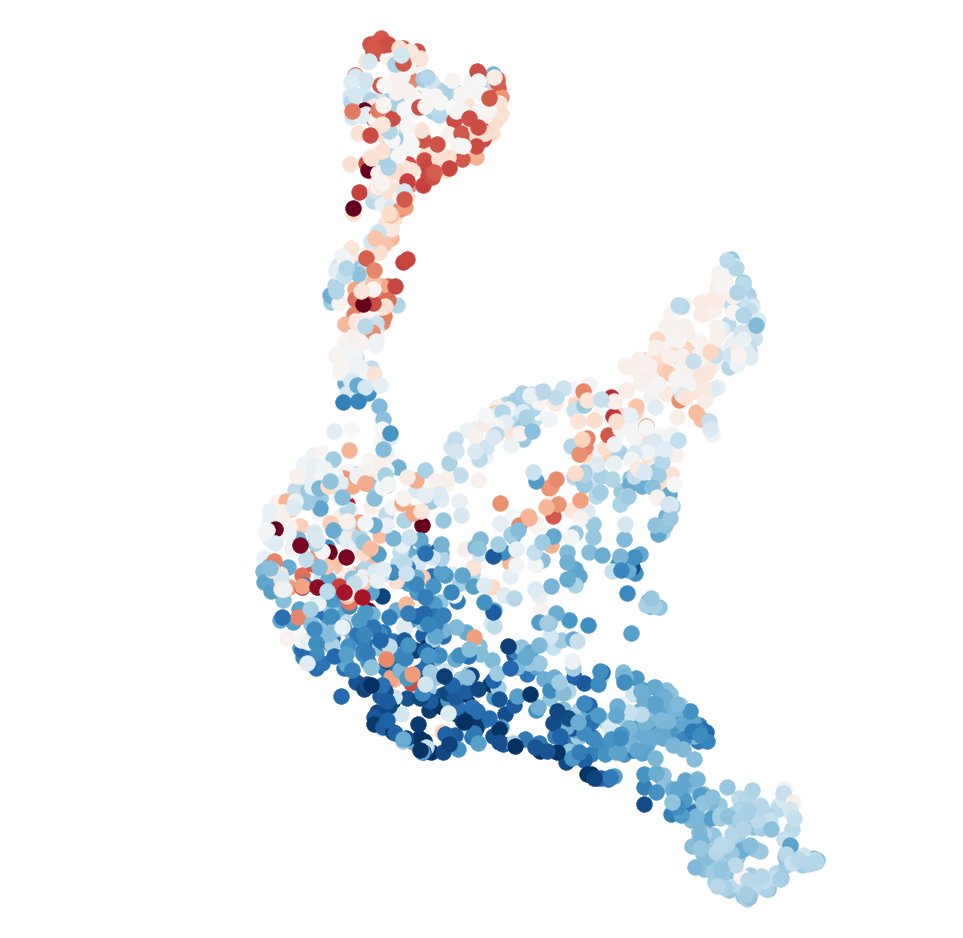

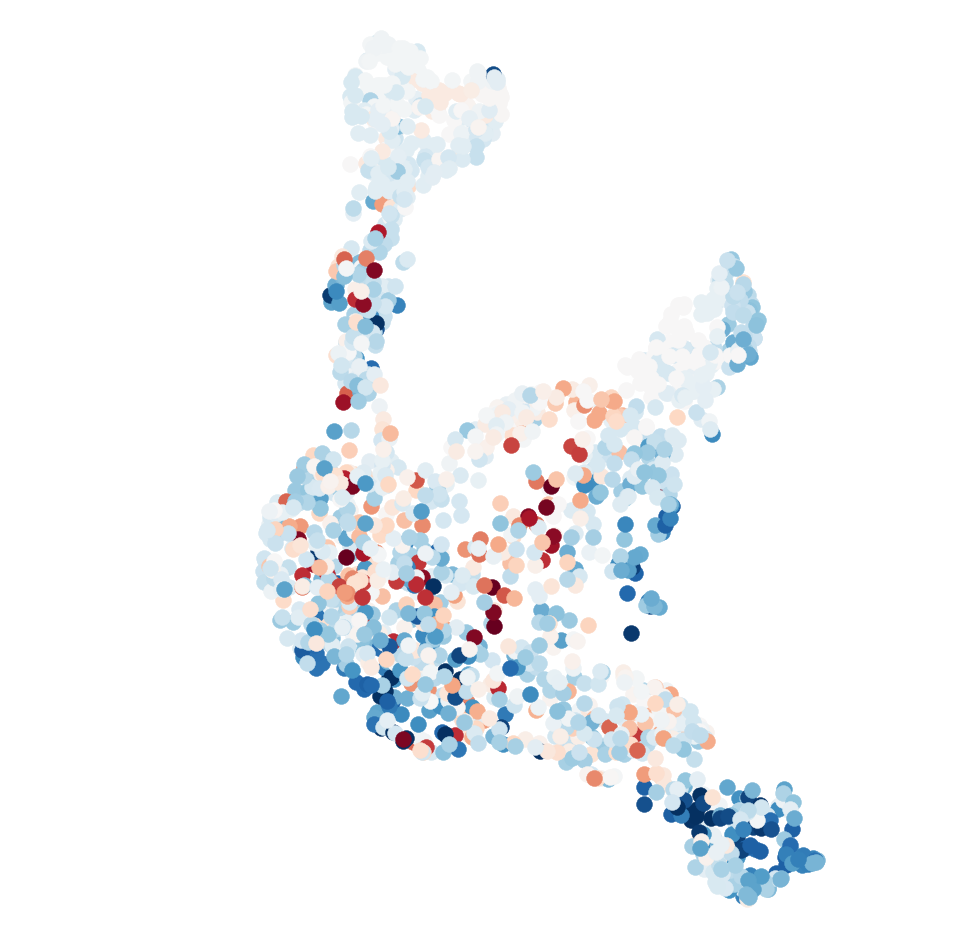

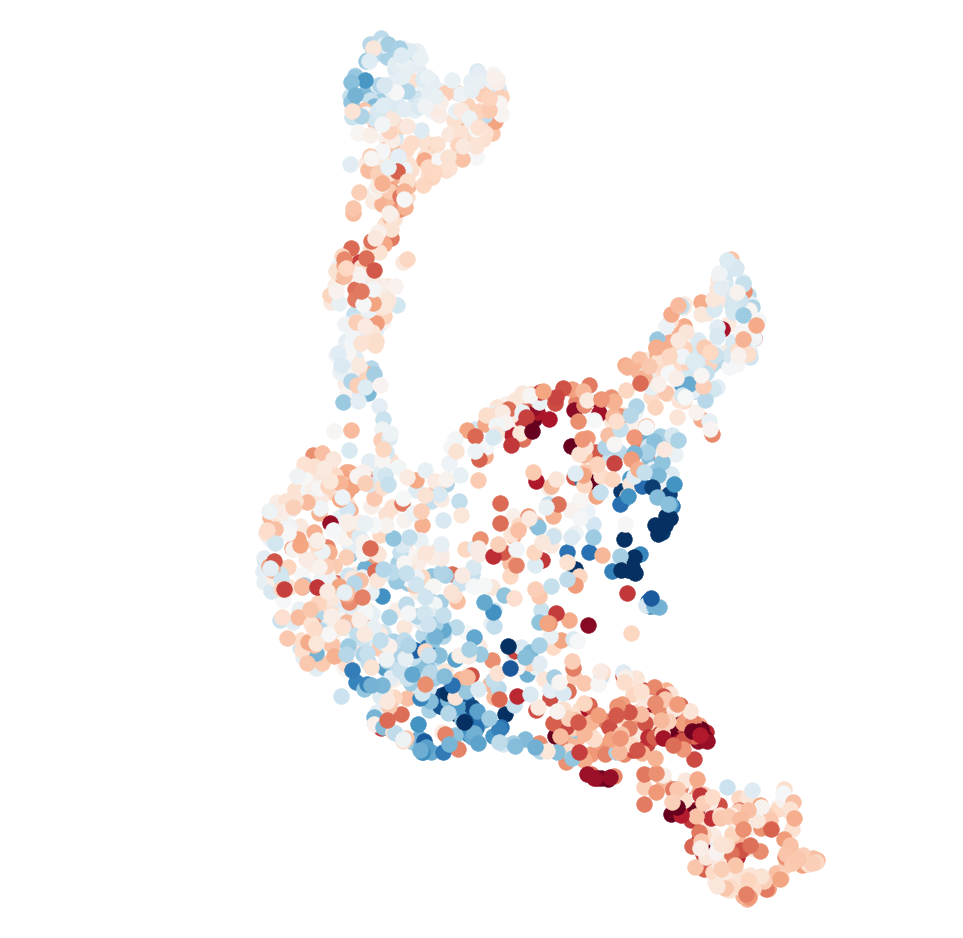

In [47]:
for g in ['Fos','Nfkbia','Atf3','Id2','Id3','H3f3b','Btg2','Egr1','Ubc','Fosb','Id1']:
    
    data = vel2b.loc[g]
    tsne = umap_ANA.ix[data.index]
    cmap = plt.cm.RdBu_r
    time = cells_stage
    markers = markers_time
    vmin = -np.max(np.abs(np.percentile(data, [1, 99])))
    vmax = np.max(np.abs(np.percentile(data, [1, 99])))

    #initialize figure

    height = 17
    width = 17

    fig = plt.figure(facecolor = 'w', figsize = (width, height))

    #define x- and y-limits

    x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
    y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
    x_diff, y_diff = x_max - x_min, y_max - y_min

    pad = 2.0

    if x_diff > y_diff:
        xlim = (x_min - pad, x_max + pad)
        ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

    if x_diff < y_diff:
        xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
        ylim = (y_min - pad, y_max + pad)

    text_pad = 2

    #draw groups

    ax1 = plt.subplot()

    ax1.set_xlim(xlim[0], xlim[1])
    ax1.set_ylim(ylim[0], ylim[1])

    remove_ticks(ax1)

    for ix in tsne.index:

        ax1.scatter(tsne.ix[ix,'x'],
                    tsne.ix[ix,'y'], 
                    s = 250,
                    linewidth = 0.5,
                    c = np.array([cmap((data[ix] - vmin) / (vmax - vmin))]),
                    edgecolor=np.array([cmap((data[ix] - vmin) / (vmax - vmin))]), 
                    marker = markers[time[ix]])

    clean_axis(ax1)
    
    figname = 'v1.5_Fig4_vel_IRS_vlm_model2b_%s.pdf' % g
    plt.savefig('%s/%s' % (path_figures, figname), 
                format = 'pdf', 
                transparent = True, 
                bbox_inches = 'tight', 
                pad_inches = 0, 
                rasterized = True)

# Expression of Lef1, Id3, Gata3

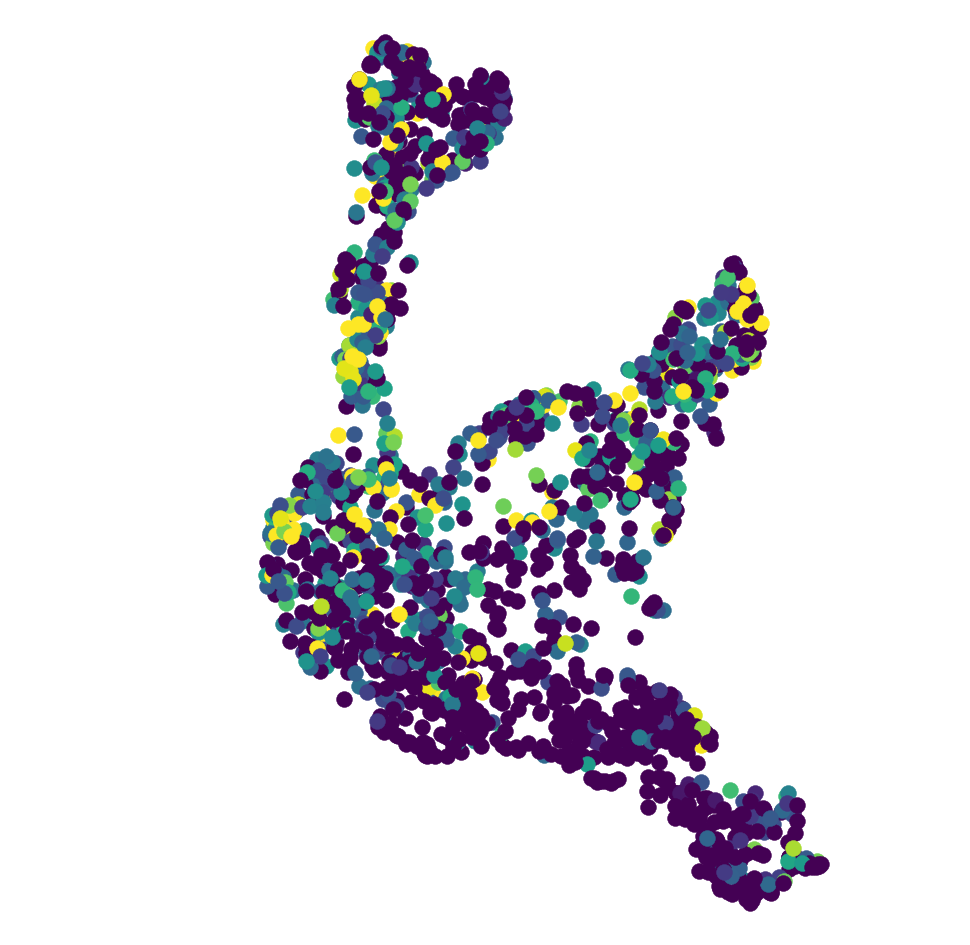

In [40]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
tsne = umap_ANA.loc[cells.index]
expr = seqN.loc['Lef1', cells.index]
vmin = np.percentile(expr, 5)
vmax = np.percentile(expr, 95)
expr = (expr - vmin) / (vmax - vmin)
cmap = plt.cm.viridis
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap(expr[ix]),
                edgecolor=cmap(expr[ix]), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_tSNE_Lef1.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

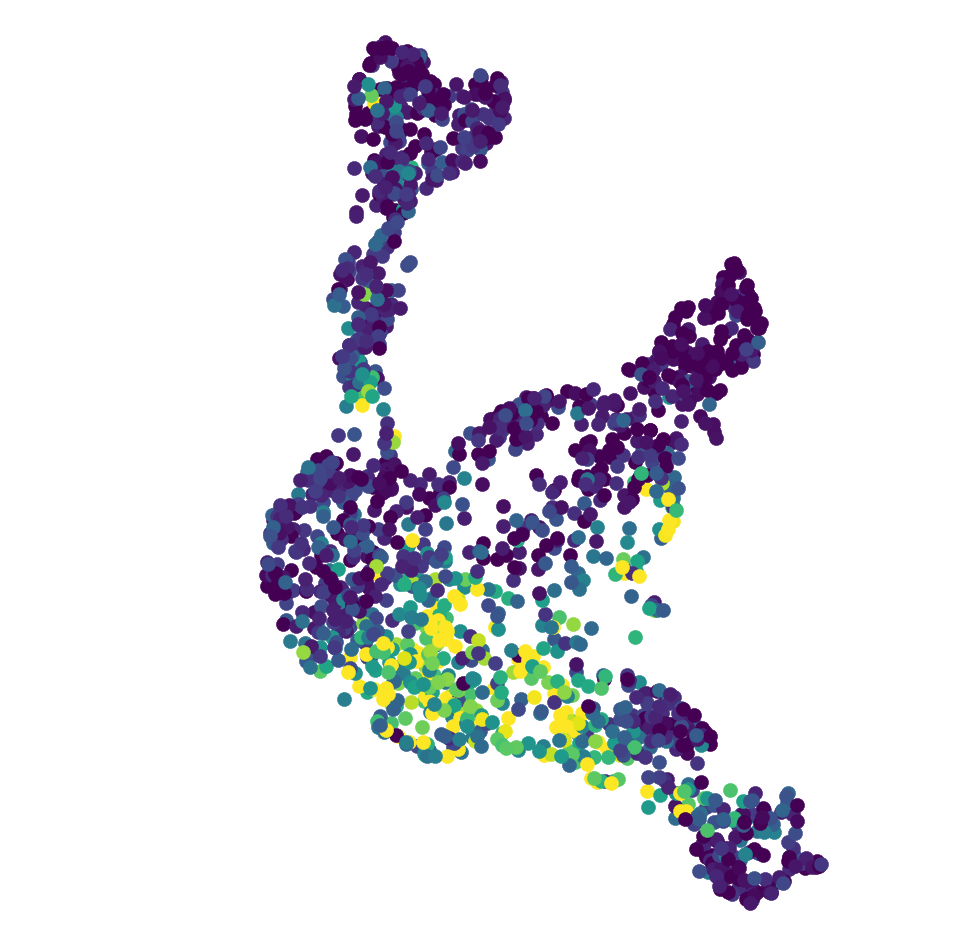

In [42]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
tsne = umap_ANA.loc[cells.index]
expr = seqN.loc['Id3', cells.index]
vmin = np.percentile(expr, 5)
vmax = np.percentile(expr, 95)
expr = (expr - vmin) / (vmax - vmin)
cmap = plt.cm.viridis
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 200,
                linewidth = 0.5,
                c = cmap(expr[ix]),
                edgecolor=cmap(expr[ix]), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig3_tSNE_Id3.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

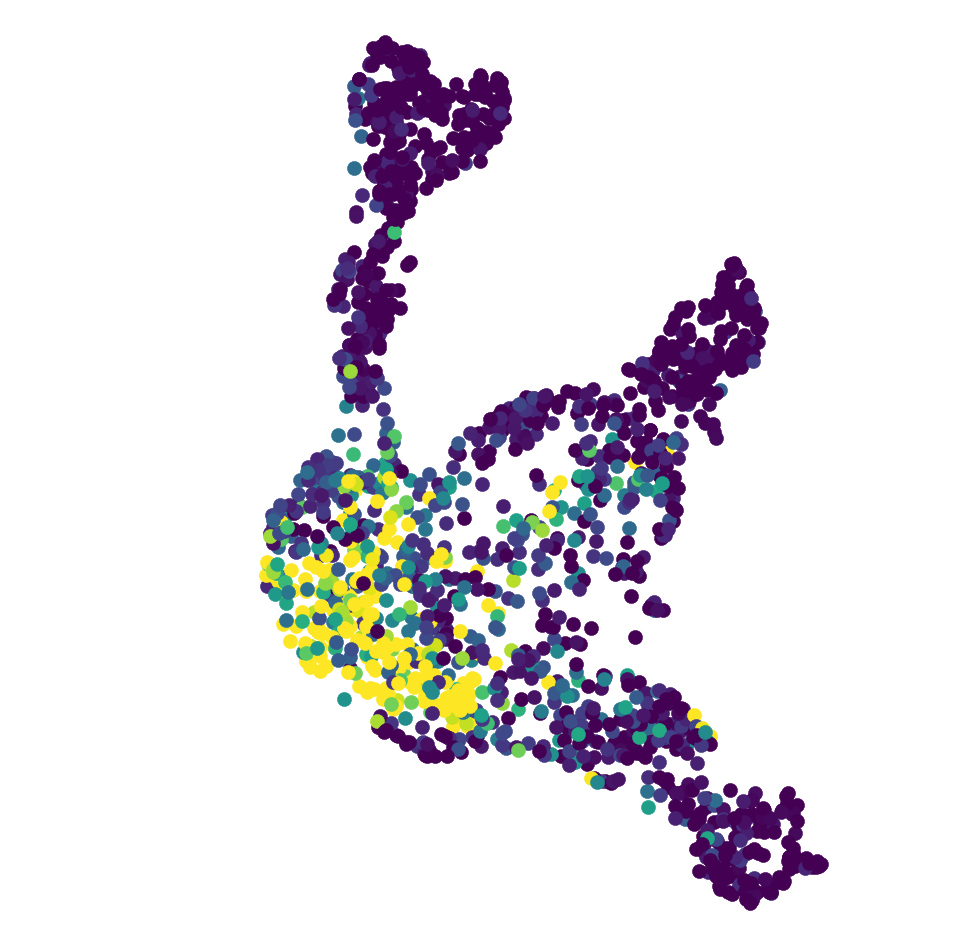

In [44]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
tsne = umap_ANA.loc[cells.index]
expr = seqN.loc['Dcn', cells.index]
vmin = np.percentile(expr, 10)
vmax = np.percentile(expr, 90)
expr = (expr - vmin) / (vmax - vmin)
cmap = plt.cm.viridis
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 200,
                linewidth = 0.5,
                c = cmap(expr[ix]),
                edgecolor=cmap(expr[ix]), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig3_tSNE_Dcn.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Expression of intermediate state markers

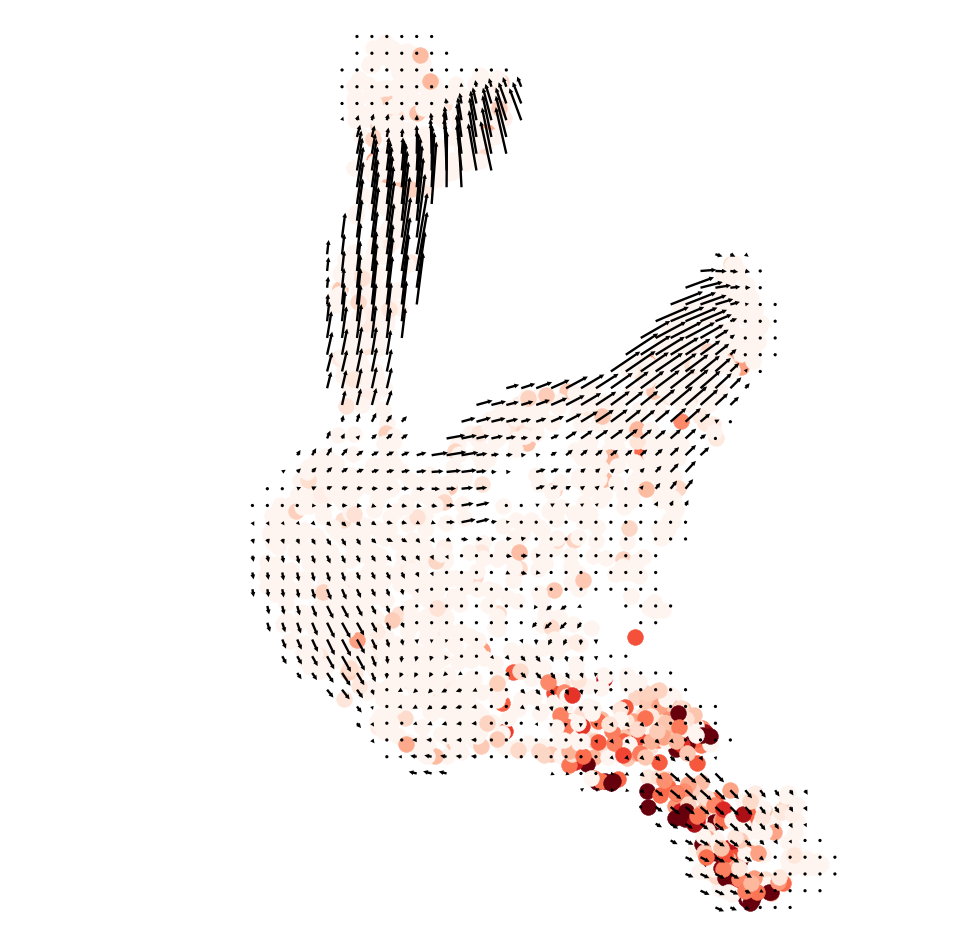

In [244]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
tsne = umap_ANA.loc[cells.index]
expr = seqN.loc['Ctsc']
vmin = 0
vmax = 5
expr = (expr - vmin) / (vmax - vmin)
cmap = plt.cm.Reds
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap(expr[ix]),
                edgecolor=cmap(expr[ix]), 
                marker = markers[time[ix]])
    
vlm_ana2.calculate_grid_arrows(smooth=1.0, steps=(40, 55), n_neighbors=100)
vlm_ana2.plot_grid_arrows(scatter_kwargs_dict={"alpha":0, "lw":0.0, "edgecolor":"0", "s":100, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = False,
                     headaxislength=2, headlength=2, headwidth=2, quiver_scale=0.5, width = 0.0025)

clean_axis(ax1)

figname = 'v1.5_Fig4_tSNE_vlm_Ctsc.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

"\nfigname = 'v1.5_Fig4_tSNE_vlm_Selenbp1.pdf'\nplt.savefig('%s/%s' % (path_figures, figname), \n            format = 'pdf', \n            transparent = True, \n            bbox_inches = 'tight', \n            pad_inches = 0, \n            rasterized = True)\n"

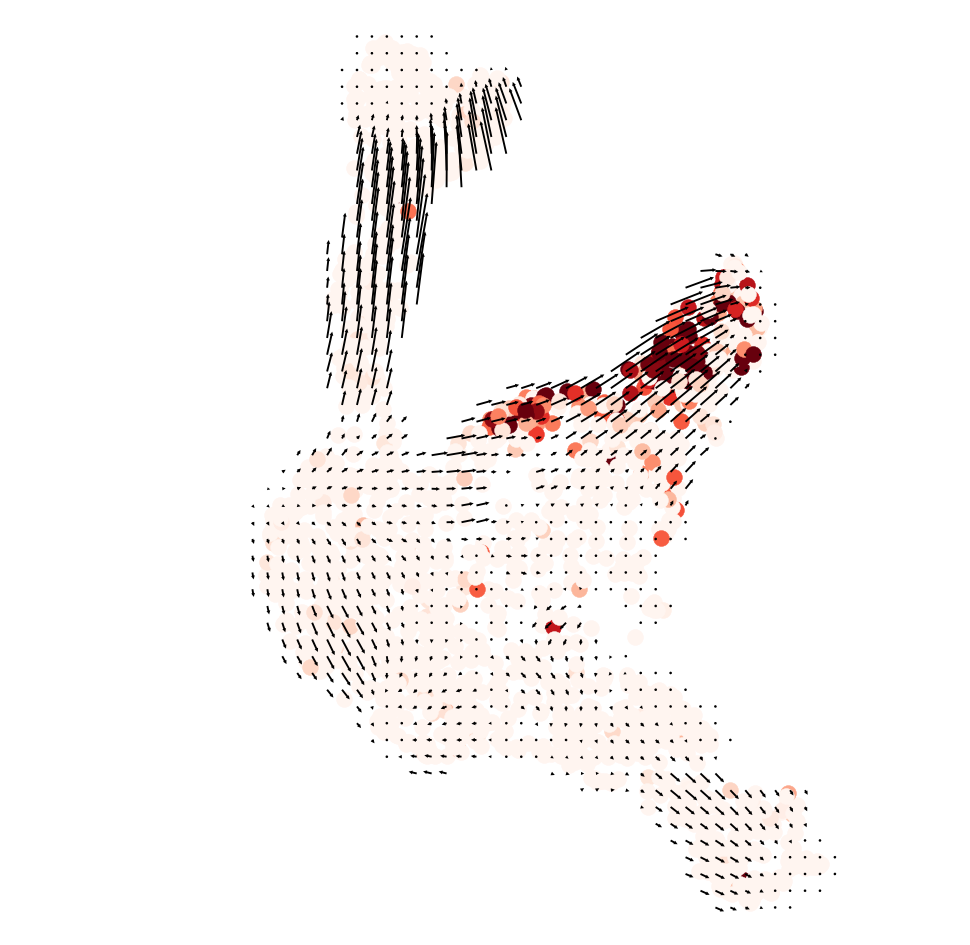

In [232]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
tsne = umap_ANA.loc[cells.index]
expr = seqN.loc['Selenbp1']
vmin = 0
vmax = 5
expr = (expr - vmin) / (vmax - vmin)
cmap = plt.cm.Reds
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap(expr[ix]),
                edgecolor=cmap(expr[ix]), 
                marker = markers[time[ix]])
    
vlm_ana2.calculate_grid_arrows(smooth=1.0, steps=(40, 55), n_neighbors=100)
vlm_ana2.plot_grid_arrows(scatter_kwargs_dict={"alpha":0, "lw":0.0, "edgecolor":"0", "s":100, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = False,
                     headaxislength=2, headlength=2, headwidth=2, quiver_scale=0.5, width = 0.002)

clean_axis(ax1)
"""
figname = 'v1.5_Fig4_tSNE_vlm_Selenbp1.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)
"""

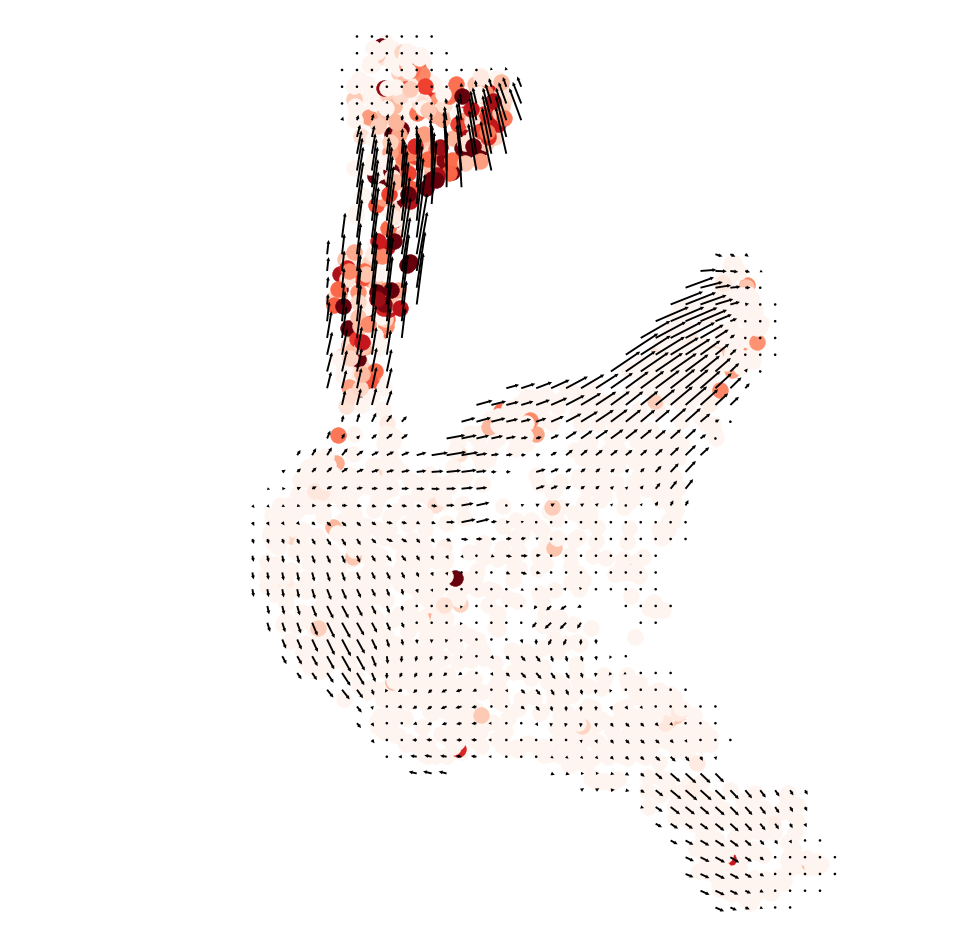

In [228]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
tsne = umap_ANA.loc[cells.index]
expr = seqN.loc['Aldh1a3']
vmin = 0
vmax = 5
expr = (expr - vmin) / (vmax - vmin)
cmap = plt.cm.Reds
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap(expr[ix]),
                edgecolor=cmap(expr[ix]), 
                marker = markers[time[ix]])
    
vlm_ana2.calculate_grid_arrows(smooth=1.0, steps=(40, 55), n_neighbors=100)
vlm_ana2.plot_grid_arrows(scatter_kwargs_dict={"alpha":0, "lw":0.0, "edgecolor":"0", "s":100, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = False,
                     headaxislength=2, headlength=2, headwidth=2, quiver_scale=0.5, width = 0.002)

clean_axis(ax1)

figname = 'v1.5_Fig4_tSNE_vlm_Aldh1a3.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Expression of intermediate state signatures (cumulative)

## IRS

In [205]:
cl_g_PT_IRS = loadData_v1(path_output, exp_id, 'cl_g_PT_IRS', 'Series')

In [214]:
genes_int_IRS = cl_g_PT_IRS[cl_g_PT_IRS.isin([4])].index

In [215]:
len(genes_int_IRS)

45

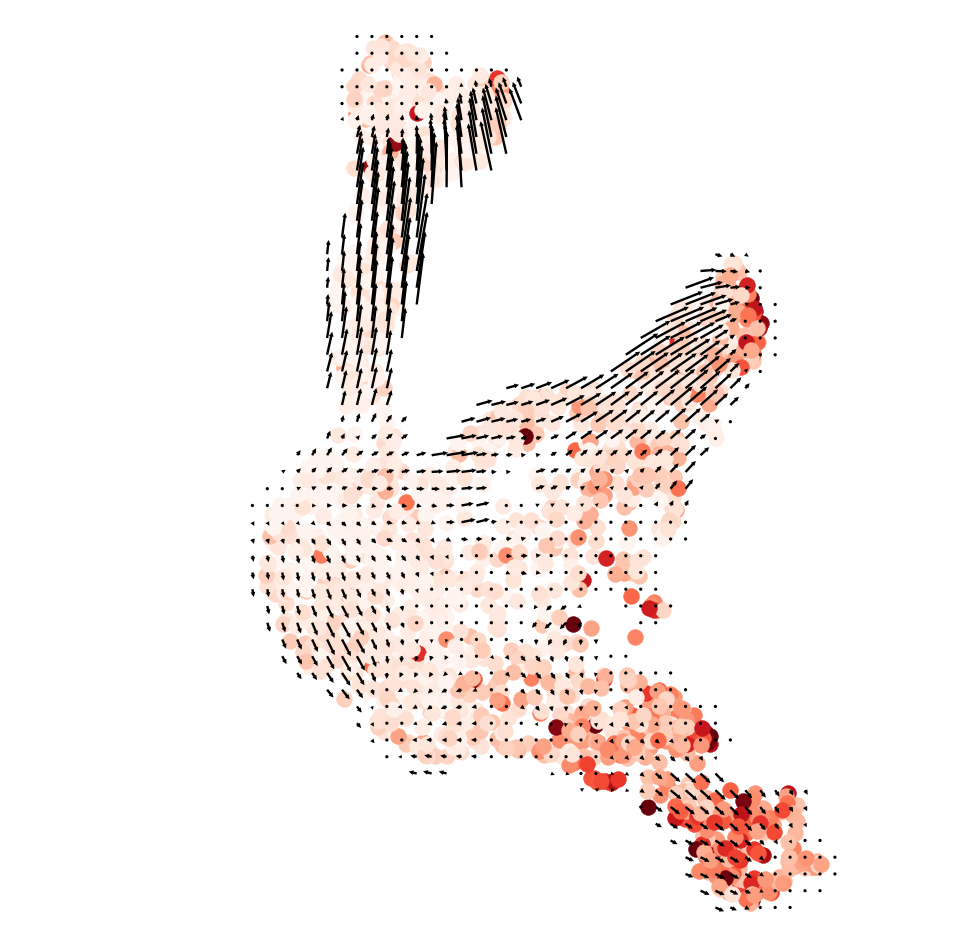

In [216]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
tsne = umap_ANA.loc[cells.index]
expr = seqN.loc[genes_int_IRS].sum()
vmin = np.percentile(expr, 5)
vmax = np.percentile(expr, 95)
expr = (expr - vmin) / (vmax - vmin)
cmap = plt.cm.Reds
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap(expr[ix]),
                edgecolor=cmap(expr[ix]), 
                marker = markers[time[ix]])
    
vlm_ana2.calculate_grid_arrows(smooth=1.0, steps=(40, 55), n_neighbors=100)
vlm_ana2.plot_grid_arrows(scatter_kwargs_dict={"alpha":0, "lw":0.0, "edgecolor":"0", "s":100, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = False,
                     headaxislength=2, headlength=2, headwidth=2, quiver_scale=0.5, width = 0.0025)

clean_axis(ax1)

## Cortex

In [196]:
cl_g_PT_CX = loadData_v1(path_output, exp_id, 'cl_g_PT_CX', 'Series')

In [197]:
genes_int_CX = cl_g_PT_CX[cl_g_PT_CX.isin([2])].index

In [198]:
len(genes_int_CX)

57

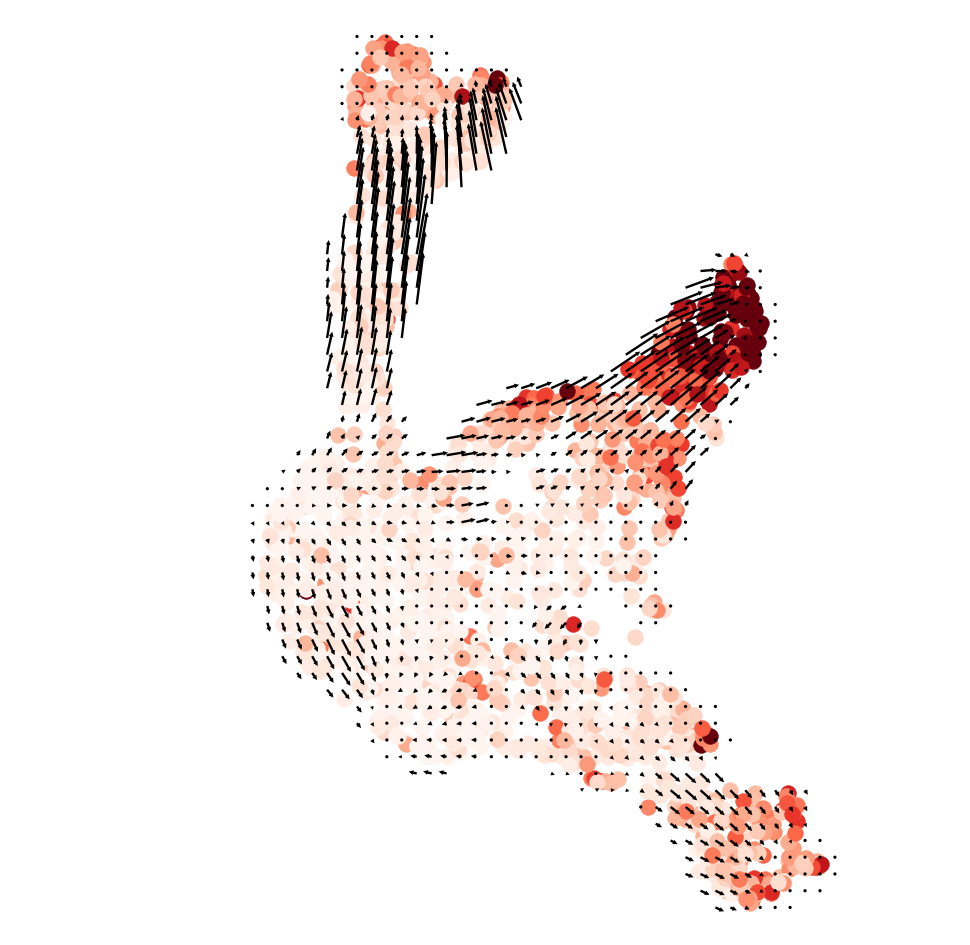

In [199]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
tsne = umap_ANA.loc[cells.index]
expr = seqN.loc[genes_int_CX].sum()
vmin = np.percentile(expr, 5)
vmax = np.percentile(expr, 95)
expr = (expr - vmin) / (vmax - vmin)
cmap = plt.cm.Reds
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap(expr[ix]),
                edgecolor=cmap(expr[ix]), 
                marker = markers[time[ix]])
    
vlm_ana2.calculate_grid_arrows(smooth=1.0, steps=(40, 55), n_neighbors=100)
vlm_ana2.plot_grid_arrows(scatter_kwargs_dict={"alpha":0, "lw":0.0, "edgecolor":"0", "s":100, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = False,
                     headaxislength=2, headlength=2, headwidth=2, quiver_scale=0.5, width = 0.0025)

clean_axis(ax1)

## Medulla

In [171]:
cl_g_PT_CL = loadData_v1(path_output, exp_id, 'cl_g_PT_CL', 'Series')

In [177]:
genes_int_MED = cl_g_PT_CL[cl_g_PT_CL.isin([0])].index

In [178]:
len(genes_int_MED)

39

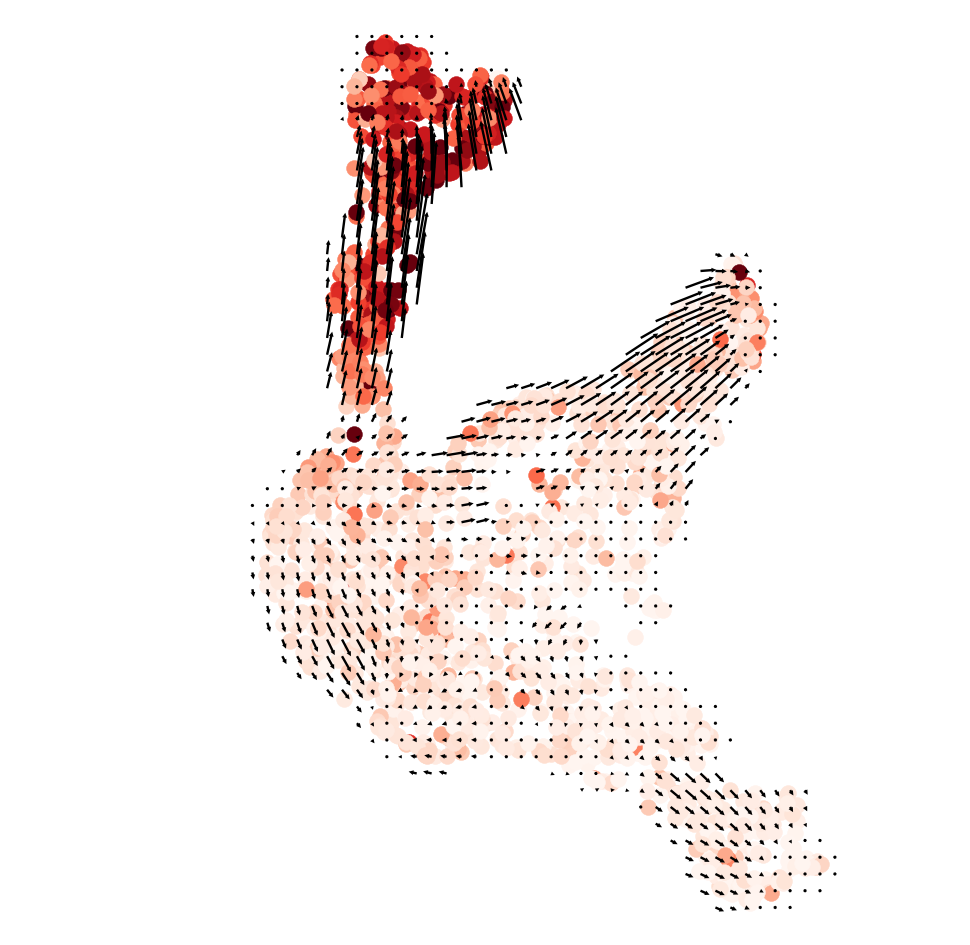

In [200]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
tsne = umap_ANA.loc[cells.index]
expr = seqN.loc[genes_int_MED].sum()
vmin = np.percentile(expr, 5)
vmax = np.percentile(expr, 95)
expr = (expr - vmin) / (vmax - vmin)
cmap = plt.cm.Reds
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap(expr[ix]),
                edgecolor=cmap(expr[ix]), 
                marker = markers[time[ix]])
    
vlm_ana2.calculate_grid_arrows(smooth=1.0, steps=(40, 55), n_neighbors=100)
vlm_ana2.plot_grid_arrows(scatter_kwargs_dict={"alpha":0, "lw":0.0, "edgecolor":"0", "s":100, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = False,
                     headaxislength=2, headlength=2, headwidth=2, quiver_scale=0.5, width = 0.0025)

clean_axis(ax1)

In [ ]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
tsne = umap_ANA.loc[cells.index]
expr = seqN.loc[genes_int_MED].mean()
vmin = np.percentile(expr, 5)
vmax = np.percentile(expr, 95)
expr = (expr - vmin) / (vmax - vmin)
cmap = plt.cm.Reds
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap(expr[ix]),
                edgecolor=cmap(expr[ix]), 
                marker = markers[time[ix]])
    
vlm_ana2.calculate_grid_arrows(smooth=1.0, steps=(40, 55), n_neighbors=100)
vlm_ana2.plot_grid_arrows(scatter_kwargs_dict={"alpha":0, "lw":0.0, "edgecolor":"0", "s":100, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = False,
                     headaxislength=2, headlength=2, headwidth=2, quiver_scale=0.5, width = 0.0025)

clean_axis(ax1)

# Proliferation

In [69]:
Counter(data)

Counter({'G2M': 446, 'S': 440, 'G1': 753})

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:44: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


NameError: name 'vlm_ana2' is not defined

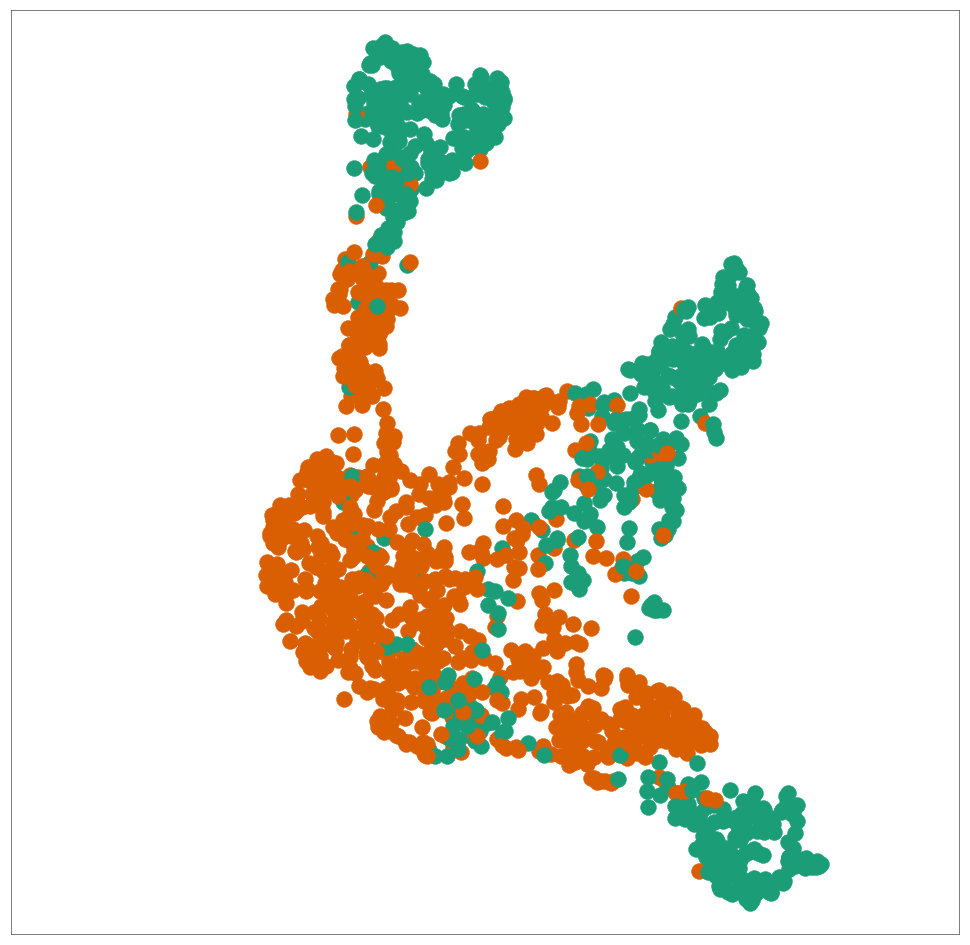

In [67]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
data = cc_score_v2.loc[cells.index]
tsne = umap_ANA.ix[cells.index]
cmap = {'G1':'#1b9e77','G2M':'#d95f02','S':'#d95f02'}
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap[data[ix]],
                edgecolor=cmap[data[ix]], 
                marker = markers[time[ix]])
    
vlm_ana2.calculate_grid_arrows(smooth=1.0, steps=(40, 55), n_neighbors=100)
vlm_ana2.plot_grid_arrows(scatter_kwargs_dict={"alpha":0, "lw":0.0, "edgecolor":"0", "s":100, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = False,
                     headaxislength=2, headlength=2, headwidth=2, quiver_scale=0.5, width = 0.0025)

clean_axis(ax1)
"""
figname = 'v1.5_Fig3_ANA_CC_vlm.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)
"""

# Cumulated integrin expression

In [333]:
itg_all = ['Itga1','Itga2','Itga2b','Itga3','Itga4','Itga5','Itga6','Itga7','Itga8','Itga9','Itga10','Itga11',
           'Itgad','Itgae','Itgal','Itgam','Itgav','Itgax',
           'Itgb1','Itgb2', 'Itgb3','Itgb4','Itgb5','Itgb6','Itgb7','Itgb8','Itgb2l','Itgbl1',]

In [334]:
itga = ['Itga1','Itga2','Itga2b','Itga3','Itga4','Itga5','Itga6','Itga7','Itga8','Itga9','Itga10','Itga11',
           'Itgad','Itgae','Itgal','Itgam','Itgav','Itgax']

In [335]:
itgb = ['Itgb1','Itgb2', 'Itgb3','Itgb4','Itgb5','Itgb6','Itgb7','Itgb8','Itgb2l','Itgbl1',]

In [336]:
seq_itg = pd.DataFrame(index = ['itg_all','itga','itgb'], columns = cl_c_ANA.index)

seq_itg.loc['itg_all'] = seqN.loc[itg_all, cl_c_ANA.index].sum(axis=0)
seq_itg.loc['itga'] = seqN.loc[itga, cl_c_ANA.index].sum(axis=0)
seq_itg.loc['itgb'] = seqN.loc[itgb, cl_c_ANA.index].sum(axis=0)

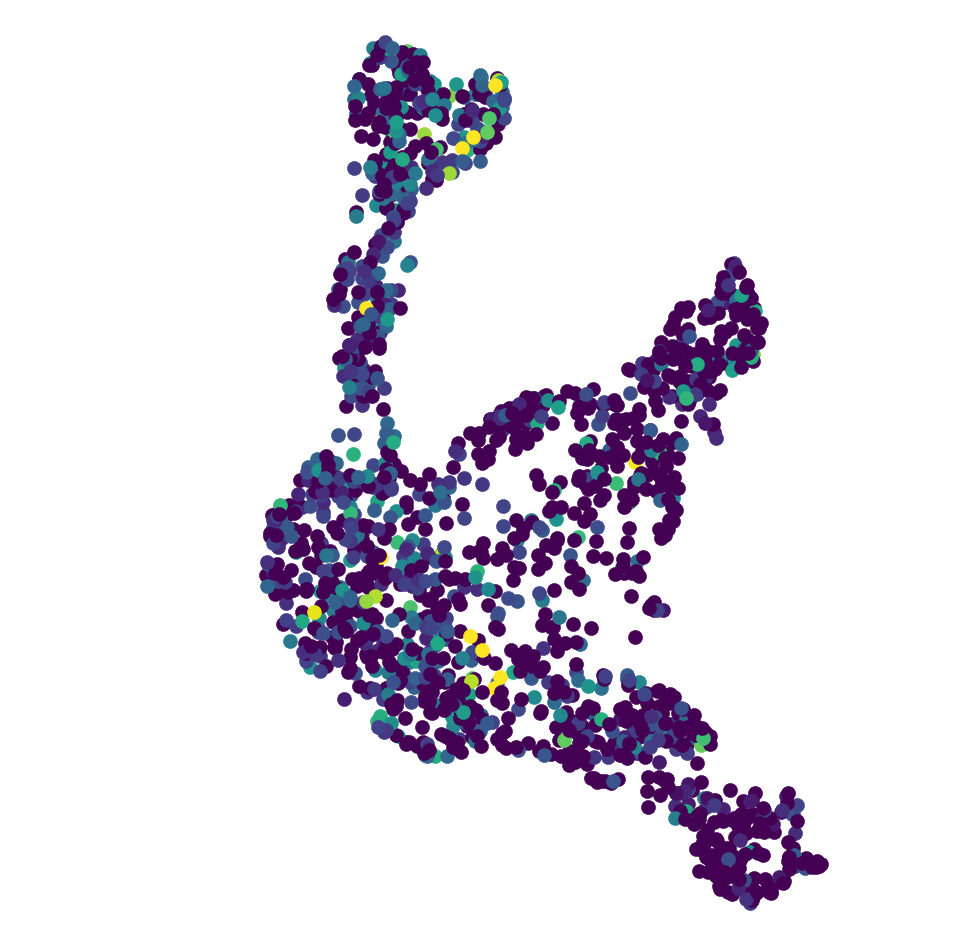

In [341]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
tsne = umap_ANA.loc[cells.index]
expr = seq_itg.loc['itg_all',cells.index]
vmin = 0
vmax = 3
expr = (expr - vmin) / (vmax - vmin)
cmap = plt.cm.viridis
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 200,
                linewidth = 0.5,
                c = cmap(expr[ix]),
                edgecolor=cmap(expr[ix]), 
                marker = markers[time[ix]])

clean_axis(ax1)

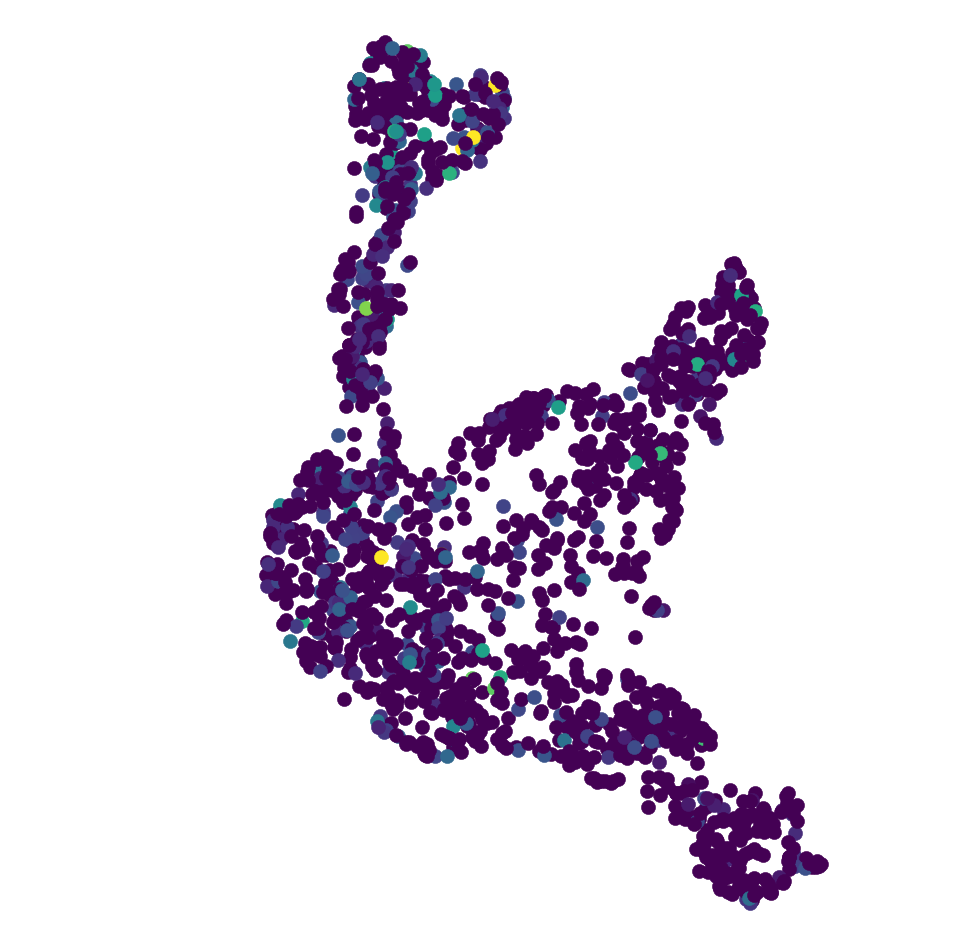

In [342]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
tsne = umap_ANA.loc[cells.index]
expr = seq_itg.loc['itga',cells.index]
vmin = 0
vmax = 3
expr = (expr - vmin) / (vmax - vmin)
cmap = plt.cm.viridis
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 200,
                linewidth = 0.5,
                c = cmap(expr[ix]),
                edgecolor=cmap(expr[ix]), 
                marker = markers[time[ix]])

clean_axis(ax1)

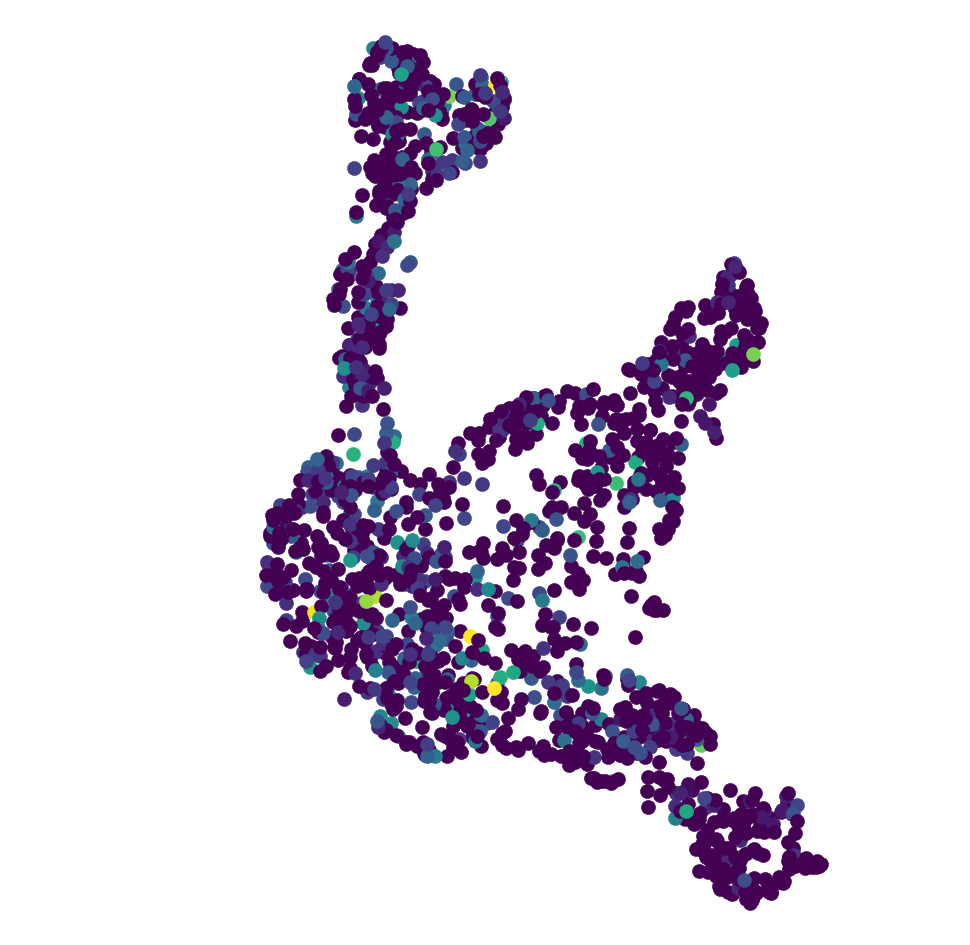

In [343]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
tsne = umap_ANA.loc[cells.index]
expr = seq_itg.loc['itgb',cells.index]
vmin = 0
vmax = 3
expr = (expr - vmin) / (vmax - vmin)
cmap = plt.cm.viridis
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

index = list(tsne.index)
np.random.shuffle(index)

for ix in index:

    ax1.scatter(tsne.loc[ix,'x'],
                tsne.loc[ix,'y'], 
                s = 200,
                linewidth = 0.5,
                c = cmap(expr[ix]),
                edgecolor=cmap(expr[ix]), 
                marker = markers[time[ix]])

clean_axis(ax1)

# Projection of Yang data on tSNE

In [32]:
tsne_nn = loadData_v1(path_output, exp_id, 'tsne_nn_ds', 'DataFrame')

In [33]:
Yang_meta = pd.read_csv('%s/P30_Anagen_basal_matrix_filtered_metadata.csv' % path_input, index_col = 0)

In [34]:
cl_Yang_1st = Yang_meta['1st_level_cluster_identity'].copy()

In [35]:
cl_Yang_2nd = Yang_meta['1st_level_cluster_identity'].copy()
for i in Yang_meta.index:
     if Yang_meta.loc[i,'2nd_level_cluster_identity'] != 'na':
            cl_Yang_2nd.loc[i] = Yang_meta.loc[i,'2nd_level_cluster_identity']

In [36]:
cmap_Yang_1st = {'C1':'#ff7f00',
                 'C2':'#4daf4a',
                 'C3':'#e41a1c',
                 'C4':'#7570b3',
                 'C5':'#377eb8'}

In [37]:
cmap_Yang_2nd = {'C1':'#ff7f00',
                 'C2-a':'#984ea3',
                 'C2-b':'#386cb0',
                 'C2-c':'dodgerblue',
                 'C2-d':'#66a61e',
                 'C2-e':'#ffff33',
                 'C2-f':'#ff7f00',
                 'C3-a':'#e41a1c',
                 'C3-b':'#a65628',
                 'C4':'#984ea3',
                 'C5':'#377eb8'}

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:43: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:44: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:53: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:54: DeprecationWar

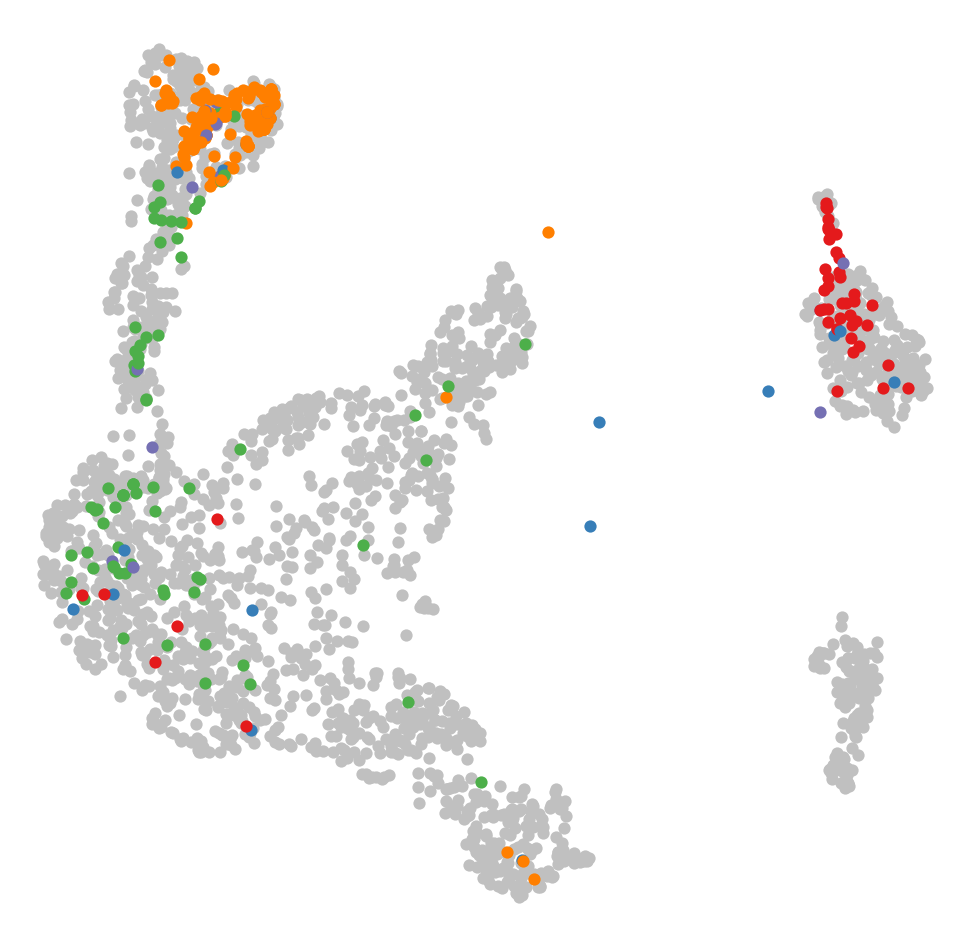

In [38]:
tsne1 = umap_ANA
tsne2 = tsne_nn
cells = cl_c_ANA
clusters = cl_Yang_1st
cmap = cmap_Yang_1st

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne1['x']), np.max(tsne1['x'])
y_min, y_max = np.min(tsne1['y']), np.max(tsne1['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne1.index:

    ax1.scatter(tsne1.ix[ix,'x'],
                tsne1.ix[ix,'y'], 
                s = 150,
                linewidth = 0.0,
                c = 'silver',
                edgecolor='black', 
                marker = 'o')
    
for ix in tsne2.index:

    ax1.scatter(tsne2.ix[ix,'x'],
                tsne2.ix[ix,'y'], 
                s = 150,
                linewidth = 0.0,
                c = cmap[clusters[ix]],
                edgecolor='black', 
                marker = 'o')

clean_axis(ax1)

figname = 'v1.5_FigS4_umap_ANA_Yang_1st_ds.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

In [39]:
c_sel = cl_Yang_1st[cl_Yang_1st.isin(['C2','C3'])].index

In [40]:
len(c_sel)

157

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:43: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:44: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
/Users/simjoo/anaconda/lib/python3.6/site-packa

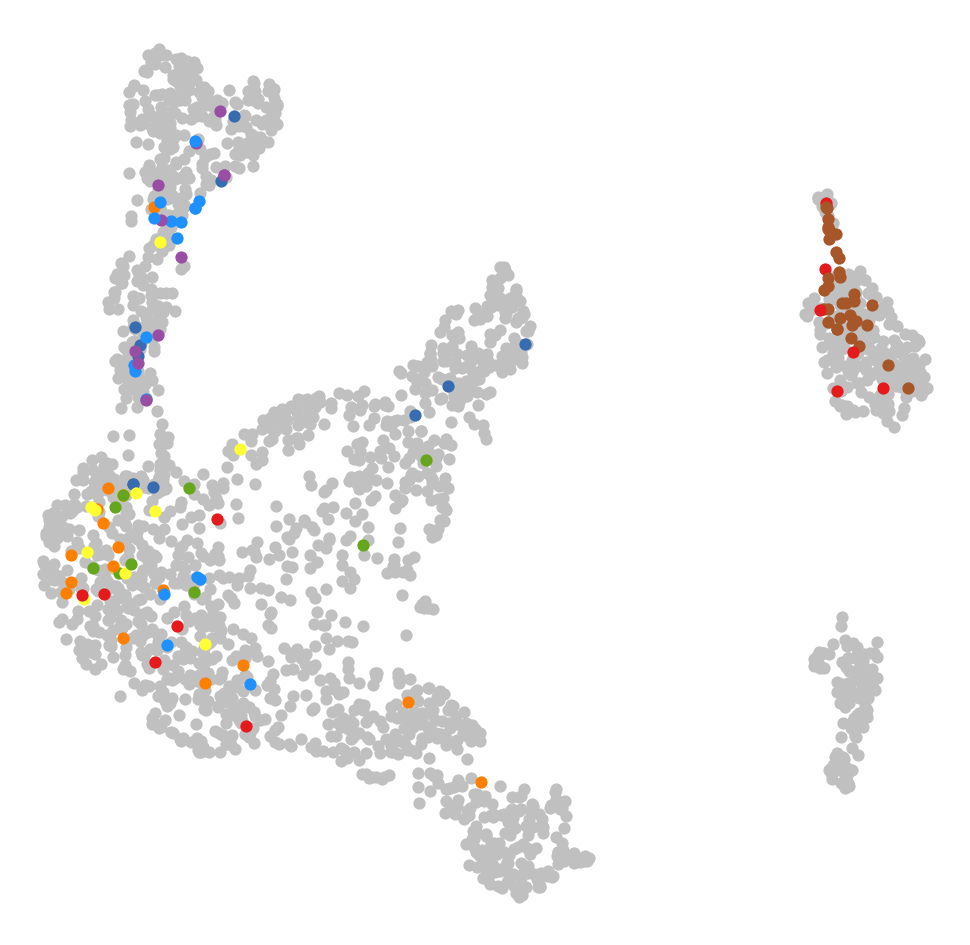

In [41]:
tsne1 = umap_ANA
tsne2 = tsne_nn.loc[c_sel]
cells = cl_c_ANA
clusters = cl_Yang_2nd
cmap = cmap_Yang_2nd

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne1['x']), np.max(tsne1['x'])
y_min, y_max = np.min(tsne1['y']), np.max(tsne1['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne1.index:

    ax1.scatter(tsne1.ix[ix,'x'],
                tsne1.ix[ix,'y'], 
                s = 150,
                linewidth = 0.0,
                c = 'silver',
                edgecolor='black', 
                marker = 'o')
    
for ix in tsne2.index:

    ax1.scatter(tsne2.ix[ix,'x'],
                tsne2.ix[ix,'y'], 
                s = 150,
                linewidth = 0.0,
                c = cmap[clusters[ix]],
                edgecolor='black', 
                marker = 'o')

clean_axis(ax1)

figname = 'v1.5_FigS4_umap_ANA_Yang_2nd_ds.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# FateID (run in R)

## Save count matrix (matrix cells with features selected previously)

In [174]:
seq_sel_ANA = loadData_v1(path_output, exp_id, 'seq_sel_ANA', 'DataFrame')

In [178]:
# save matrix count data

saveData_v1(seq_sel_ANA[cl_c_matrix.index], path_output, exp_id, 'df_ANA')

## Save "clustering" data (endpoint clusters based on RNA velocity markov model)

In [57]:
cl_c_matrix = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]

In [58]:
cl_endpoints = pd.Series(0, index = cl_c_matrix.index)

In [187]:
diffused_fwd = loadData_v1(path_output, exp_id, 'diffused_fwd', 'Series')

In [189]:
# define cells with prob > 90 percentile in forward MM

c_sel_MM =  diffused_fwd[diffused_fwd>=1].index

In [190]:
len(c_sel_MM)

75

In [191]:
#define branch specific cells

#c_sel_IRS = cl_c_ANA[cl_c_ANA.isin(['ANA - 18','ANA - 8', 'ANA - 9'])].index
#c_sel_CX = cl_c_ANA[cl_c_ANA.isin(['ANA - 14','ANA - 6', 'ANA - 7', 'ANA - 10', 'ANA - 11'])].index
#c_sel_MED = cl_c_ANA[cl_c_ANA.isin(['ANA - 17','ANA - 5', 'ANA - 4'])].index

In [192]:
#cl_endpoints[set(c_sel_MM) & set(c_sel_IRS)] = 1
#cl_endpoints[set(c_sel_MM) & set(c_sel_CX)] = 2
#cl_endpoints[set(c_sel_MM) & set(c_sel_MED)] = 3

In [56]:
#define branch specific cells

c_sel_IRS = cl_c_ANA[cl_c_ANA.isin(['ANA - 8', 'ANA - 9'])].index
c_sel_CX = cl_c_ANA[cl_c_ANA.isin(['ANA - 10', 'ANA - 11'])].index
c_sel_MED = cl_c_ANA[cl_c_ANA.isin(['ANA - 5', 'ANA - 4'])].index

In [59]:
cl_endpoints[c_sel_IRS] = 1
cl_endpoints[c_sel_CX] = 2
cl_endpoints[c_sel_MED] = 3

In [60]:
Counter(cl_endpoints)

Counter({0: 1123, 3: 253, 2: 116, 1: 147})

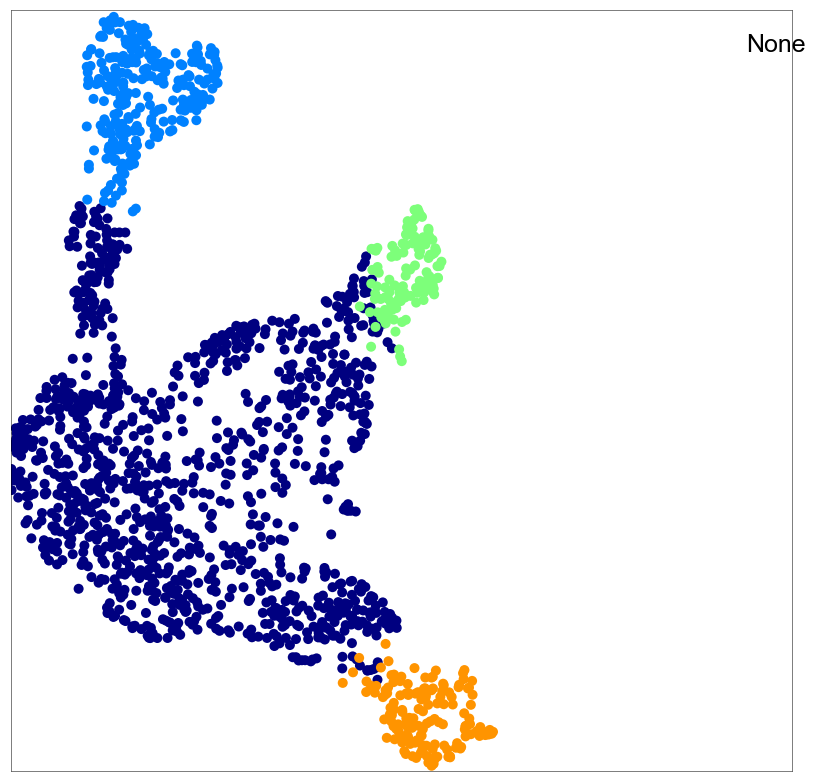

In [61]:
draw_tSNE(umap_ANA, cl_endpoints)

In [62]:
# save matrix clustering data

saveData_v1(cl_endpoints, path_output, exp_id, 'cl_endpoints')

# Plot fate bias

In [63]:
fbprob = loadData_v1(path_output, exp_id, 'fbprob','DataFrame')

In [64]:
fbprob.index = [i.replace('.','-') for i in fbprob.index]

### IRS

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:46: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


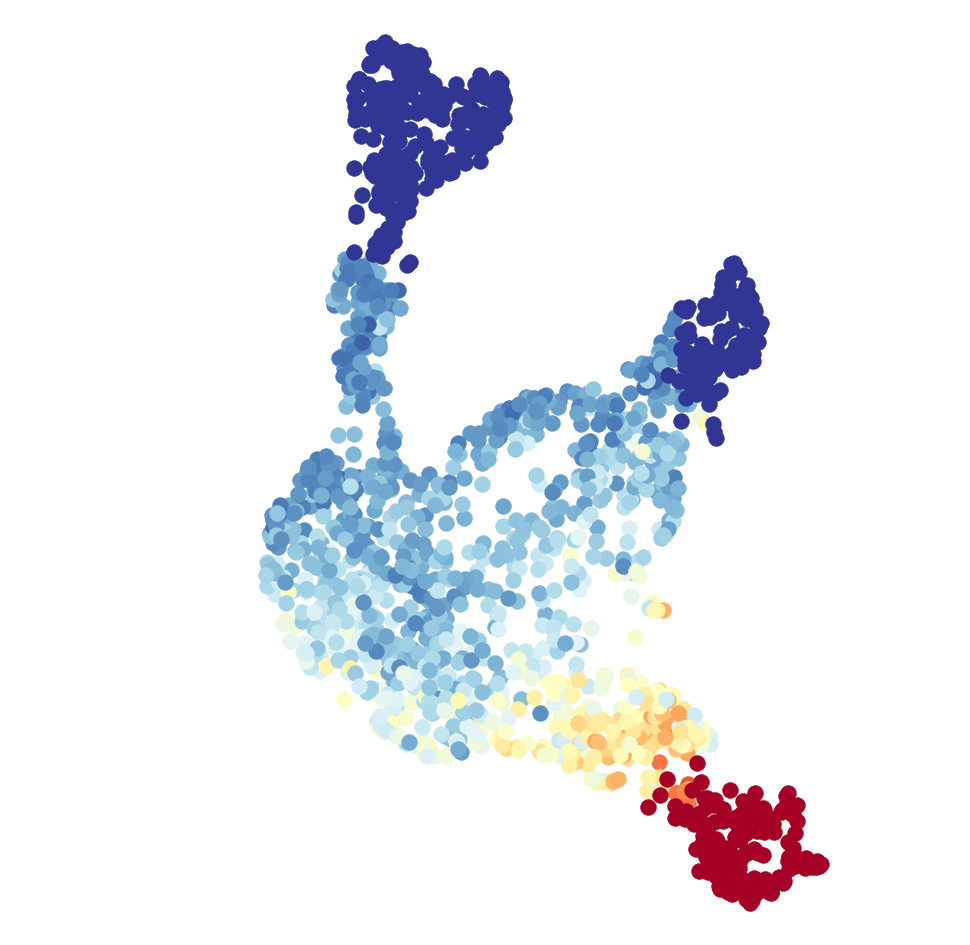

In [164]:
data = fbprob['t1']

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.RdYlBu_r
time = cells_stage
markers = markers_time
vmin = 0.0
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_FateID_IRS.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:46: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


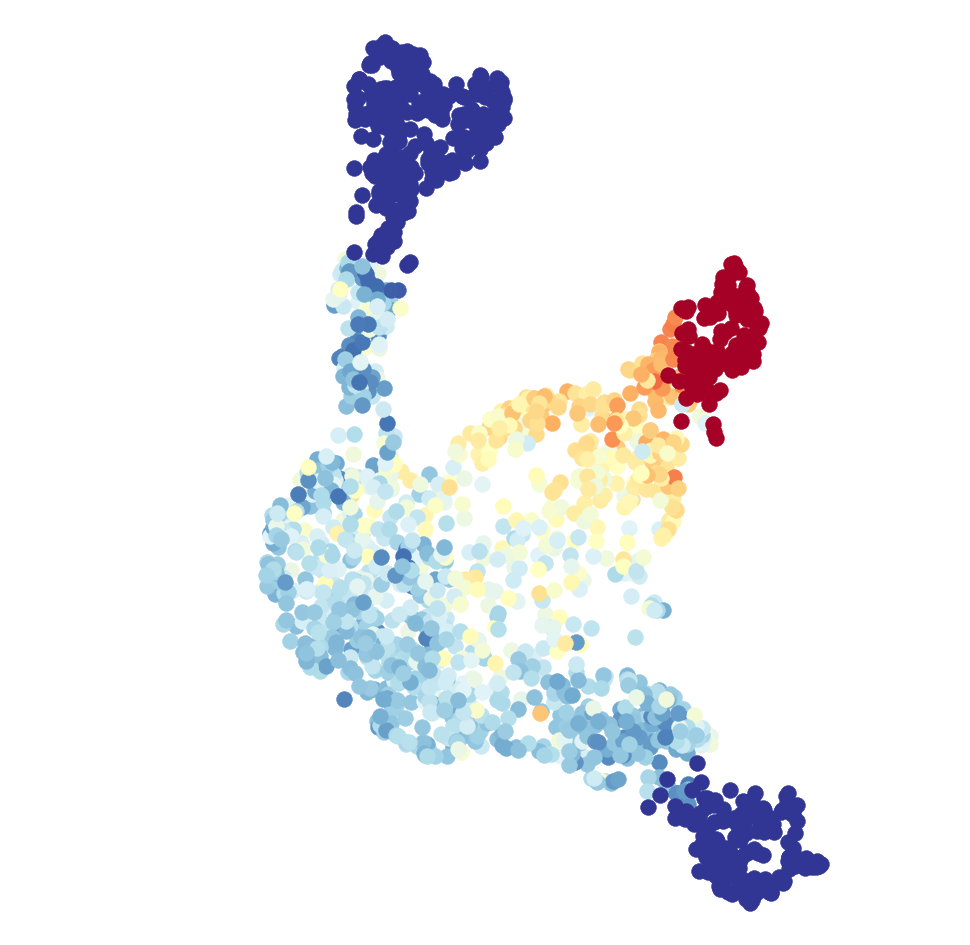

In [165]:
data = fbprob['t2']

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.RdYlBu_r
time = cells_stage
markers = markers_time
vmin = 0.0
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_FateID_CX.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:46: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


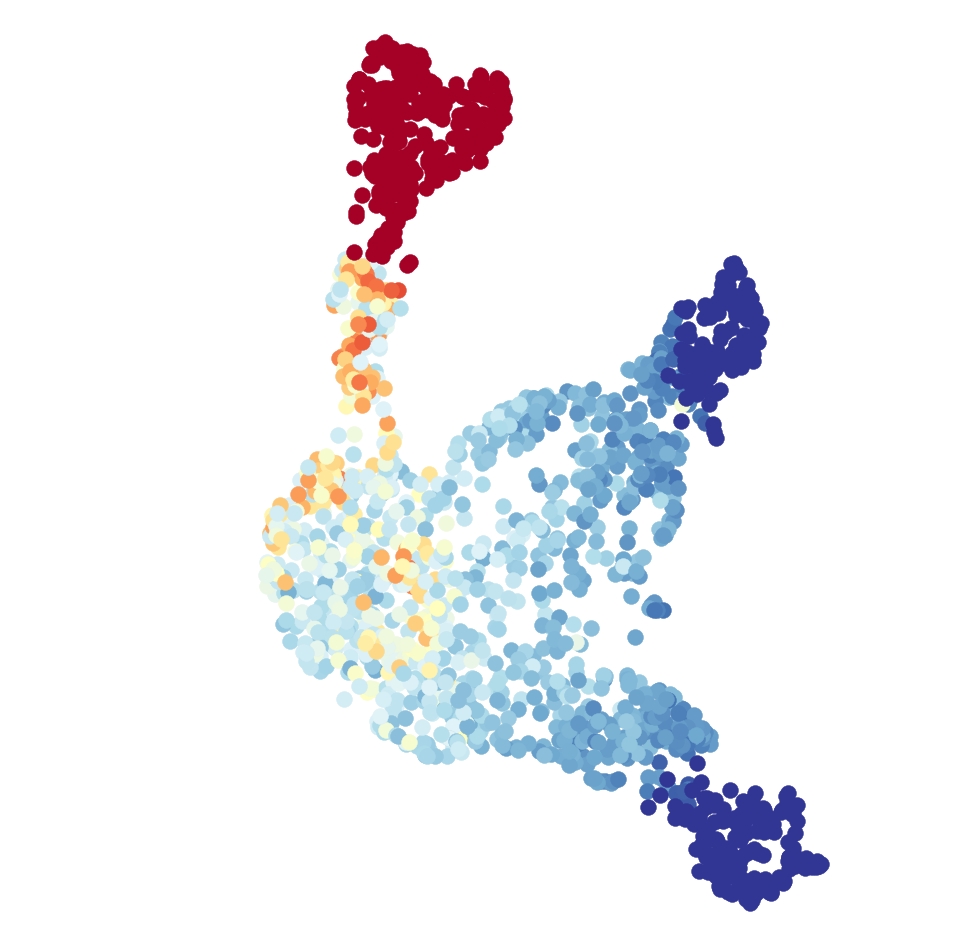

In [166]:
data = fbprob['t3']

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.RdYlBu_r
time = cells_stage
markers = markers_time
vmin = 0.0
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_FateID_MED.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

## Entropy

In [75]:
fbprob_ent = pd.Series(index = fbprob.index)

for i in fbprob.index:
    fbprob_ent[i] = scipy.stats.entropy(fbprob.loc[i])

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:46: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


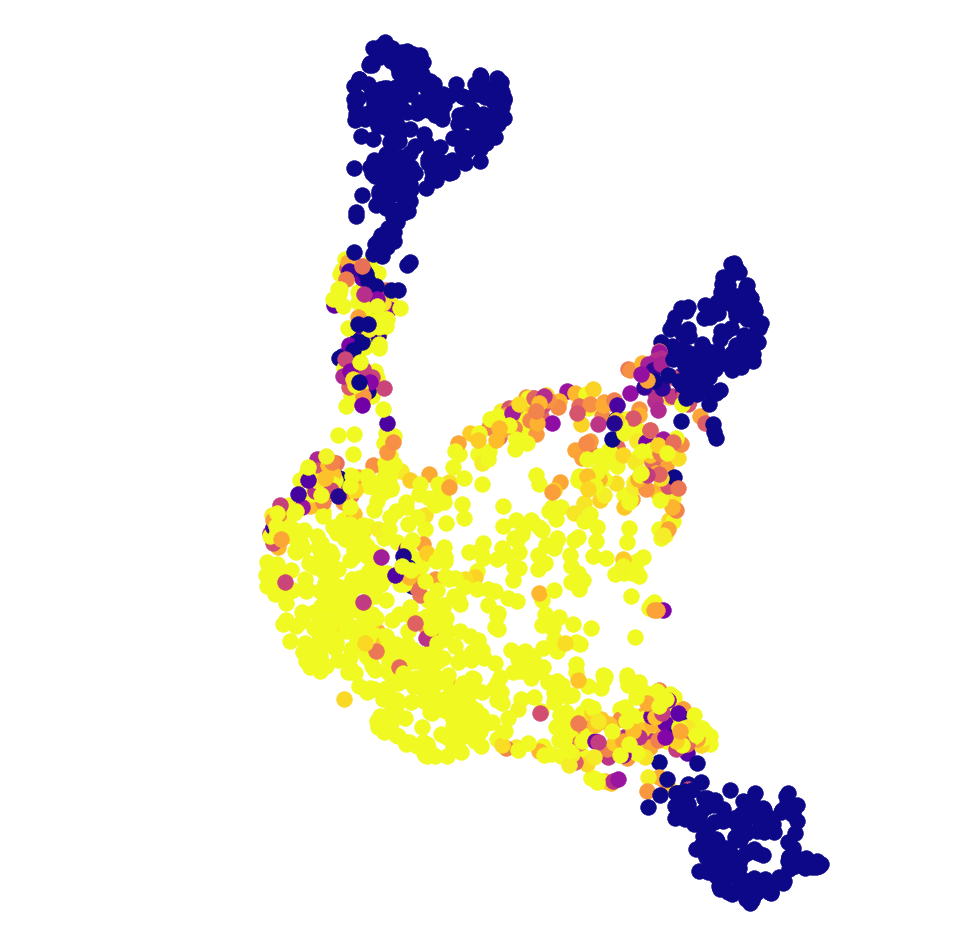

In [81]:
data = fbprob_ent

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.plasma
time = cells_stage
markers = markers_time
vmin = 0.75
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)), 
                marker = markers[time[ix]])

clean_axis(ax1)

# Violin plot

In [32]:
#combine anagen 2nd level clustering with IRS subclustering

cl_c_ANA_ = cl_c_ANA.copy()

for c in cl_c_ANA_IRS.index:
    cl_c_ANA_[c] = cl_c_ANA_IRS[c]    

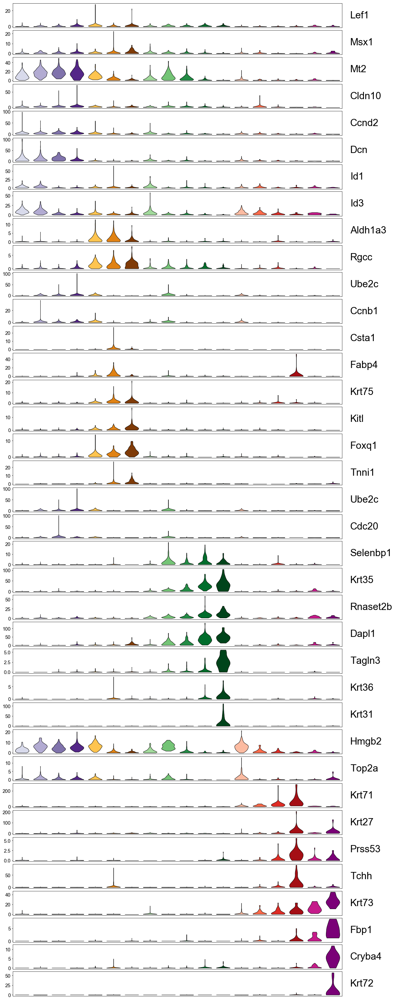

In [61]:
data = seqN
cells = cl_c_ANA_
groups = ['ANA - 12','ANA - 15', 'ANA - 13', 'ANA - 16','ANA - 17','ANA - 5','ANA - 4','ANA - 14','ANA - 6','ANA - 7',
          'ANA - 10','ANA - 11','ANA - 18','ANA - IRS - 3','ANA - IRS - 4','ANA - IRS - 1','ANA - IRS - 2','ANA - IRS - 0']
genes = ['Lef1','Msx1','Mt2','Cldn10','Ccnd2','Dcn','Id1','Id3',
         'Aldh1a3','Rgcc','Ube2c','Ccnb1','Csta1','Fabp4','Krt75','Kitl','Foxq1','Tnni1',
         'Ube2c','Cdc20','Selenbp1','Krt35','Rnaset2b','Dapl1','Tagln3','Krt36','Krt31',
         'Hmgb2','Top2a','Krt71','Krt27','Prss53','Tchh','Krt73','Fbp1','Cryba4','Krt72']
cmap = cmap_2nd

#create figure

width = 1 * len(groups) + 3
height = 1.5 * len(genes) + 3

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#specify grid

gs = plt.GridSpec(len(genes)+1, len(groups)+1, hspace = 0.1, wspace = 0,
                  width_ratios = [1] * len(groups) + [3], height_ratios = [1.5] * len(genes) + [3])

#iterate over genes

for i, g in enumerate(genes):
    
    #print gene name
    
    ax = plt.subplot(gs[i,-1])
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.text(0.15, 0.5, g, family = 'Arial', fontsize = 30, va = 'center', ha = 'left')
    clean_axis(ax)
    
    #print violin plots
    
    ax = plt.subplot(gs[i,:-1])
    ax.set_xlim(-0.5, len(groups) - 0.5)
    ax.set_xticks([])
    
    #iterate over groups
    
    for p, gr in enumerate(groups):
        c_gr = cells[cells==gr].index
        violin = ax.violinplot([data.loc[g, c_gr]],
                               positions = [p],
                               vert=True,
                               showextrema=False,
                               widths=0.75,)
        
        for v in violin['bodies']:
            v.set_edgecolor('black')
            v.set_facecolor(cmap[gr])
            v.set_linewidth(1)
            v.set_alpha(1.0)
        """    
        ax.scatter(p,
                   np.median(data.loc[g, c_gr]),
                   color = 'black', marker = 'o', s = 5, zorder = 2)
        """   
        for ix, t in enumerate(ax.yaxis.get_ticklabels()):
            t.set_family('Arial')
            t.set_fontsize(15)
            
figname = 'v1.5_ANA_violin.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

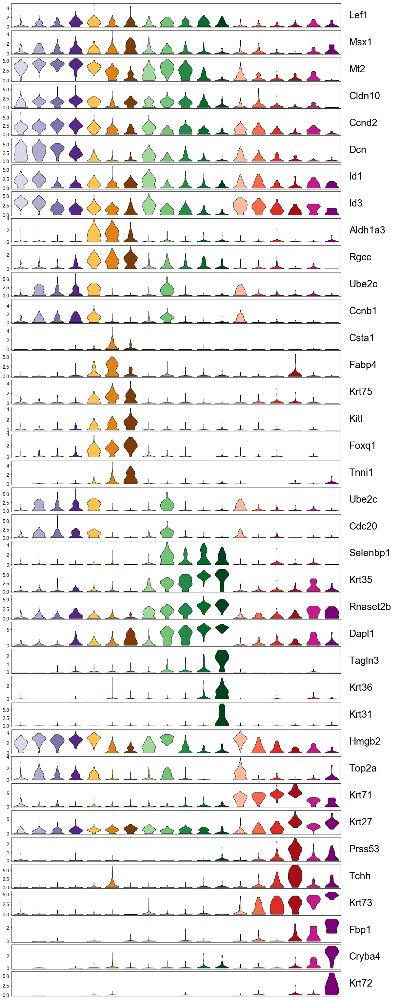

In [89]:
data = seqN
cells = cl_c_ANA_
groups = ['ANA - 12','ANA - 15', 'ANA - 13', 'ANA - 16','ANA - 17','ANA - 5','ANA - 4','ANA - 14','ANA - 6','ANA - 7',
          'ANA - 10','ANA - 11','ANA - 18','ANA - IRS - 3','ANA - IRS - 4','ANA - IRS - 1','ANA - IRS - 2','ANA - IRS - 0']
genes = ['Lef1','Msx1','Mt2','Cldn10','Ccnd2','Dcn','Id1','Id3',
         'Aldh1a3','Rgcc','Ube2c','Ccnb1','Csta1','Fabp4','Krt75','Kitl','Foxq1','Tnni1',
         'Ube2c','Cdc20','Selenbp1','Krt35','Rnaset2b','Dapl1','Tagln3','Krt36','Krt31',
         'Hmgb2','Top2a','Krt71','Krt27','Prss53','Tchh','Krt73','Fbp1','Cryba4','Krt72']
cmap = cmap_2nd

#create figure

width = 1 * len(groups) + 3
height = 1.5 * len(genes) + 3

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#specify grid

gs = plt.GridSpec(len(genes)+1, len(groups)+1, hspace = 0.1, wspace = 0,
                  width_ratios = [1] * len(groups) + [3], height_ratios = [1.5] * len(genes) + [3])

#iterate over genes

for i, g in enumerate(genes):
    
    #print gene name
    
    ax = plt.subplot(gs[i,-1])
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.text(0.15, 0.5, g, family = 'Arial', fontsize = 30, va = 'center', ha = 'left')
    clean_axis(ax)
    
    #print violin plots
    
    ax = plt.subplot(gs[i,:-1])
    ax.set_xlim(-0.5, len(groups) - 0.5)
    ax.set_xticks([])
    
    #iterate over groups
    
    for p, gr in enumerate(groups):
        c_gr = cells[cells==gr].index
        violin = ax.violinplot([np.log2(data.loc[g, c_gr]+1)],
                               positions = [p],
                               vert=True,
                               showextrema=False,
                               widths=0.75,)
        
        for v in violin['bodies']:
            v.set_edgecolor('black')
            v.set_facecolor(cmap[gr])
            v.set_linewidth(1)
            v.set_alpha(1.0)
        """    
        ax.scatter(p,
                   np.median(data.loc[g, c_gr]),
                   color = 'black', marker = 'o', s = 5, zorder = 2)
        """   
        for ix, t in enumerate(ax.yaxis.get_ticklabels()):
            t.set_family('Arial')
            t.set_fontsize(15)
            
figname = 'v1.5_ANA_violin_log2.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Violin plots - GL

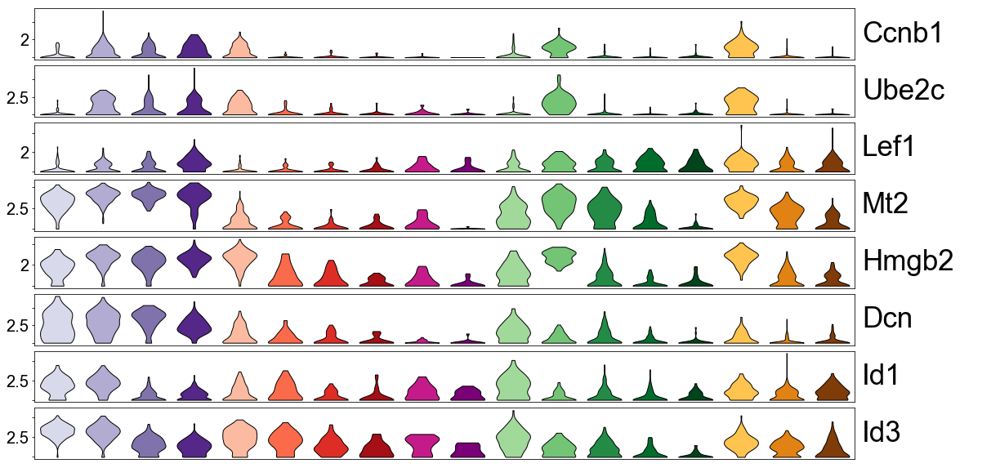

In [34]:
data = seqN
cells = cl_c_ANA_
groups = ['ANA - 12','ANA - 15', 'ANA - 13', 'ANA - 16',
          'ANA - 18','ANA - IRS - 3','ANA - IRS - 4','ANA - IRS - 1','ANA - IRS - 2','ANA - IRS - 0',
          'ANA - 14','ANA - 6','ANA - 7','ANA - 10','ANA - 11',
          'ANA - 17','ANA - 5','ANA - 4',]
genes = ['Ccnb1','Ube2c','Lef1','Mt2','Hmgb2','Dcn','Id1','Id3',]
cmap = cmap_2nd

#create figure

width = 1 * len(groups) + 3
height = 1.2 * len(genes) + 3

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#specify grid

gs = plt.GridSpec(len(genes)+1, len(groups)+1, hspace = 0.1, wspace = 0,
                  width_ratios = [1] * len(groups) + [3], height_ratios = [1.5] * len(genes) + [3])

#iterate over genes

for i, g in enumerate(genes):
    
    #print gene name
    
    ax = plt.subplot(gs[i,-1])
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.text(0.05, 0.5, g, family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
    clean_axis(ax)
    
    #print violin plots
    
    ax = plt.subplot(gs[i,:-1])
    ax.set_xlim(-0.5, len(groups) - 0.5)
    ax.set_xticks([])
    
    #iterate over groups
    
    for p, gr in enumerate(groups):
        c_gr = cells[cells==gr].index
        violin = ax.violinplot([np.log2(data.loc[g, c_gr]+1)],
                               positions = [p],
                               vert=True,
                               showextrema=False,
                               widths=0.75,)
        
        for v in violin['bodies']:
            v.set_edgecolor('black')
            v.set_facecolor(cmap[gr])
            v.set_linewidth(1)
            v.set_alpha(1.0)
        """    
        ax.scatter(p,
                   np.median(data.loc[g, c_gr]),
                   color = 'black', marker = 'o', s = 5, zorder = 2)
        """   
        for ix, t in enumerate(ax.yaxis.get_ticklabels()):
            if ix % 2 == 0:
                t.set_family('Arial')
                t.set_fontsize(20)
            else:
                t.set_visible(False)
            
figname = 'v1.5_ANA_violin_GL.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Violin plots - IRS

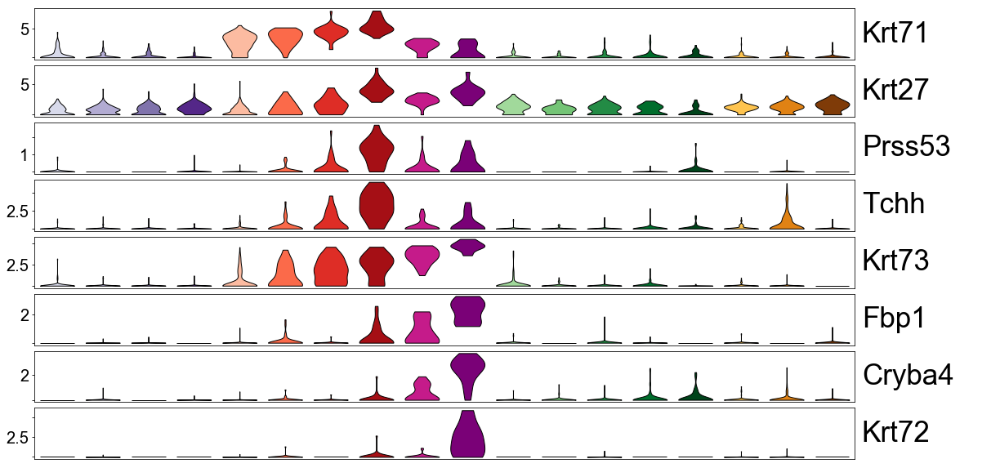

In [63]:
data = seqN
cells = cl_c_ANA_
groups = ['ANA - 12','ANA - 15', 'ANA - 13', 'ANA - 16',
          'ANA - 18','ANA - IRS - 3','ANA - IRS - 4','ANA - IRS - 1','ANA - IRS - 2','ANA - IRS - 0',
          'ANA - 14','ANA - 6','ANA - 7','ANA - 10','ANA - 11',
          'ANA - 17','ANA - 5','ANA - 4',]
genes = ['Krt71','Krt27','Prss53','Tchh','Krt73','Fbp1','Cryba4','Krt72']
cmap = cmap_2nd

#create figure

width = 1 * len(groups) + 3
height = 1.2 * len(genes) + 3

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#specify grid

gs = plt.GridSpec(len(genes)+1, len(groups)+1, hspace = 0.1, wspace = 0,
                  width_ratios = [1] * len(groups) + [3], height_ratios = [1.5] * len(genes) + [3])

#iterate over genes

for i, g in enumerate(genes):
    
    #print gene name
    
    ax = plt.subplot(gs[i,-1])
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.text(0.05, 0.5, g, family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
    clean_axis(ax)
    
    #print violin plots
    
    ax = plt.subplot(gs[i,:-1])
    ax.set_xlim(-0.5, len(groups) - 0.5)
    ax.set_xticks([])
    
    #iterate over groups
    
    for p, gr in enumerate(groups):
        c_gr = cells[cells==gr].index
        violin = ax.violinplot([np.log2(data.loc[g, c_gr]+1)],
                               positions = [p],
                               vert=True,
                               showextrema=False,
                               widths=0.75,)
        
        for v in violin['bodies']:
            v.set_edgecolor('black')
            v.set_facecolor(cmap[gr])
            v.set_linewidth(1)
            v.set_alpha(1.0)
        """    
        ax.scatter(p,
                   np.median(data.loc[g, c_gr]),
                   color = 'black', marker = 'o', s = 5, zorder = 2)
        """   
        for ix, t in enumerate(ax.yaxis.get_ticklabels()):
            if ix % 2 == 0:
                t.set_family('Arial')
                t.set_fontsize(20)
            else:
                t.set_visible(False)
            
figname = 'v1.5_ANA_violin_IRS.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Violin plots - CX

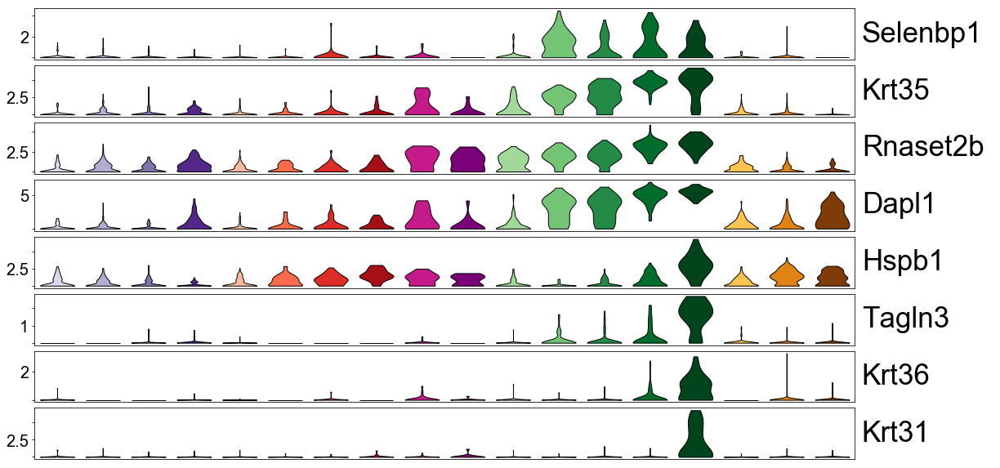

In [64]:
data = seqN
cells = cl_c_ANA_
groups = ['ANA - 12','ANA - 15', 'ANA - 13', 'ANA - 16',
          'ANA - 18','ANA - IRS - 3','ANA - IRS - 4','ANA - IRS - 1','ANA - IRS - 2','ANA - IRS - 0',
          'ANA - 14','ANA - 6','ANA - 7','ANA - 10','ANA - 11',
          'ANA - 17','ANA - 5','ANA - 4',]
genes = ['Selenbp1','Krt35','Rnaset2b','Dapl1','Hspb1','Tagln3','Krt36','Krt31']
cmap = cmap_2nd

#create figure

width = 1 * len(groups) + 3
height = 1.2 * len(genes) + 3

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#specify grid

gs = plt.GridSpec(len(genes)+1, len(groups)+1, hspace = 0.1, wspace = 0,
                  width_ratios = [1] * len(groups) + [3], height_ratios = [1.5] * len(genes) + [3])

#iterate over genes

for i, g in enumerate(genes):
    
    #print gene name
    
    ax = plt.subplot(gs[i,-1])
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.text(0.05, 0.5, g, family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
    clean_axis(ax)
    
    #print violin plots
    
    ax = plt.subplot(gs[i,:-1])
    ax.set_xlim(-0.5, len(groups) - 0.5)
    ax.set_xticks([])
    
    #iterate over groups
    
    for p, gr in enumerate(groups):
        c_gr = cells[cells==gr].index
        violin = ax.violinplot([np.log2(data.loc[g, c_gr]+1)],
                               positions = [p],
                               vert=True,
                               showextrema=False,
                               widths=0.75,)
        
        for v in violin['bodies']:
            v.set_edgecolor('black')
            v.set_facecolor(cmap[gr])
            v.set_linewidth(1)
            v.set_alpha(1.0)
        """    
        ax.scatter(p,
                   np.median(data.loc[g, c_gr]),
                   color = 'black', marker = 'o', s = 5, zorder = 2)
        """   
        for ix, t in enumerate(ax.yaxis.get_ticklabels()):
            if ix % 2 == 0:
                t.set_family('Arial')
                t.set_fontsize(20)
            else:
                t.set_visible(False)
            
figname = 'v1.5_ANA_violin_CX.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Violin plots - MED

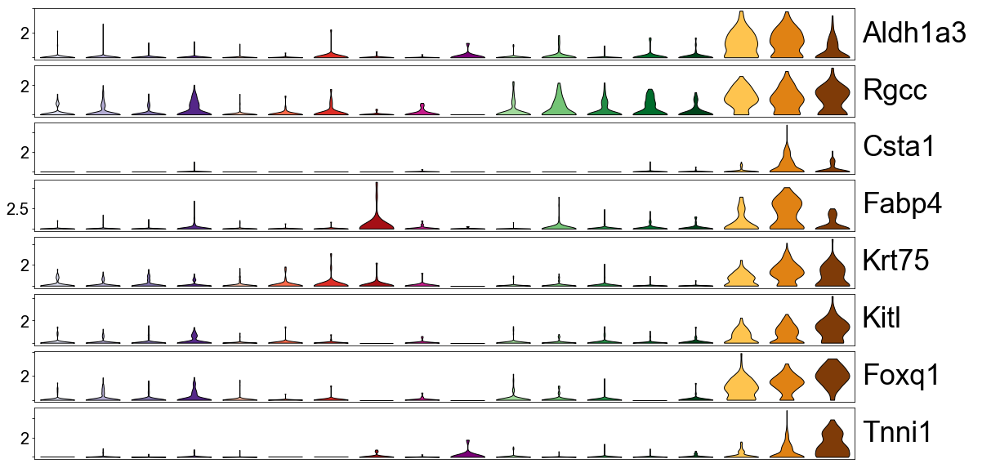

In [65]:
data = seqN
cells = cl_c_ANA_
groups = ['ANA - 12','ANA - 15', 'ANA - 13', 'ANA - 16',
          'ANA - 18','ANA - IRS - 3','ANA - IRS - 4','ANA - IRS - 1','ANA - IRS - 2','ANA - IRS - 0',
          'ANA - 14','ANA - 6','ANA - 7','ANA - 10','ANA - 11',
          'ANA - 17','ANA - 5','ANA - 4',]
genes = ['Aldh1a3','Rgcc','Csta1','Fabp4','Krt75','Kitl','Foxq1','Tnni1',]
cmap = cmap_2nd

#create figure

width = 1 * len(groups) + 3
height = 1.2 * len(genes) + 3

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#specify grid

gs = plt.GridSpec(len(genes)+1, len(groups)+1, hspace = 0.1, wspace = 0,
                  width_ratios = [1] * len(groups) + [3], height_ratios = [1.5] * len(genes) + [3])

#iterate over genes

for i, g in enumerate(genes):
    
    #print gene name
    
    ax = plt.subplot(gs[i,-1])
    ax.set_xlim(0,1)
    ax.set_ylim(0,1)
    ax.text(0.05, 0.5, g, family = 'Arial', fontsize = 35, va = 'center', ha = 'left')
    clean_axis(ax)
    
    #print violin plots
    
    ax = plt.subplot(gs[i,:-1])
    ax.set_xlim(-0.5, len(groups) - 0.5)
    ax.set_xticks([])
    
    #iterate over groups
    
    for p, gr in enumerate(groups):
        c_gr = cells[cells==gr].index
        violin = ax.violinplot([np.log2(data.loc[g, c_gr]+1)],
                               positions = [p],
                               vert=True,
                               showextrema=False,
                               widths=0.75,)
        
        for v in violin['bodies']:
            v.set_edgecolor('black')
            v.set_facecolor(cmap[gr])
            v.set_linewidth(1)
            v.set_alpha(1.0)
        """    
        ax.scatter(p,
                   np.median(data.loc[g, c_gr]),
                   color = 'black', marker = 'o', s = 5, zorder = 2)
        """   
        for ix, t in enumerate(ax.yaxis.get_ticklabels()):
            if ix % 2 == 0:
                t.set_family('Arial')
                t.set_fontsize(20)
            else:
                t.set_visible(False)
            
figname = 'v1.5_ANA_violin_MED.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

# Cell cycle v2

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:44: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


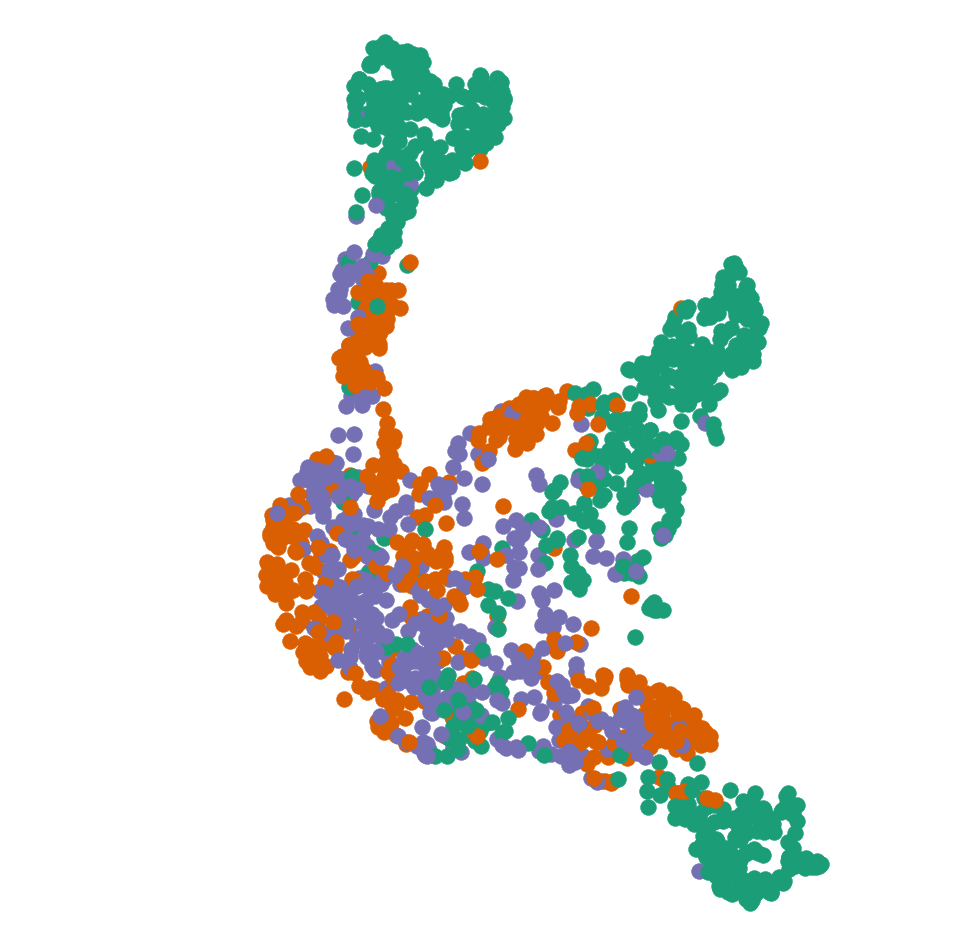

In [81]:
cells = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1','ANA - 21','ANA - 2','ANA - 3','ANA - 20'])]
data = cc_score_v2.loc[cells.index]
tsne = umap_ANA.ix[cells.index]
cmap = {'G1':'#1b9e77','G2M':'#d95f02','S':'#7570b3'}
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 250,
                linewidth = 0.5,
                c = cmap[data[ix]],
                edgecolor=cmap[data[ix]], 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_matrix_cc.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  This is separate from the ipykernel package so we can avoid doing imports until
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:44: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


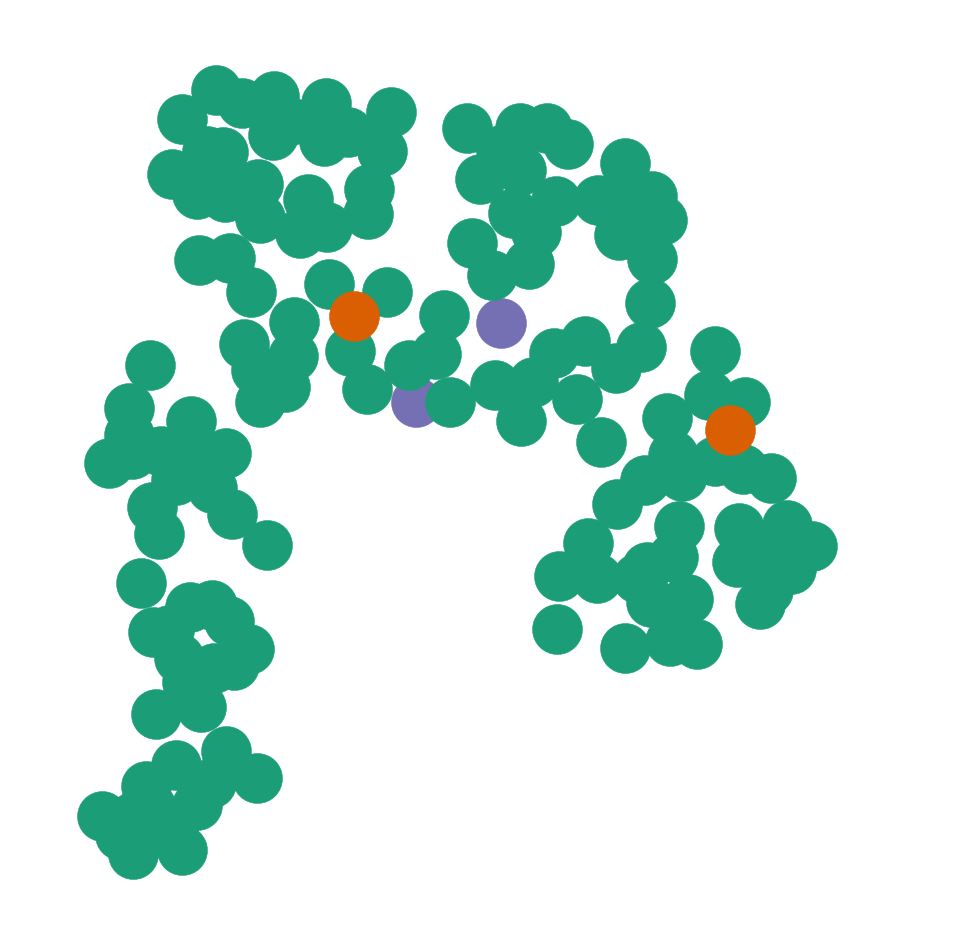

In [84]:
cells = cl_c_ANA[cl_c_ANA.isin(['ANA - 18','ANA - 8'])]
data = cc_score_v2.loc[cells.index]
tsne = umap_ANA_IRS.ix[cells.index]
cmap = {'G1':'#1b9e77','G2M':'#d95f02','S':'#7570b3'}
time = cells_stage
markers = markers_time

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 2500,
                linewidth = 0.5,
                c = cmap[data[ix]],
                edgecolor=cmap[data[ix]], 
                marker = markers[time[ix]])

clean_axis(ax1)

figname = 'v1.5_Fig4_matrix_IRS_cc.pdf'
plt.savefig('%s/%s' % (path_figures, figname), 
            format = 'pdf', 
            transparent = True, 
            bbox_inches = 'tight', 
            pad_inches = 0, 
            rasterized = True)